In [1]:
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [2]:
import torch
from transformers import AutoTokenizer
import os
import pandas as pd

from src.router_loading_utils import create_dataset_routing_statistics
from src.router_distribution_analysis import (
    get_global_router_distribution,
    get_per_expert_router_distribution,
    get_per_layer_router_distribution,
    get_average_experts_per_token_by_layer,
)
from src.visualize import plot_router_distribution, plot_per_expert_router_distribution, plot_per_layer_router_distribution, plot_average_experts_per_range_by_layer, plot_deactivated_experts_by_threshold

/users/anowak/developer/moe-router-exploration/venv-arm/lib/python3.12/site-packages/transformers/utils/hub.py:111: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(
Error.  nthreads cannot be larger than environment variable "NUMEXPR_MAX_THREADS" (64)

# What is the purpose of this idea?

At first I thought about this idea, because of zero-computation experts idea I have been working on. Seeing how the model could learn with this idea and also seeing the [longcat-flash paper](https://arxiv.org/abs/2509.01322), I thought what if maybe MoEs already learn this idea of not paying attention to some of the experts in the top-k for a token.

First I thought that maybe the values the router score gives would be very low for some experts in the top-k (like 0.0001), but after seeing the probability distributions I remembered that at the end of the day what we are trying to do is to have all experts be selected with a somewhat uniform distribution with the balancing methods we do, so it makes sense that all of them wouldn't have very low router values score. But in the end I still decided to try what happens if decide that in the top-k if the router score for some expert is below a threshold we put it to 0, meaning we basically don't use the output value of that expert in the weighted sum, and in the end at least for the evals shown here, it seems that it does work for some models. 

The results are at the end of the notebook [evaluations](#Evaluations)

## Explanation


**Here the router distributions we will visualize come from the probability distribution from the experts when they are inside the top-k. For some models the top-k probability distribution will be renormalized to 1, but for others it will not, here we want to visualize the value (or we can call it score) that is literally being used in the weighted sum (so as to see how much they are contributing to the weighted sum)**

So it is better to say we are visualizing the scores and not the probabilities (as the values inside the top-k for majority of the models are not renormalized and some do a router scaling after the renormalization of the top-k)

What we do for each dataset:
- For MMLU and MMLU pro we only pass the question as input to the model and that is what we are visualizing here with the router distributions (the same thing that lm_eval will pass)
- For Hellaswag we only pass the ctx (so ctx_a + ctx_b) and that is the router distributions we visualize (the same thing that lm_eval will pass)
- For AllenAi arc we only pass question as input and that is the router distributions we visualize (In lm_eval they pass 'Question: {{question}}`\n`Answer:'). Also we visualize both challenge and easy together 
- For winogrande we have everything before '_' and then we add the option (we create one input for each option) (This is the same as in lm_eval, and maybe it wasn't necessary to add the option, just the text before '_', we just do this to show the router distributions that should be happening in the evaluations)
- **For all datasets we don't visualize the router scores for padding tokens**


All this visualizations are being done to understand what is it that we are doing when making everything below a threshold, with this we can see if in reality we are affecting a lot of experts and understand what thresholds are important and also seeing what is the score values the router decides to assign to experts in the top-k


**Also all the models we are testing are base models except for gpt-oss (which doesn't have a base model)**

# Deepseek-MoE

*layer 0 in deepseek-moe is dense and the top-k in deepseek-moe is of 6 and it has 64 routable experts and 2 shared experts*

## MMLU

In [3]:
deepseek_moe_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/cais-mmlu"
deepseek_moe_root_path = os.path.expandvars(deepseek_moe_root_path)

deepseek_moe_subject_list = create_dataset_routing_statistics(deepseek_moe_root_path)

Found: virology/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/cais-mmlu/virology/EN/router_distributions.pt
Found: computer_security/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/cais-mmlu/computer_security/EN/router_distributions.pt
Found: high_school_us_history/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/cais-mmlu/high_school_us_history/EN/router_distributions.pt
Found: professional_accounting/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/cais-mmlu/professional_accounting/EN/router_distributions.pt
Found: college_medicine/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-explorat

### Global router distribution

In [4]:
deepseek_moe_global_probs = get_global_router_distribution(deepseek_moe_subject_list)

Global probs shape: torch.Size([213758676])


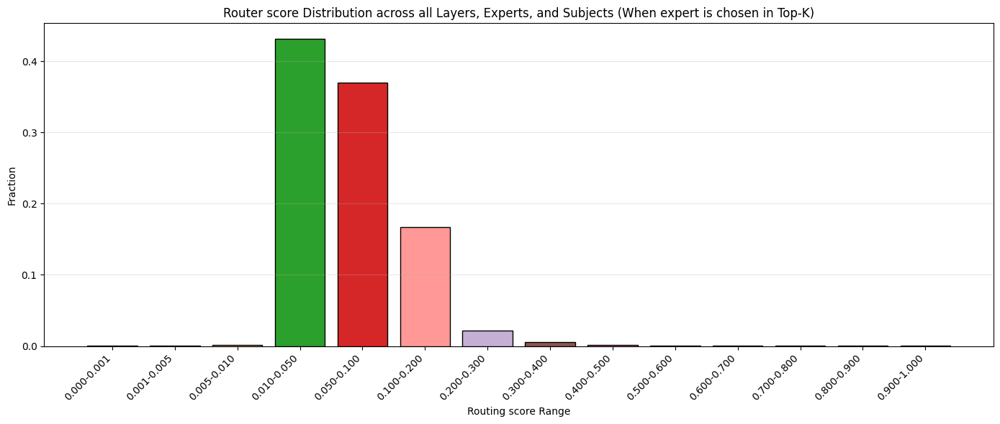

In [5]:
print(f"Global probs shape: {deepseek_moe_global_probs.shape}")
plot_router_distribution(deepseek_moe_global_probs)

### Per layer distribution

In [6]:
deepseek_per_layer_probs = get_per_layer_router_distribution(deepseek_moe_subject_list)

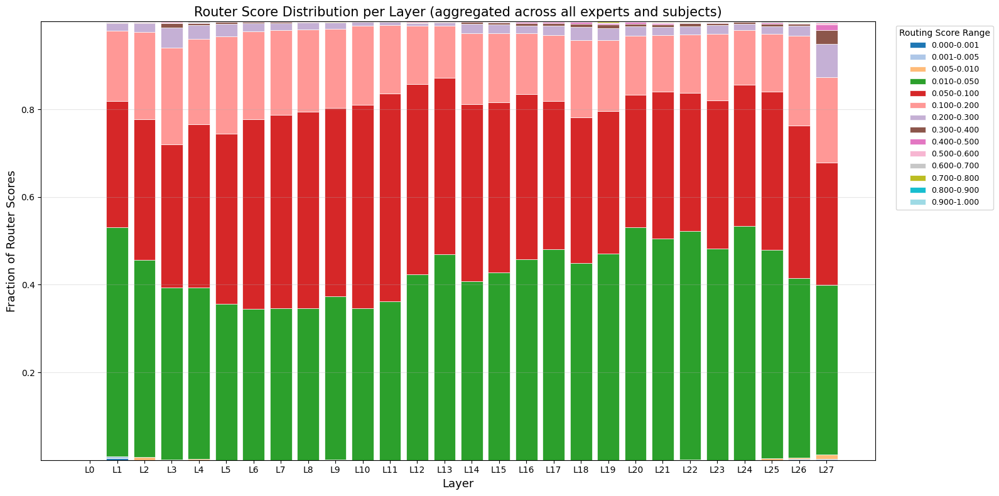

In [7]:
plot_per_layer_router_distribution(deepseek_per_layer_probs) 

### Per expert router distribution (when it appeared in the top-k of a token)

In [8]:
deepseek_moe_per_expert_probs = get_per_expert_router_distribution(deepseek_moe_subject_list)

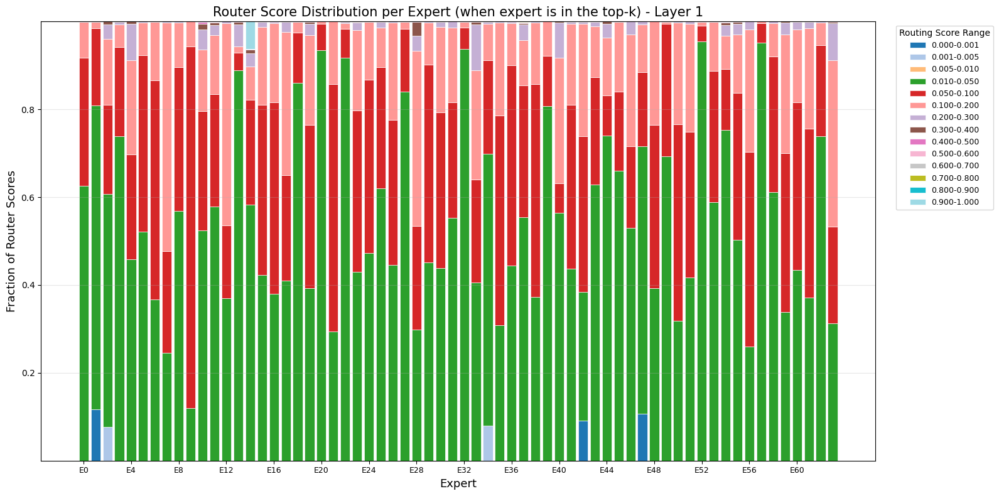

In [9]:
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=1)

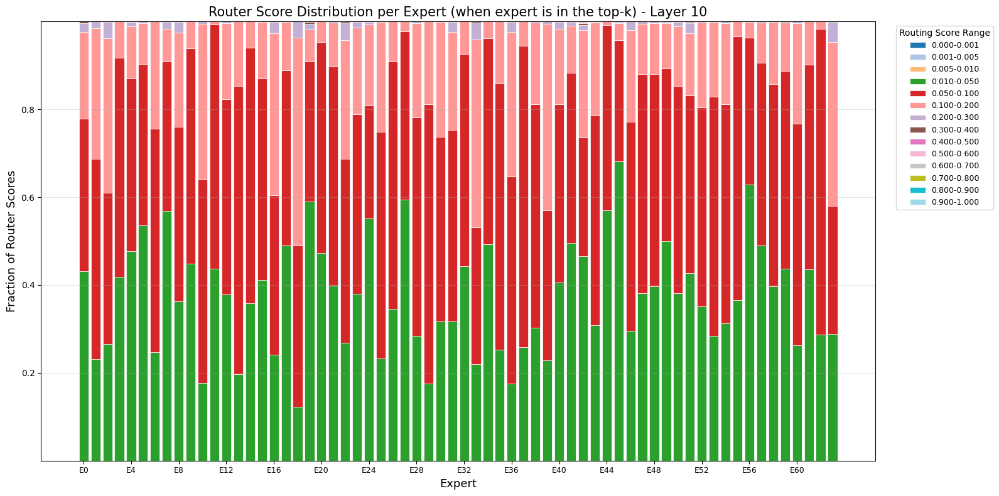

In [10]:
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=10)

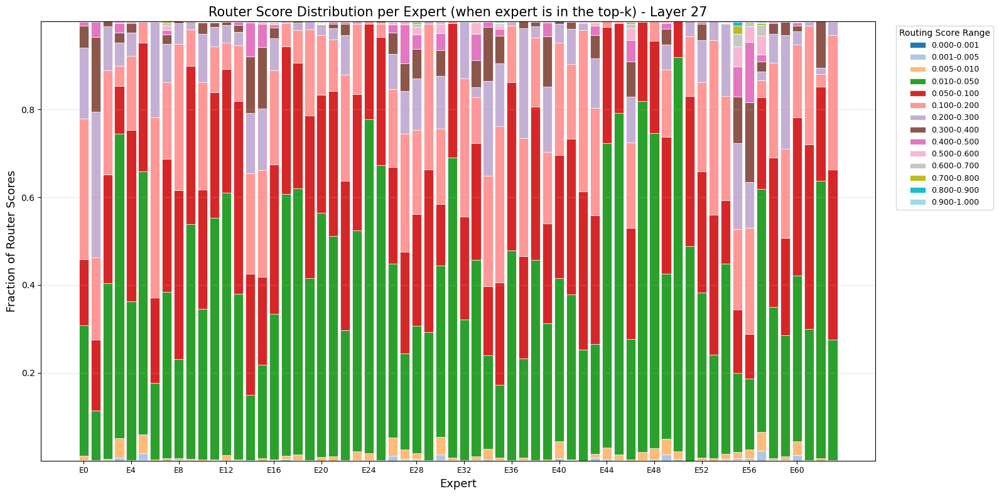

In [11]:
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=27)


### Mean deactivated TopK experts by threshold per layer

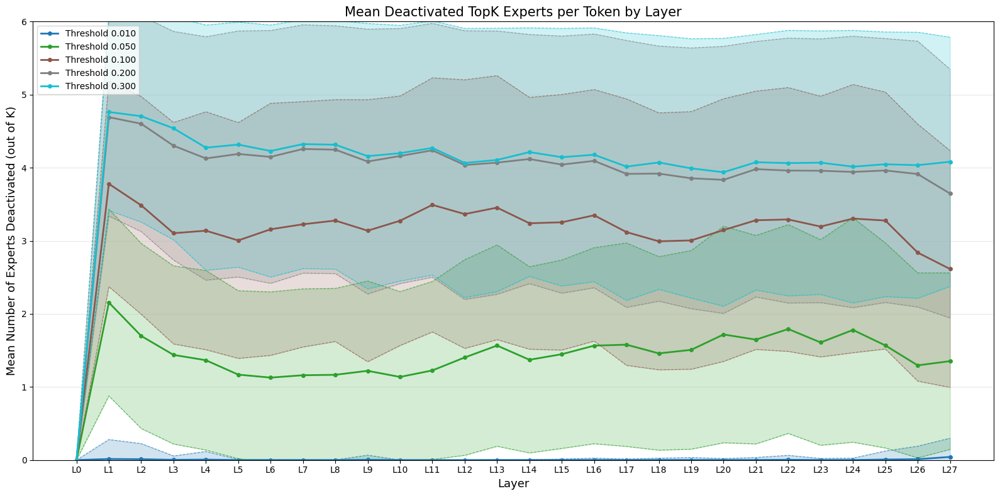

In [12]:
_ = plot_deactivated_experts_by_threshold(deepseek_moe_subject_list, [0.01, 0.05, 0.1, 0.2, 0.3])

## MMLU PRO

In [13]:
deepseek_moe_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/TIGER-Lab-MMLU-Pro"
deepseek_moe_root_path = os.path.expandvars(deepseek_moe_root_path)

deepseek_moe_subject_list = create_dataset_routing_statistics(deepseek_moe_root_path)

Found: biology/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/TIGER-Lab-MMLU-Pro/biology/EN/router_distributions.pt
Found: chemistry/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/TIGER-Lab-MMLU-Pro/chemistry/EN/router_distributions.pt
Found: physics/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/TIGER-Lab-MMLU-Pro/physics/EN/router_distributions.pt
Found: engineering/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/TIGER-Lab-MMLU-Pro/engineering/EN/router_distributions.pt
Found: economics/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/deepseek-

### Global router distribution

In [14]:
deepseek_moe_global_probs = get_global_router_distribution(deepseek_moe_subject_list)

Global probs shape: torch.Size([352459674])


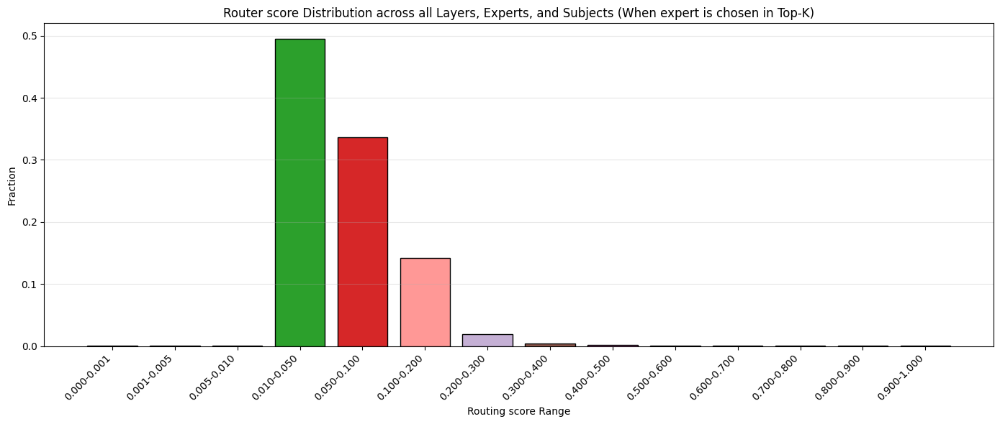

In [15]:
print(f"Global probs shape: {deepseek_moe_global_probs.shape}")
plot_router_distribution(deepseek_moe_global_probs)

the interesting here is that this model is the one that has the one that has the biggest fraction of probability values in routing in the top-k below 0.01 compared to the other MoE models we are testing here*

### Per layer distribution

In [16]:
deepseek_per_layer_probs = get_per_layer_router_distribution(deepseek_moe_subject_list)

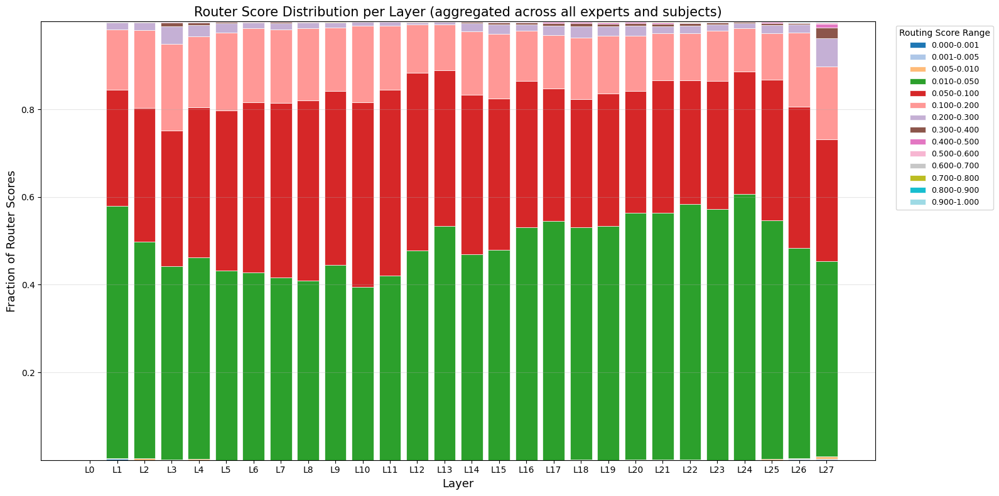

In [17]:
plot_per_layer_router_distribution(deepseek_per_layer_probs)

### Per expert Router distribution

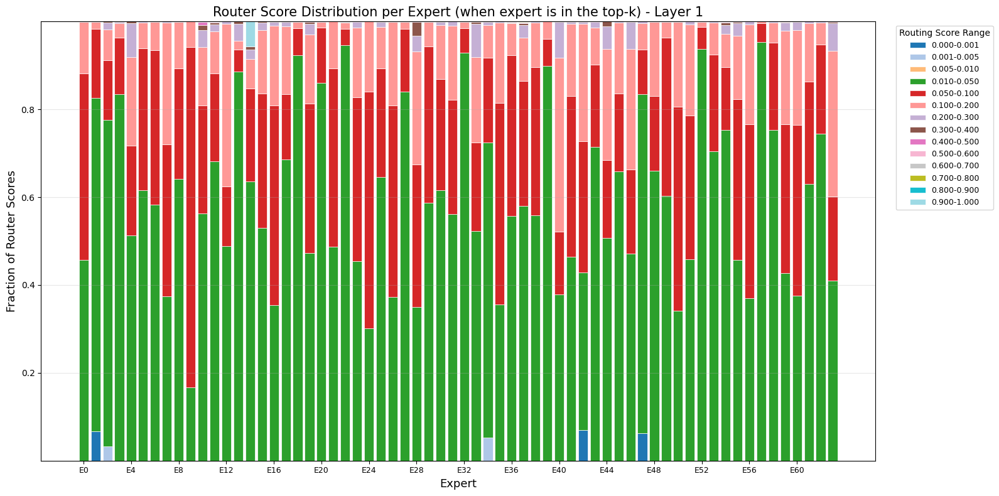

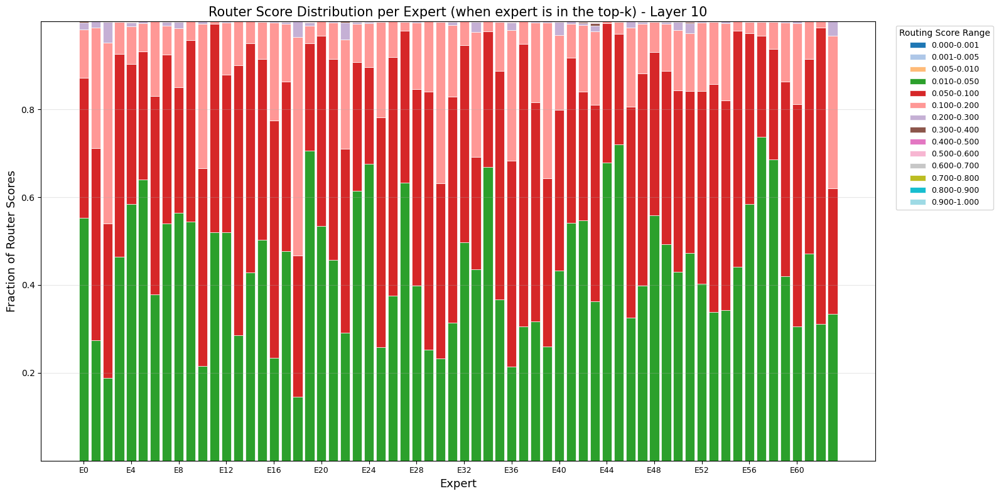

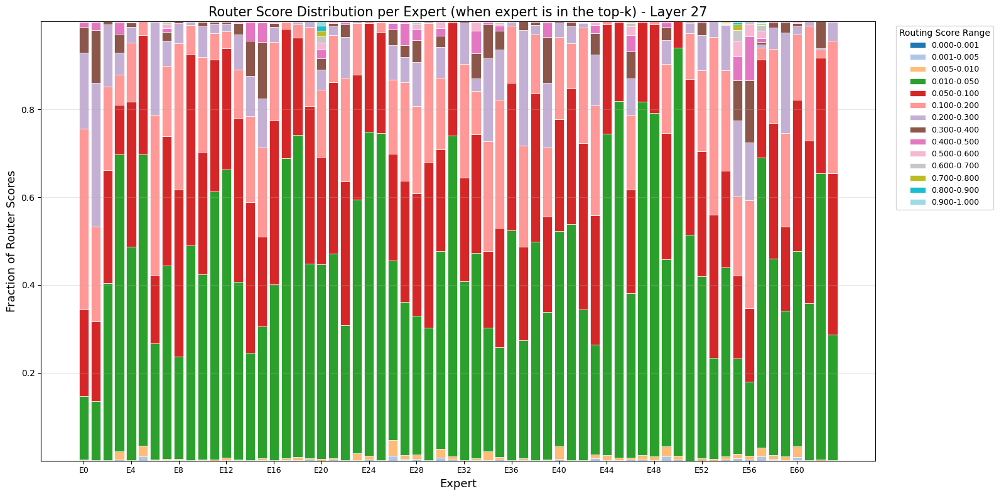

In [18]:
deepseek_moe_per_expert_probs = get_per_expert_router_distribution(
    deepseek_moe_subject_list
)
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=1)
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=10)
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=27)

## Hellaswag

In [19]:
deepseek_moe_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/Rowan-hellaswag"
deepseek_moe_root_path = os.path.expandvars(deepseek_moe_root_path)

deepseek_moe_subject_list = create_dataset_routing_statistics(deepseek_moe_root_path)

Found: general/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/Rowan-hellaswag/general/EN/router_distributions.pt


### Global router distribution

In [20]:
deepseek_moe_global_probs = get_global_router_distribution(deepseek_moe_subject_list)

Global probs shape: torch.Size([85149954])


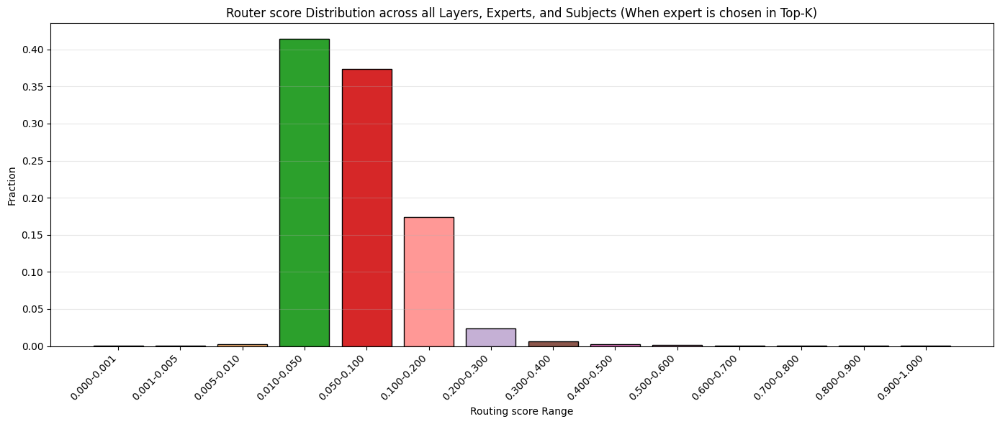

In [21]:
print(f"Global probs shape: {deepseek_moe_global_probs.shape}")
plot_router_distribution(deepseek_moe_global_probs)

### Per layer distribution

In [22]:
deepseek_per_layer_probs = get_per_layer_router_distribution(deepseek_moe_subject_list)

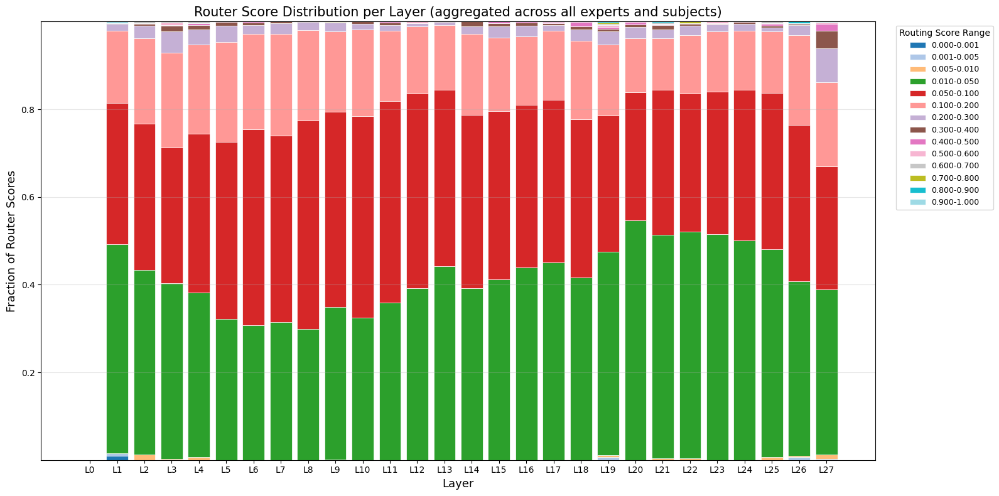

In [23]:
plot_per_layer_router_distribution(deepseek_per_layer_probs)

### Per expert router distribution

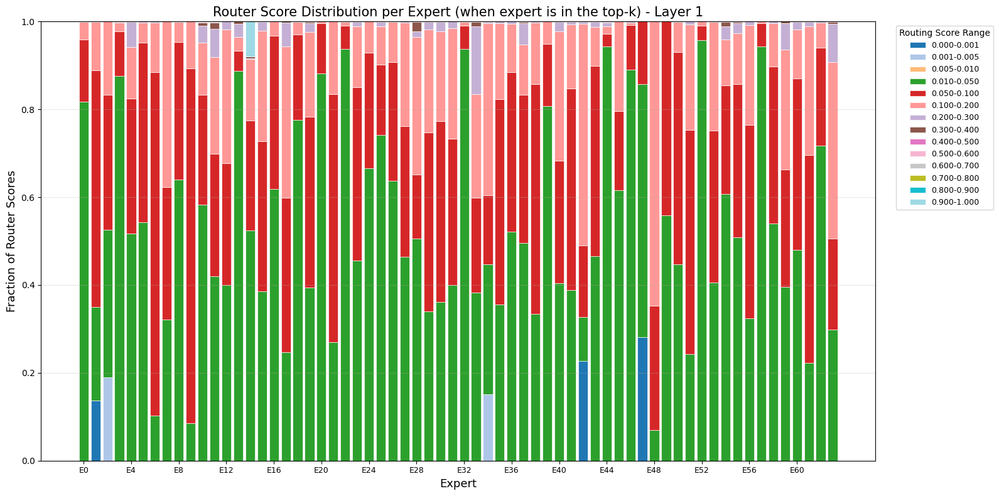

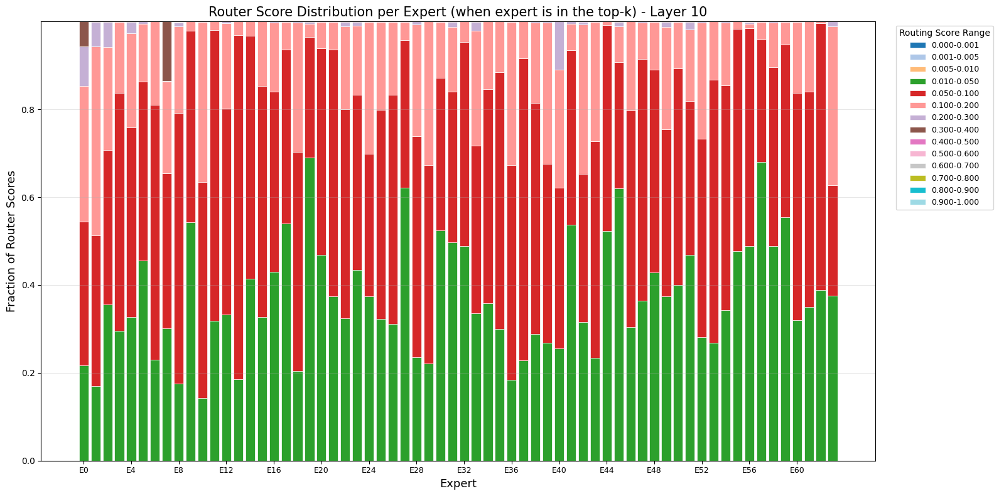

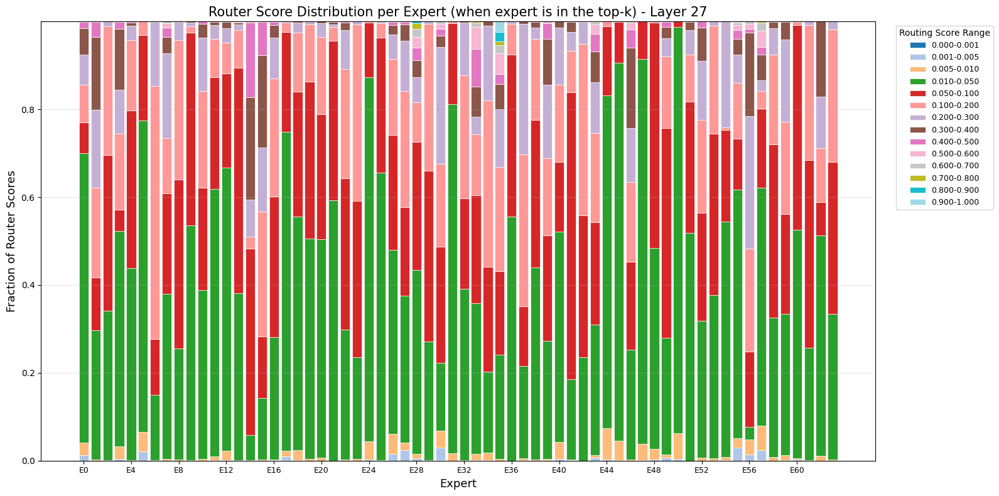

In [24]:
deepseek_moe_per_expert_probs = get_per_expert_router_distribution(deepseek_moe_subject_list)
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=1)
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=10)
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=27)

### Mean deactivated TopK experts by threshold per layer

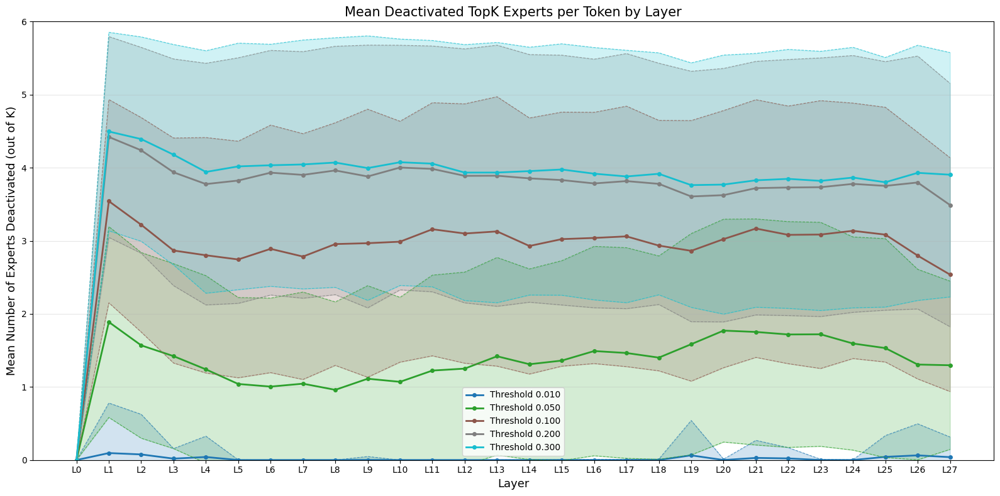

In [25]:
_ = plot_deactivated_experts_by_threshold(deepseek_moe_subject_list, [0.01, 0.05, 0.1, 0.2, 0.3])

## ARC

In [26]:
deepseek_moe_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/allenai-ai2_arc"
deepseek_moe_root_path = os.path.expandvars(deepseek_moe_root_path)

deepseek_moe_subject_list = create_dataset_routing_statistics(deepseek_moe_root_path)

Found: ARC-Challenge/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/allenai-ai2_arc/ARC-Challenge/EN/router_distributions.pt
Found: ARC-Easy/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/allenai-ai2_arc/ARC-Easy/EN/router_distributions.pt


### Global router distribution

In [27]:
deepseek_moe_global_probs = get_global_router_distribution(deepseek_moe_subject_list)

Global probs shape: torch.Size([14364216])


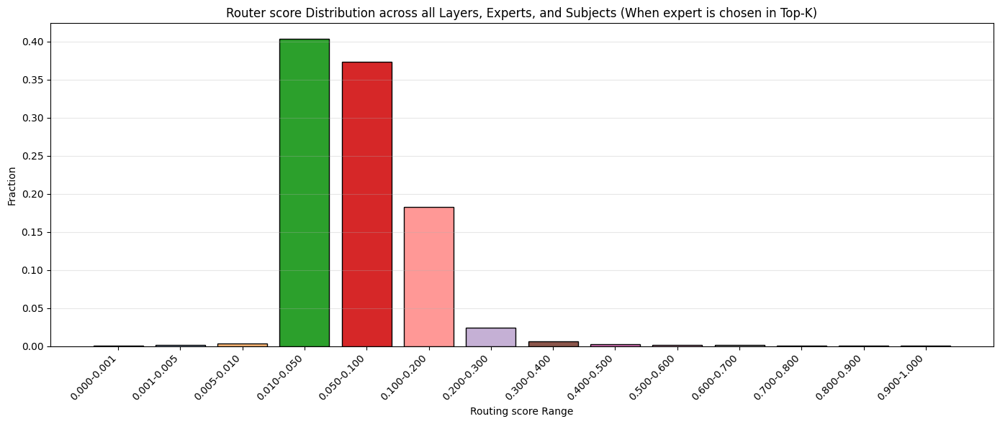

In [28]:
print(f"Global probs shape: {deepseek_moe_global_probs.shape}")
plot_router_distribution(deepseek_moe_global_probs)

### Per layer distribution

In [29]:
deepseek_per_layer_probs = get_per_layer_router_distribution(deepseek_moe_subject_list)

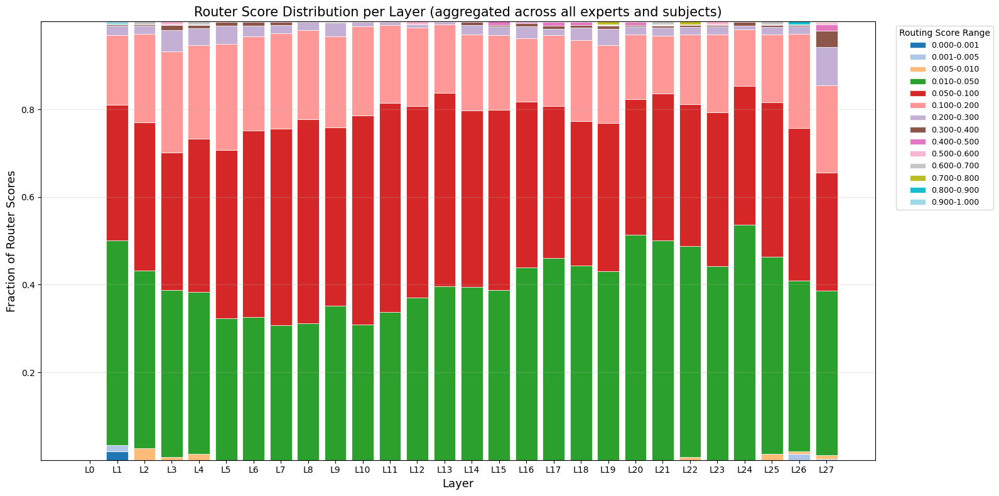

In [30]:
plot_per_layer_router_distribution(deepseek_per_layer_probs)

### Per expert router distribution

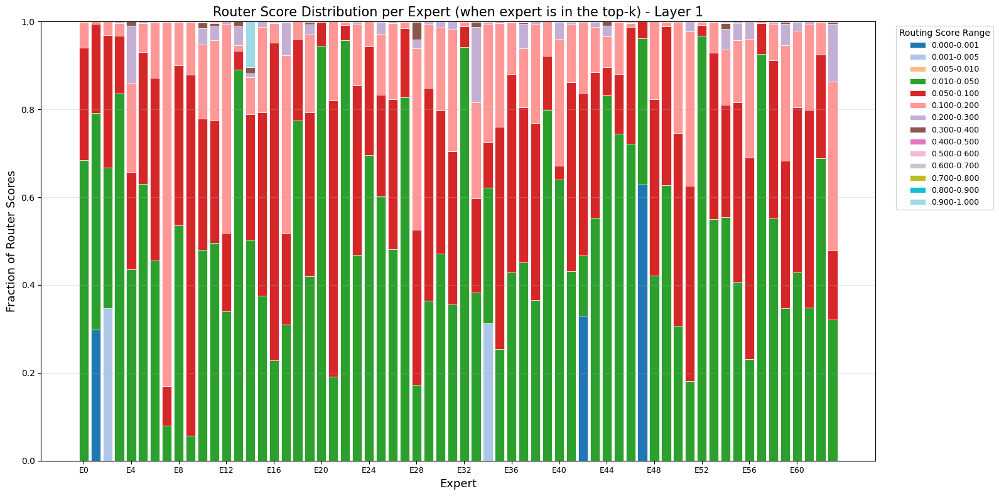

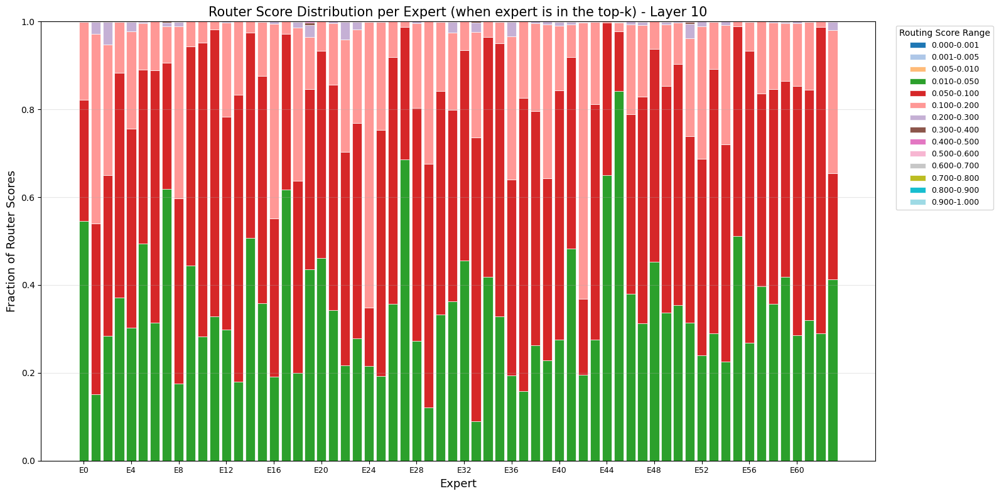

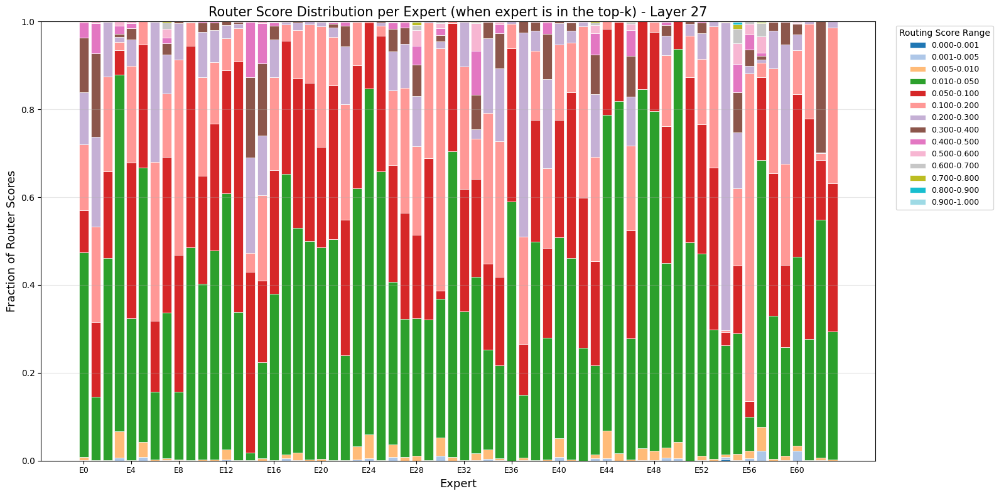

In [31]:
deepseek_moe_per_expert_probs = get_per_expert_router_distribution(deepseek_moe_subject_list)
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=1)
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=10)
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=27)

### Mean deactivated TopK experts by threshold per layer

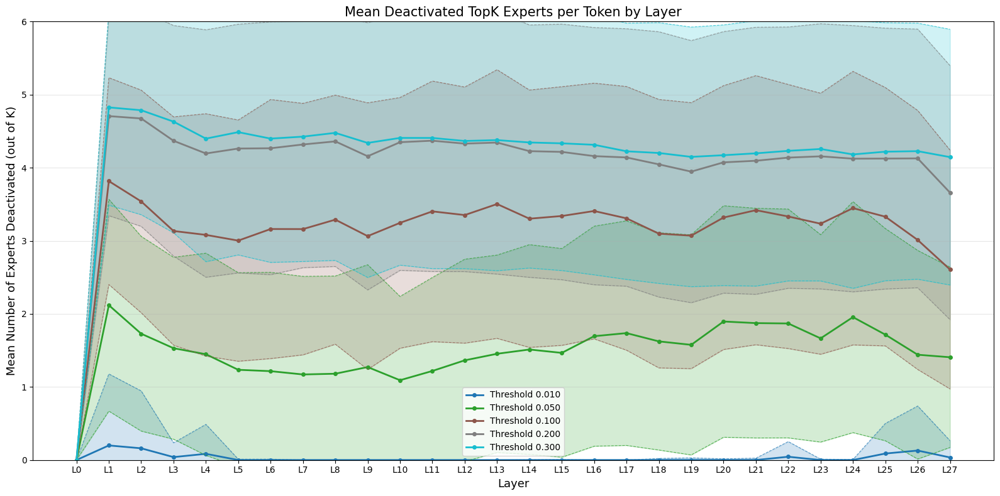

In [32]:
_ = plot_deactivated_experts_by_threshold(deepseek_moe_subject_list, [0.01, 0.05, 0.1, 0.2, 0.3])

## Winogrande

In [33]:
deepseek_moe_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/allenai-winogrande"
deepseek_moe_root_path = os.path.expandvars(deepseek_moe_root_path)

deepseek_moe_subject_list = create_dataset_routing_statistics(deepseek_moe_root_path)

Found: winogrande_xl/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/deepseek-ai-deepseek-moe-16b-base/allenai-winogrande/winogrande_xl/EN/router_distributions.pt


## Global router distribution

In [34]:
deepseek_moe_global_probs = get_global_router_distribution(deepseek_moe_subject_list)

Global probs shape: torch.Size([7536240])


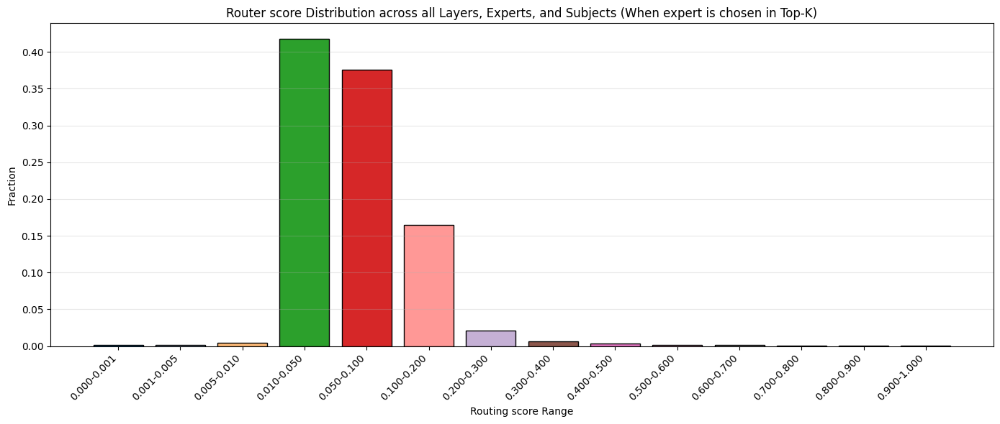

In [35]:
print(f"Global probs shape: {deepseek_moe_global_probs.shape}")
plot_router_distribution(deepseek_moe_global_probs)

### Per layer distribution

In [36]:
deepseek_per_layer_probs = get_per_layer_router_distribution(deepseek_moe_subject_list)

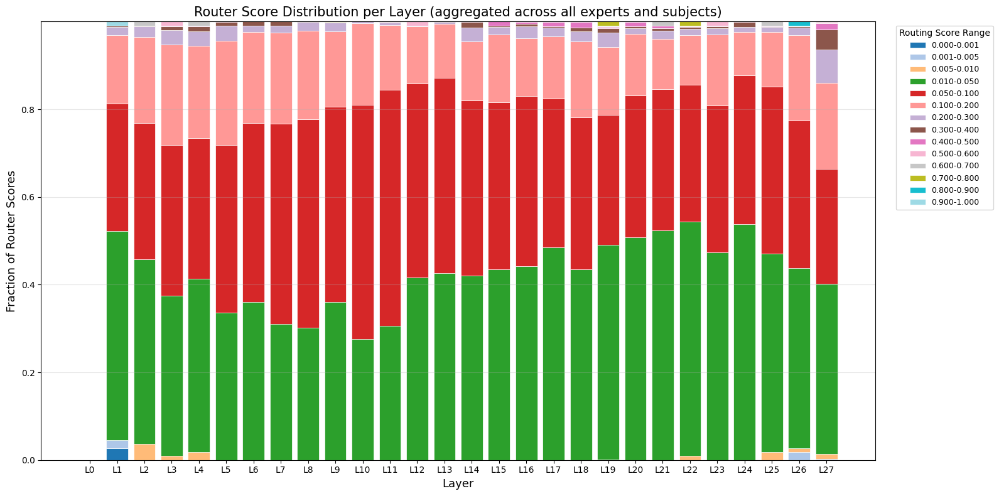

In [37]:
plot_per_layer_router_distribution(deepseek_per_layer_probs)

### Per Expert router distribution

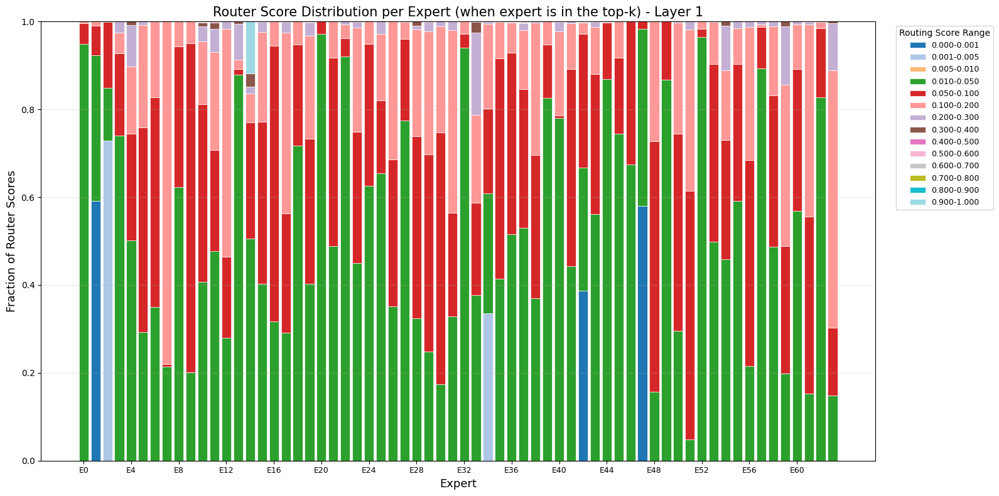

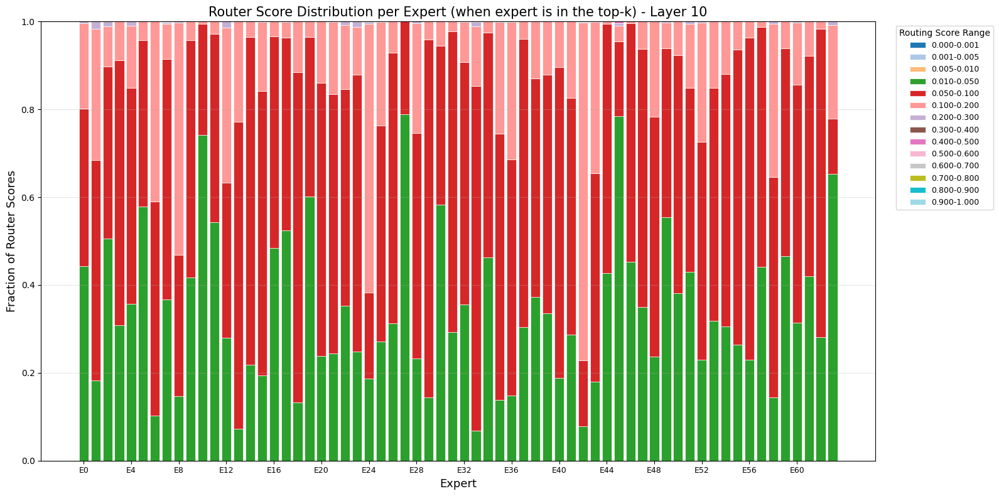

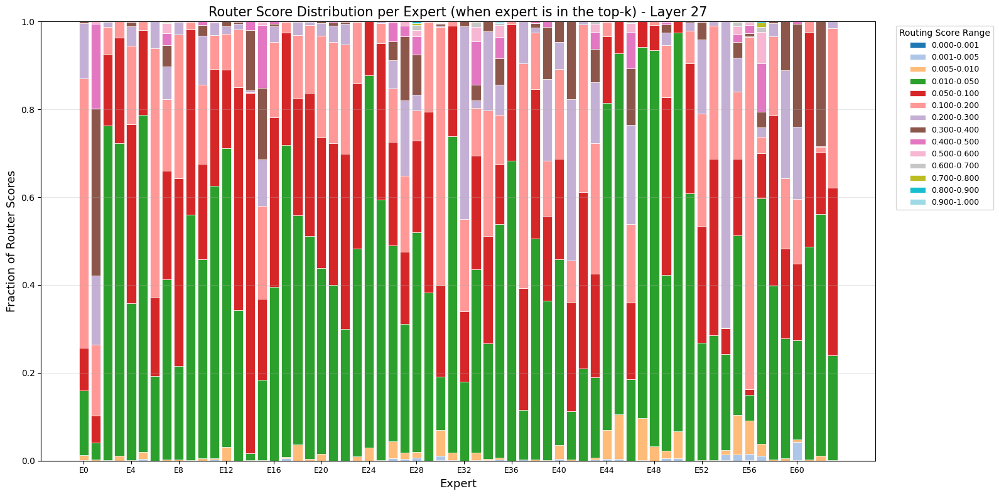

In [38]:
deepseek_moe_per_expert_probs = get_per_expert_router_distribution(deepseek_moe_subject_list)
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=1)
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=10)
plot_per_expert_router_distribution(deepseek_moe_per_expert_probs, layer=27)

### Mean deactivated TopK experts by threshold per layer

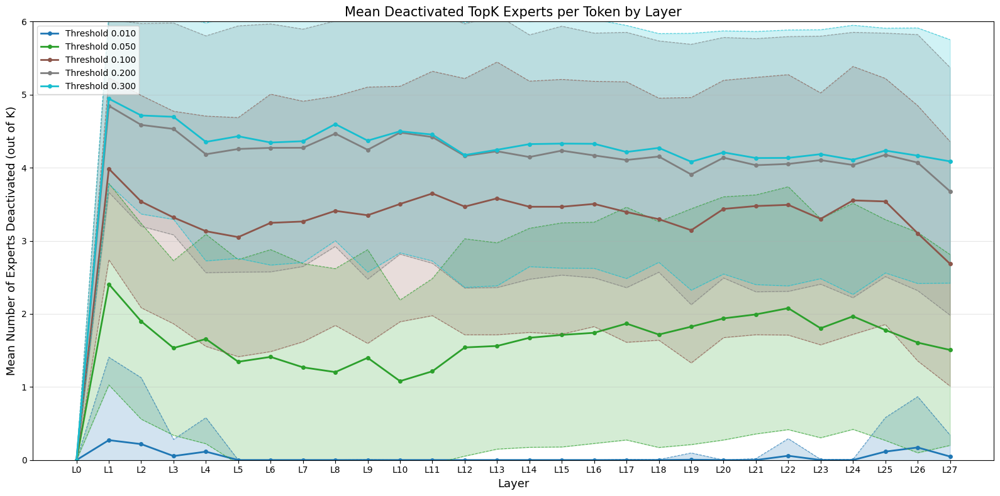

In [39]:
_ = plot_deactivated_experts_by_threshold(deepseek_moe_subject_list, [0.01, 0.05, 0.1, 0.2, 0.3])

In [40]:
# memory cleanup

del deepseek_moe_subject_list
del deepseek_moe_global_probs
del deepseek_per_layer_probs
# del deepseek_per_layer_average_token_distribution

# GPT-OSS

**With GPT-OSS we don't apply the chat template to get the router distributions, so here maybe also the results can change because of this as the hidden state of each token can change between layers if we applied the chat template**

The top-k in this model is of 4 experts and it has 32 routable experts,

## MMLU

In [41]:
gpt_oss_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/cais-mmlu"
gpt_oss_root_path = os.path.expandvars(gpt_oss_root_path)

gpt_oss_subject_list = create_dataset_routing_statistics(gpt_oss_root_path)

Found: virology/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/cais-mmlu/virology/EN/router_distributions.pt
Found: computer_security/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/cais-mmlu/computer_security/EN/router_distributions.pt


Found: high_school_us_history/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/cais-mmlu/high_school_us_history/EN/router_distributions.pt
Found: professional_accounting/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/cais-mmlu/professional_accounting/EN/router_distributions.pt
Found: college_medicine/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/cais-mmlu/college_medicine/EN/router_distributions.pt
Found: world_religions/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/cais-mmlu/world_religions/EN/router_distributions.pt
Found: high_school_microeconomics/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/open

### Global router distribution

In [42]:
gpt_oss_global_probs = get_global_router_distribution(gpt_oss_subject_list)

Global probs shape: torch.Size([118876224])


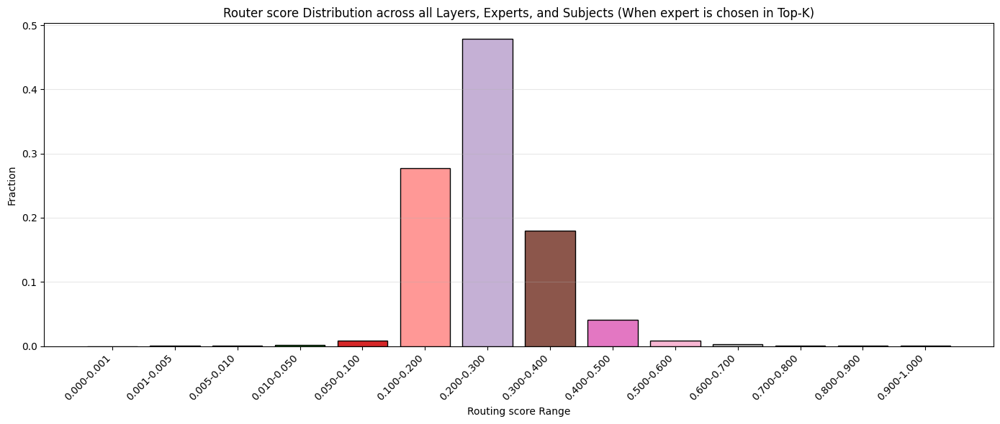

In [43]:
print(f"Global probs shape: {gpt_oss_global_probs.shape}")
plot_router_distribution(gpt_oss_global_probs)

### Per layer router distribution

In [44]:
gpt_oss_per_layer_probs = get_per_layer_router_distribution(gpt_oss_subject_list)

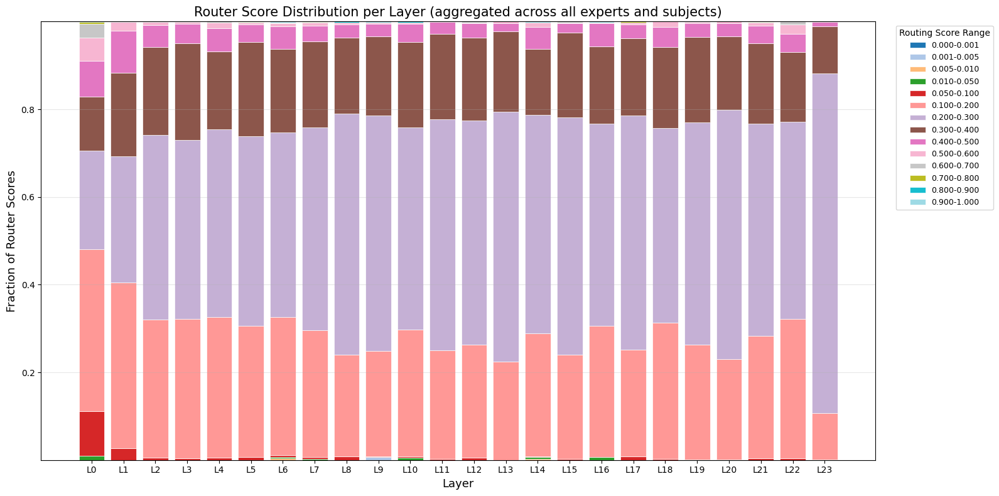

In [45]:
plot_per_layer_router_distribution(gpt_oss_per_layer_probs)

### Per Expert router distribution

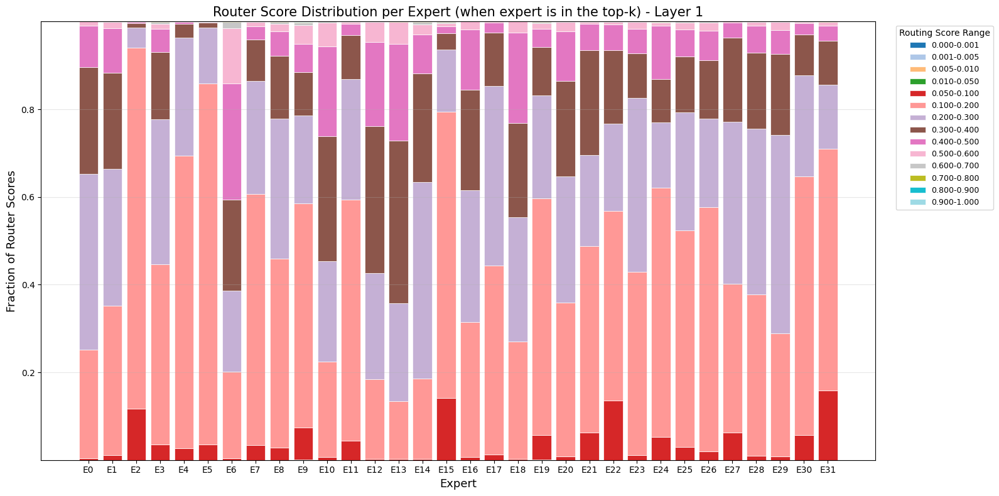

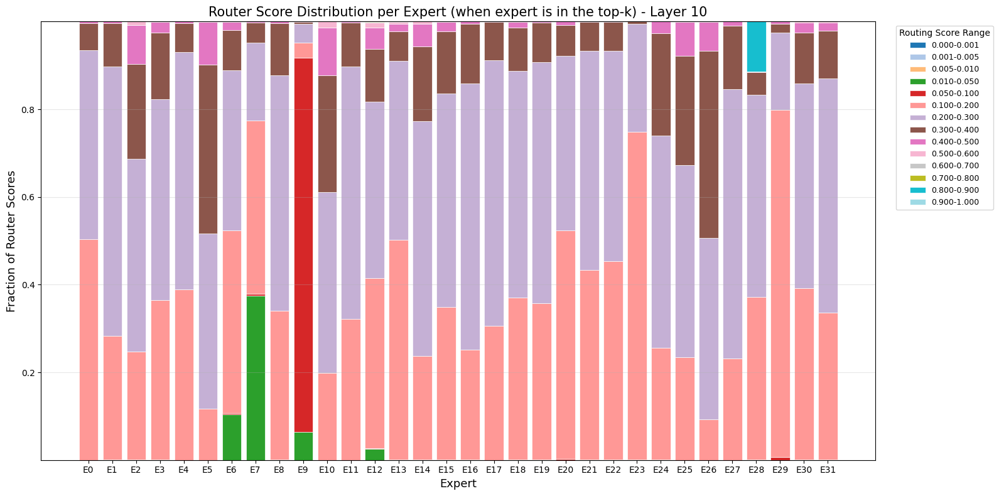

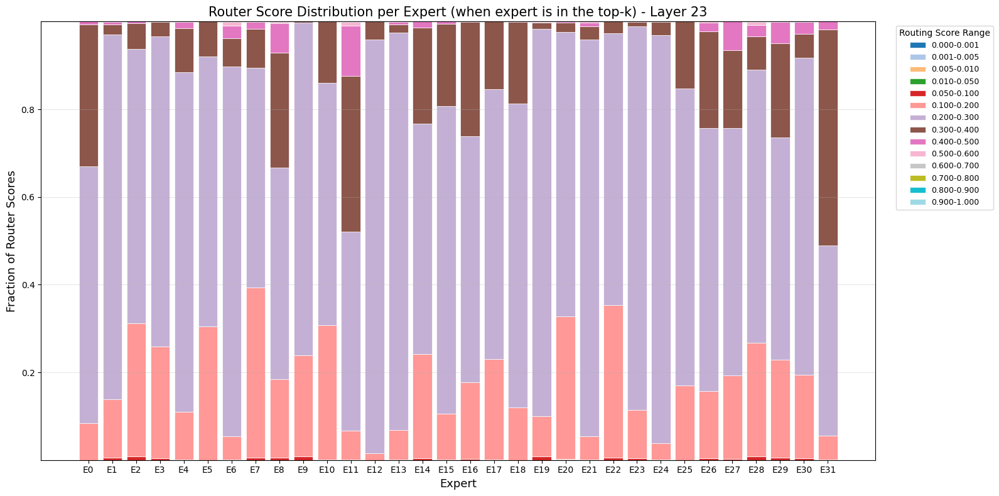

In [46]:
gpt_oss_per_expert_probs = get_per_expert_router_distribution(gpt_oss_subject_list)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=1)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=10)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=23)

### Mean deactivated TopK experts by threshold per layer

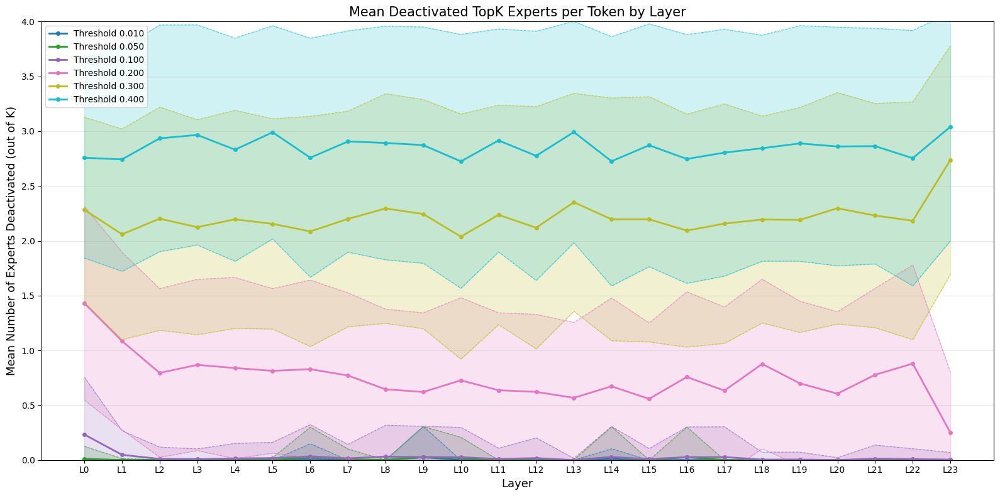

In [47]:
_ = plot_deactivated_experts_by_threshold(gpt_oss_subject_list, [0.01, 0.05, 0.1, 0.2, 0.3, 0.4])

## MMLU PRO

In [48]:
gpt_oss_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/TIGER-Lab-MMLU-Pro"
gpt_oss_root_path = os.path.expandvars(gpt_oss_root_path)

gpt_oss_subject_list = create_dataset_routing_statistics(gpt_oss_root_path)

Found: biology/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/TIGER-Lab-MMLU-Pro/biology/EN/router_distributions.pt
Found: chemistry/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/TIGER-Lab-MMLU-Pro/chemistry/EN/router_distributions.pt
Found: physics/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/TIGER-Lab-MMLU-Pro/physics/EN/router_distributions.pt
Found: engineering/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/TIGER-Lab-MMLU-Pro/engineering/EN/router_distributions.pt
Found: economics/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/TIGER-Lab-MMLU-Pro/economics/EN/router_distributio

### Global router distribution

In [49]:
gpt_oss_global_probs = get_global_router_distribution(gpt_oss_subject_list)
print(f"Global probs shape: {gpt_oss_global_probs.shape}")

Global probs shape: torch.Size([190687104])


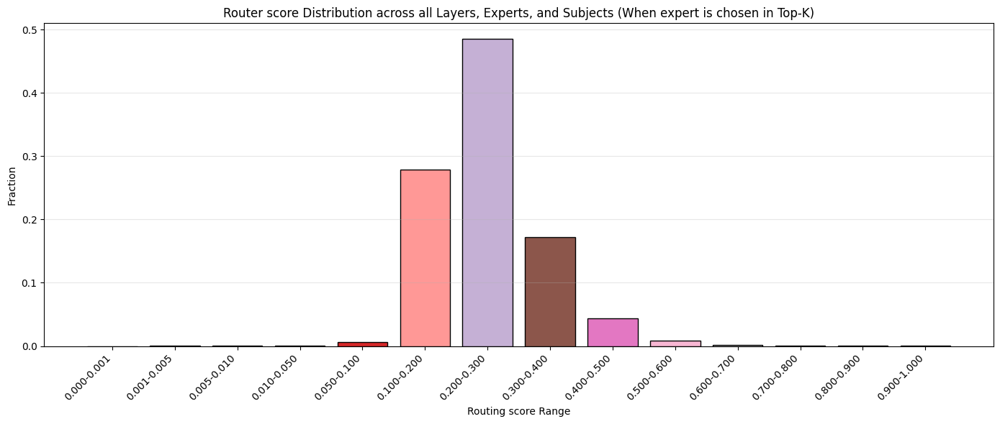

In [50]:
plot_router_distribution(gpt_oss_global_probs)

This model has the highest fraction of high probability routing values in the top-k (having a lot of valeus in the 0.3-0.4 range)

### Per layer router distribution

In [51]:
gpt_oss_per_layer_probs = get_per_layer_router_distribution(gpt_oss_subject_list)

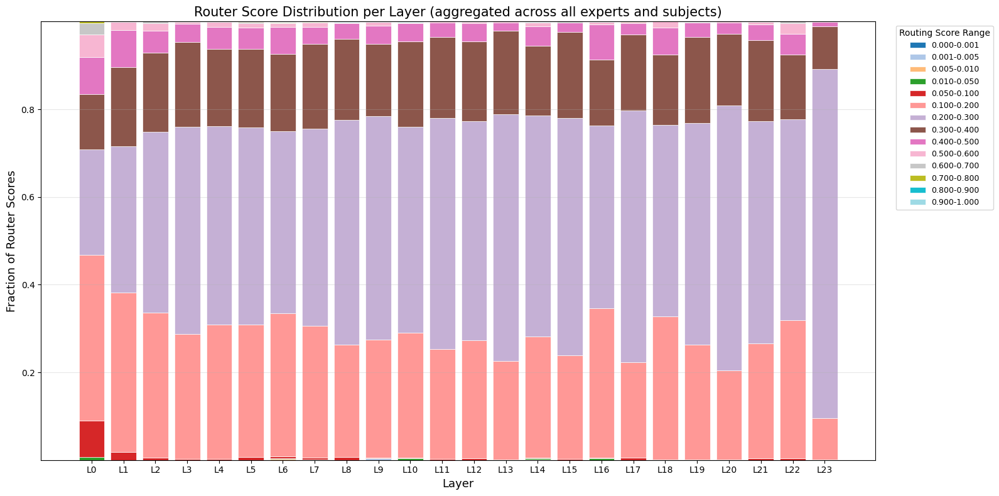

In [52]:
plot_per_layer_router_distribution(gpt_oss_per_layer_probs)

### Per Expert router distribution

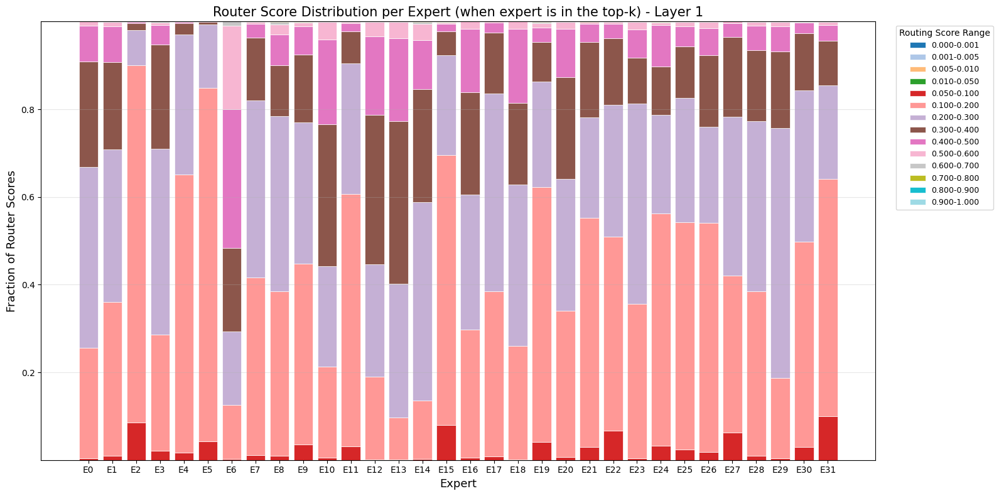

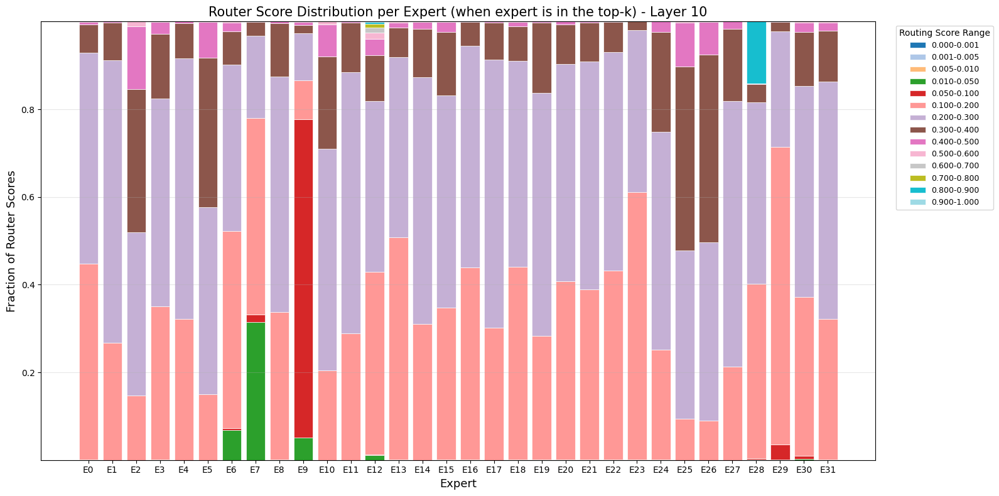

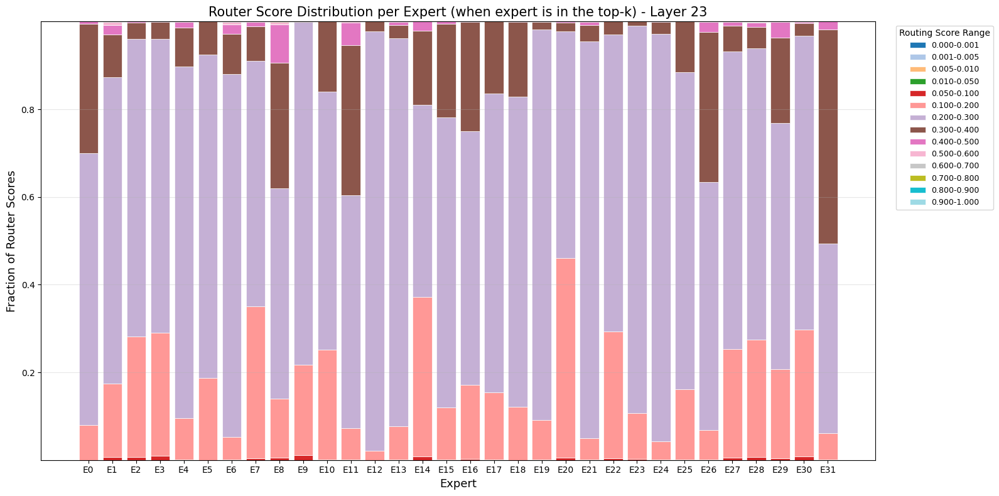

In [53]:
gpt_oss_per_expert_probs = get_per_expert_router_distribution(gpt_oss_subject_list)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=1)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=10)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=23)

### Mean deactivated TopK experts by threshold per layer

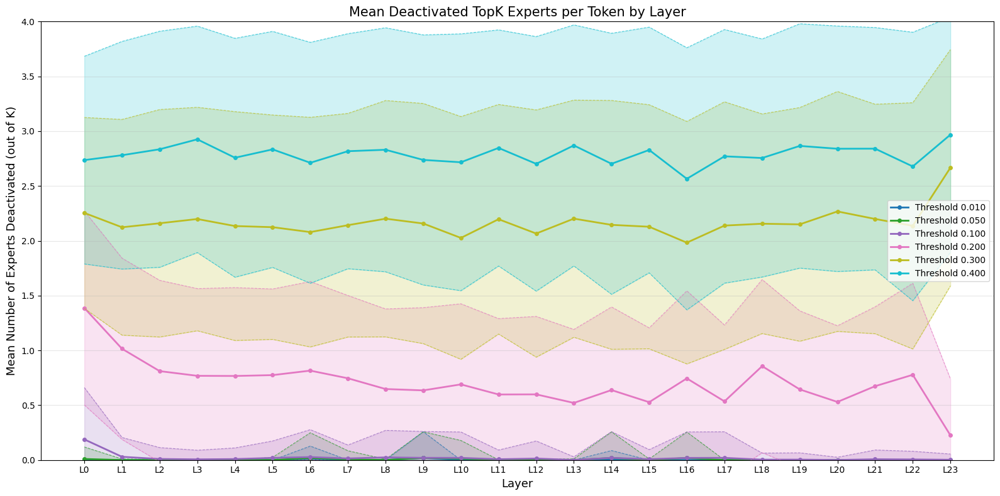

In [54]:
_ = plot_deactivated_experts_by_threshold(gpt_oss_subject_list, [0.01, 0.05, 0.1, 0.2, 0.3, 0.4])

## Hellaswag

In [55]:
gpt_oss_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/Rowan-hellaswag"
gpt_oss_root_path = os.path.expandvars(gpt_oss_root_path)

gpt_oss_subject_list = create_dataset_routing_statistics(gpt_oss_root_path)

Found: general/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/Rowan-hellaswag/general/EN/router_distributions.pt


### Global router distribution

Global probs shape: torch.Size([48365568])


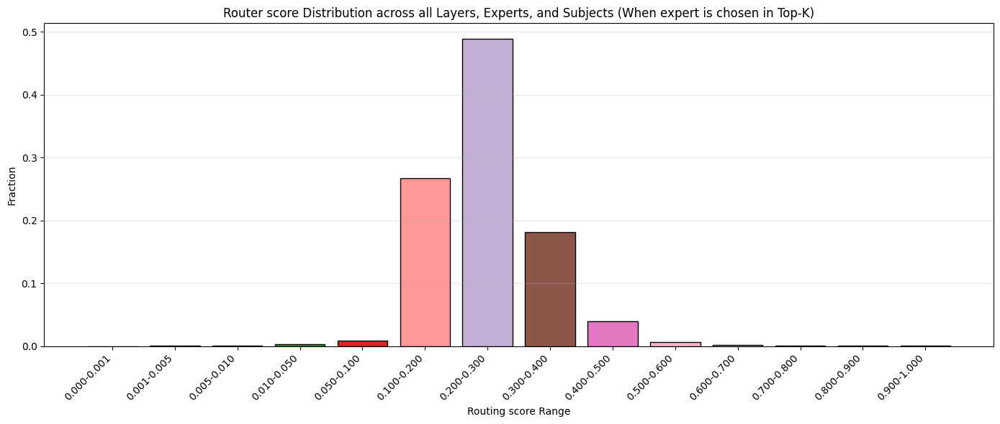

In [56]:
gpt_oss_global_probs = get_global_router_distribution(gpt_oss_subject_list)
print(f"Global probs shape: {gpt_oss_global_probs.shape}")
plot_router_distribution(gpt_oss_global_probs)

### Per layer distribution

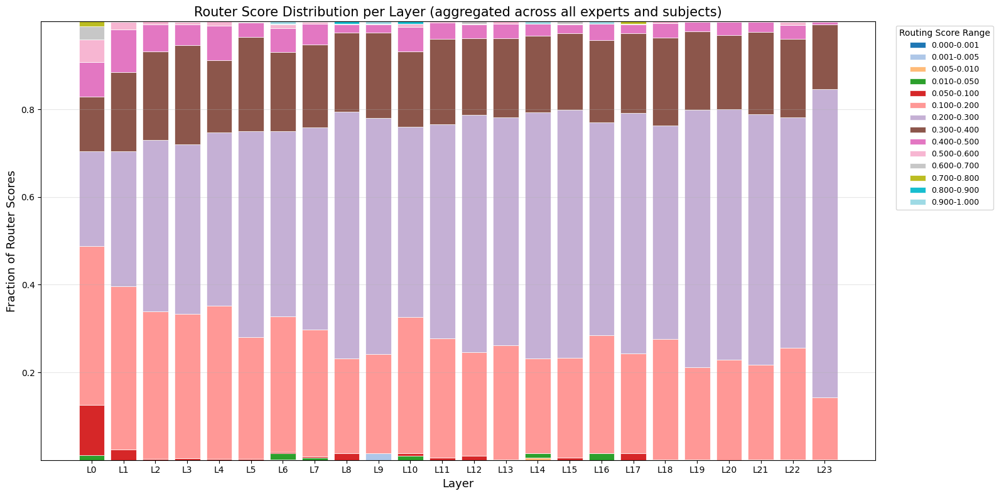

In [57]:
gpt_oss_per_layer_probs = get_per_layer_router_distribution(gpt_oss_subject_list)
plot_per_layer_router_distribution(gpt_oss_per_layer_probs)

### Per Expert router distribution

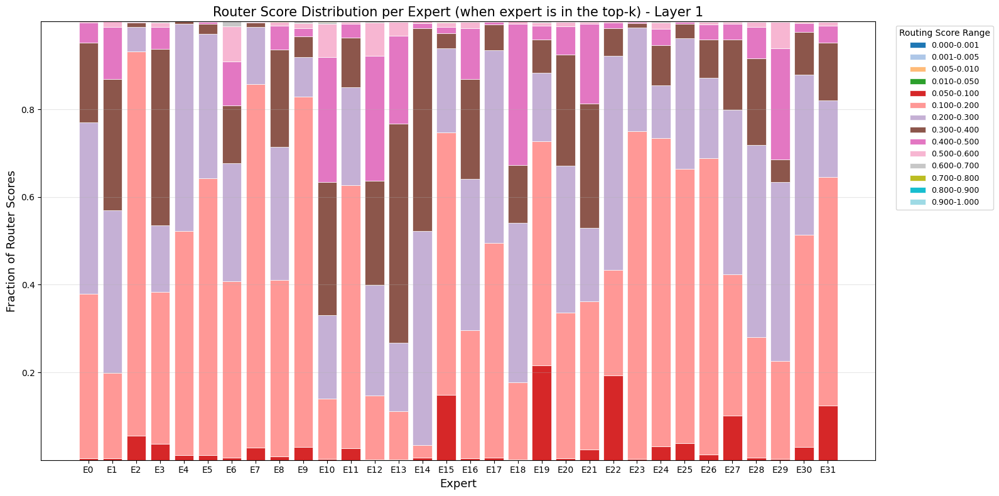

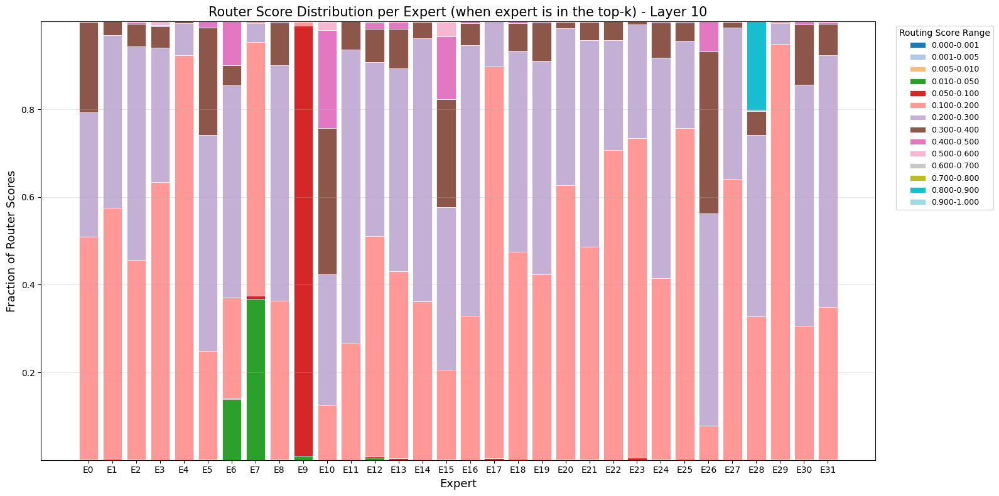

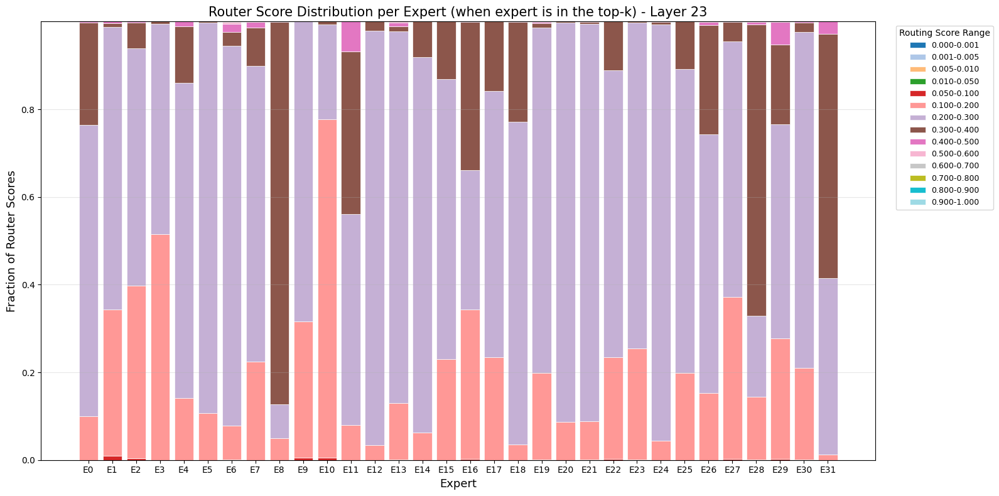

In [58]:
gpt_oss_per_expert_probs = get_per_expert_router_distribution(gpt_oss_subject_list)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=1)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=10)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=23)

### Mean deactivated TopK experts by threshold per layer

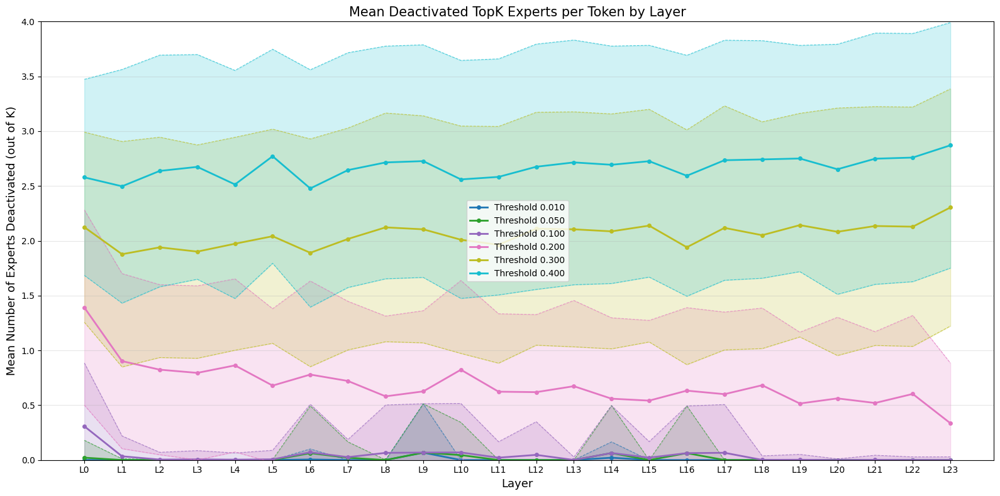

In [59]:
_ = plot_deactivated_experts_by_threshold(gpt_oss_subject_list, [0.01, 0.05, 0.1, 0.2, 0.3, 0.4])

## ARC

In [60]:
gpt_oss_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/allenai-ai2_arc"
gpt_oss_root_path = os.path.expandvars(gpt_oss_root_path)

gpt_oss_subject_list = create_dataset_routing_statistics(gpt_oss_root_path)

Found: ARC-Challenge/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/allenai-ai2_arc/ARC-Challenge/EN/router_distributions.pt
Found: ARC-Easy/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/allenai-ai2_arc/ARC-Easy/EN/router_distributions.pt


### Global router distribution

Global probs shape: torch.Size([8048544])


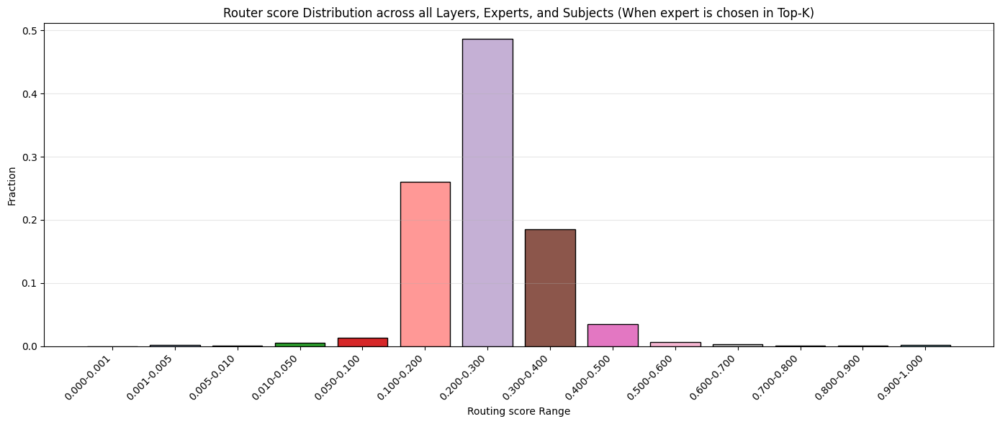

In [61]:
gpt_oss_global_probs = get_global_router_distribution(gpt_oss_subject_list)
print(f"Global probs shape: {gpt_oss_global_probs.shape}")
plot_router_distribution(gpt_oss_global_probs)

### Per layer distribution

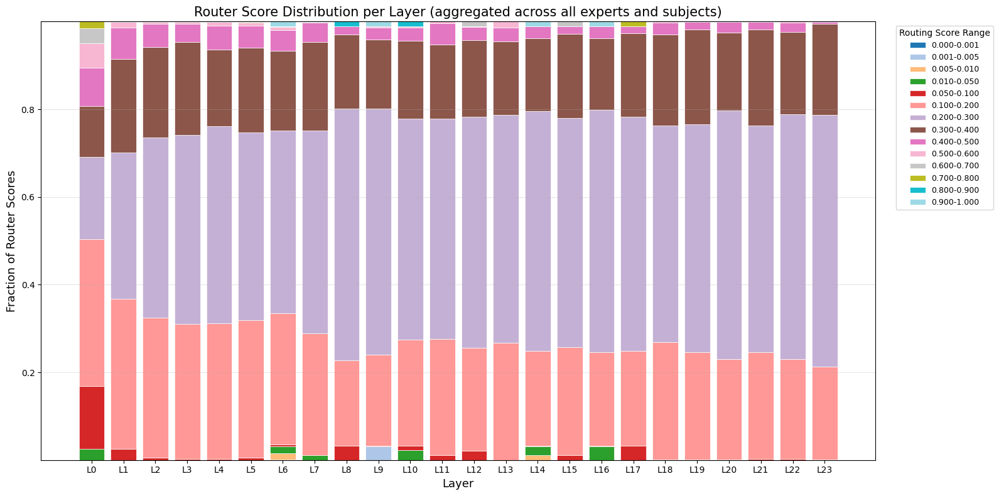

In [62]:
gpt_oss_per_layer_probs = get_per_layer_router_distribution(gpt_oss_subject_list)
plot_per_layer_router_distribution(gpt_oss_per_layer_probs)

### 

### Per expert router distribution

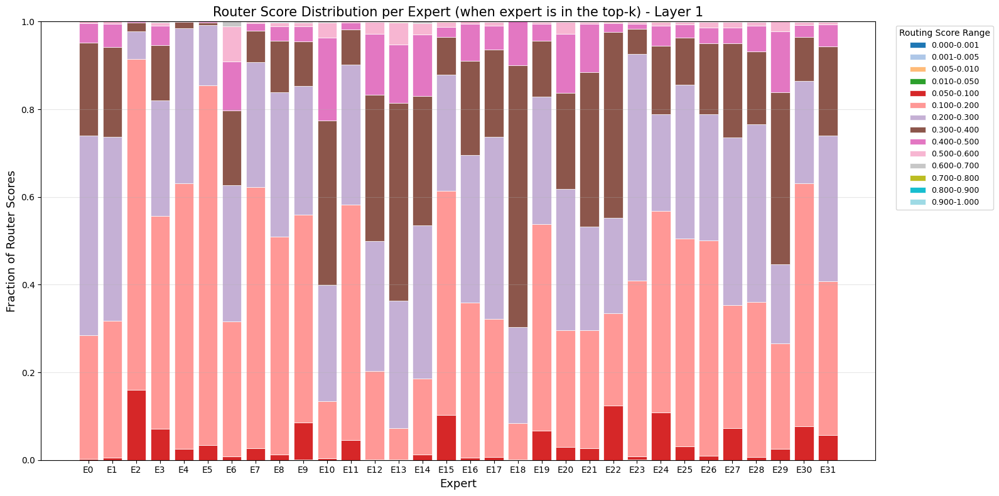

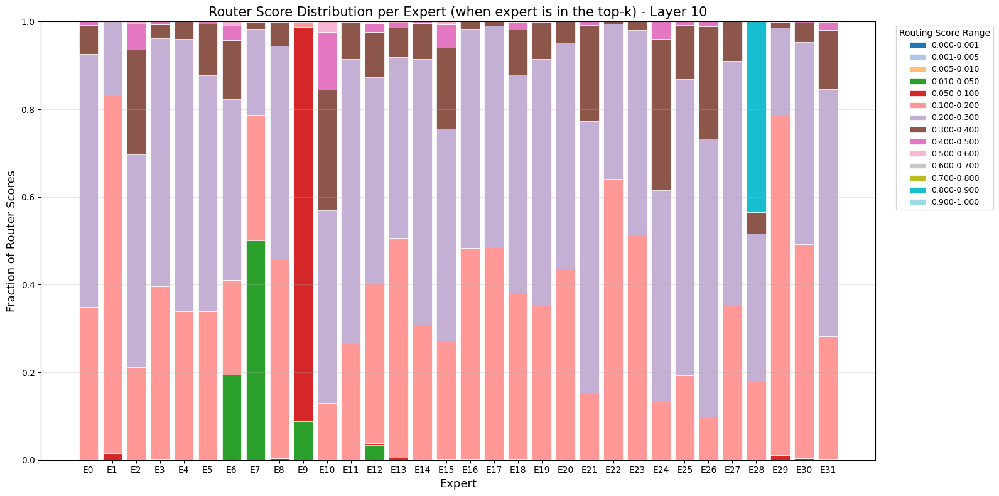

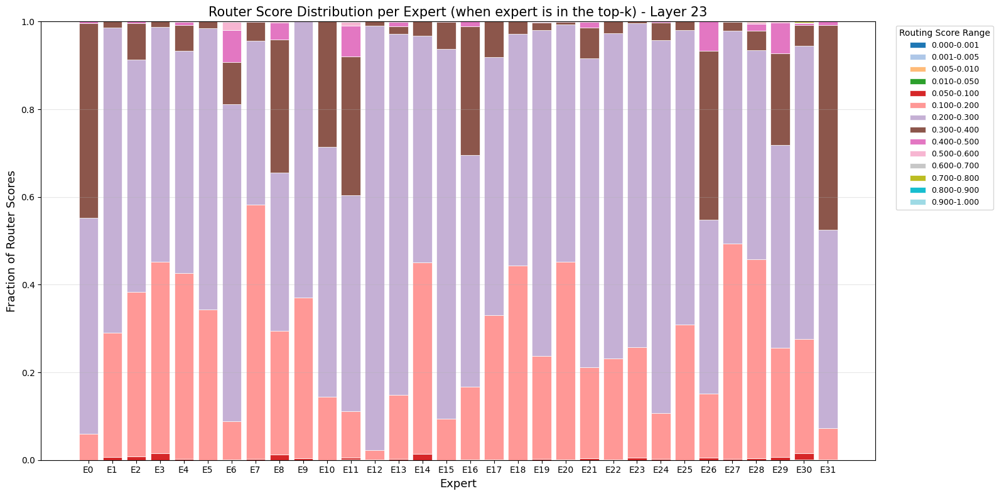

In [63]:
gpt_oss_per_expert_probs = get_per_expert_router_distribution(gpt_oss_subject_list)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=1)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=10)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=23)

### Mean deactivated TopK experts by threshold per layer

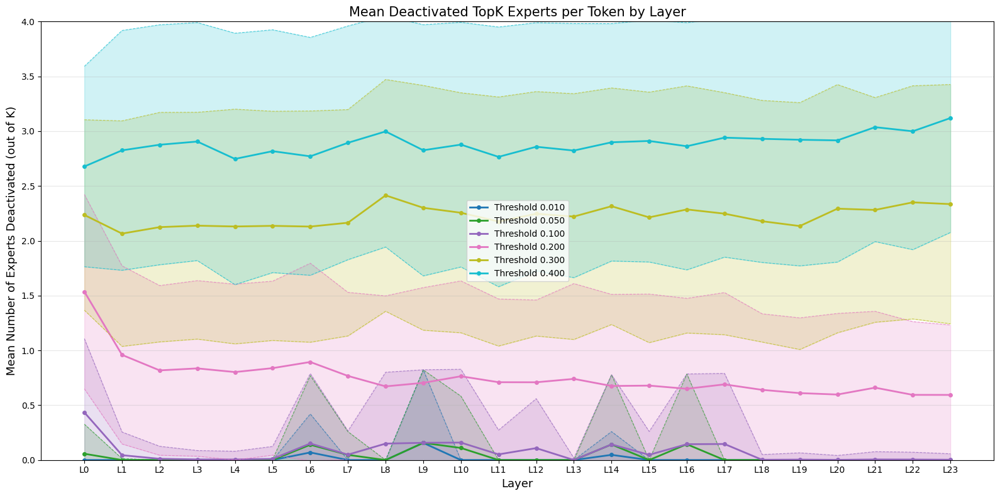

In [64]:
_ = plot_deactivated_experts_by_threshold(gpt_oss_subject_list, [0.01, 0.05, 0.1, 0.2, 0.3, 0.4])

## Winogrande

In [65]:
gpt_oss_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/allenai-winogrande"
gpt_oss_root_path = os.path.expandvars(gpt_oss_root_path)

gpt_oss_subject_list = create_dataset_routing_statistics(gpt_oss_root_path)

Found: winogrande_xl/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/openai-gpt-oss-20b/allenai-winogrande/winogrande_xl/EN/router_distributions.pt


### Global router distribution

Global probs shape: torch.Size([4145472])


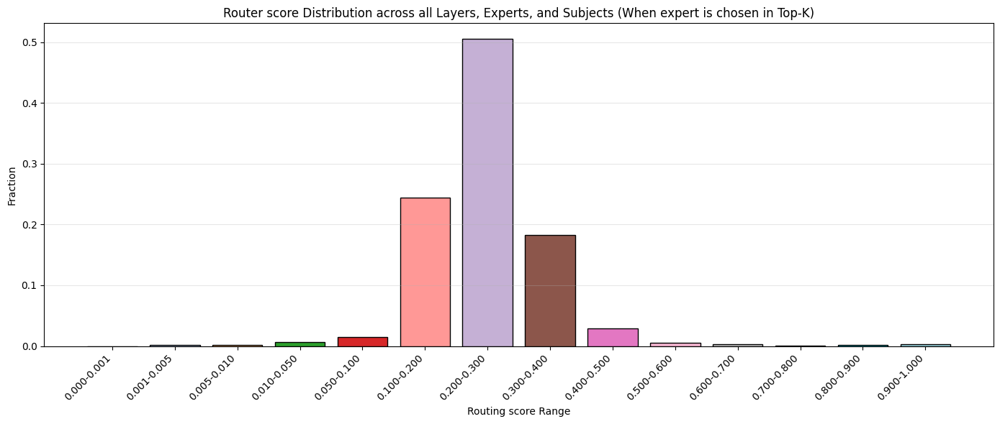

In [66]:
gpt_oss_global_probs = get_global_router_distribution(gpt_oss_subject_list)
print(f"Global probs shape: {gpt_oss_global_probs.shape}")
plot_router_distribution(gpt_oss_global_probs)

### Per layer distribution

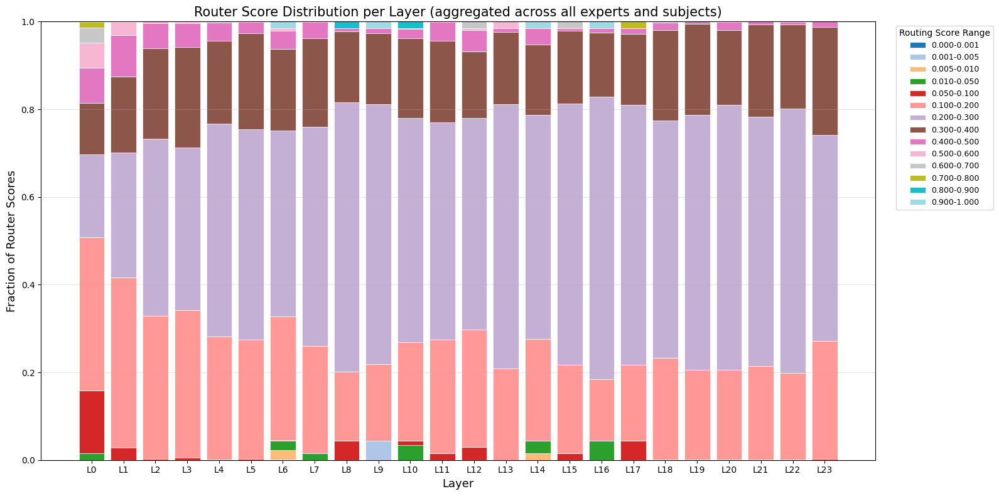

In [67]:
gpt_oss_per_layer_probs = get_per_layer_router_distribution(gpt_oss_subject_list)
plot_per_layer_router_distribution(gpt_oss_per_layer_probs)

### Per expert router distribution

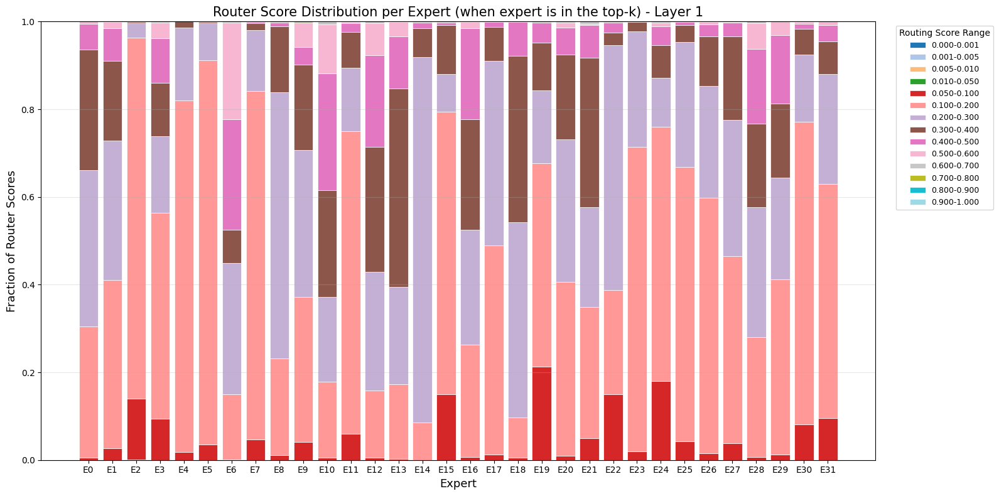

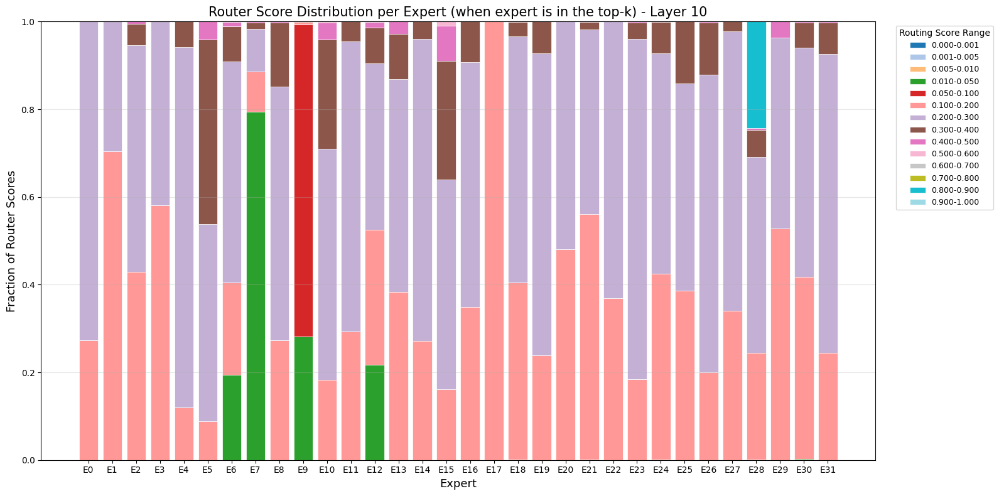

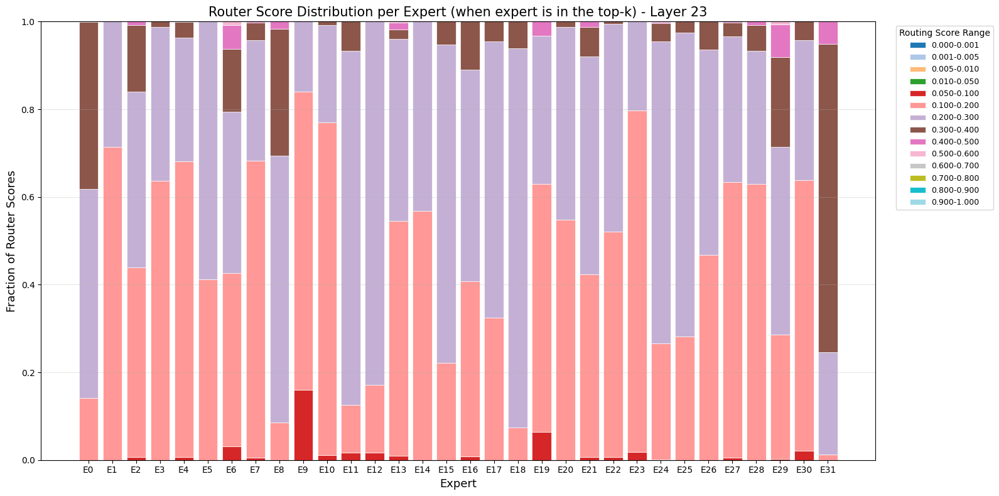

In [68]:
gpt_oss_per_expert_probs = get_per_expert_router_distribution(gpt_oss_subject_list)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=1)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=10)
plot_per_expert_router_distribution(gpt_oss_per_expert_probs, layer=23)

### Mean deactivated TopK experts by threshold per layer

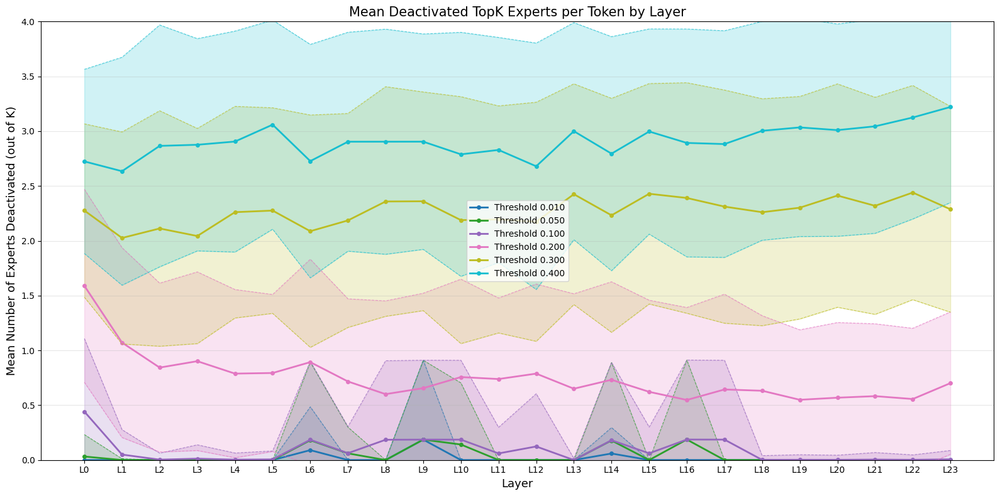

In [69]:
_ = plot_deactivated_experts_by_threshold(gpt_oss_subject_list, [0.01, 0.05, 0.1, 0.2, 0.3, 0.4])

In [70]:
# memory cleanup

del gpt_oss_subject_list
del gpt_oss_global_probs
del gpt_oss_per_layer_probs
del gpt_oss_per_expert_probs

# OlMoE

This model has a top-k of 8 and it has 64 experts in total

## MMLU

In [71]:
olmoe_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/cais-mmlu"
olmoe_root_path = os.path.expandvars(olmoe_root_path)

olmoe_subject_list = create_dataset_routing_statistics(olmoe_root_path)

Found: virology/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/cais-mmlu/virology/EN/router_distributions.pt
Found: computer_security/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/cais-mmlu/computer_security/EN/router_distributions.pt
Found: high_school_us_history/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/cais-mmlu/high_school_us_history/EN/router_distributions.pt
Found: professional_accounting/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/cais-mmlu/professional_accounting/EN/router_distributions.pt
Found: college_medicine/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/al

Found: professional_law/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/cais-mmlu/professional_law/EN/router_distributions.pt
Found: anatomy/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/cais-mmlu/anatomy/EN/router_distributions.pt
Found: prehistory/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/cais-mmlu/prehistory/EN/router_distributions.pt
Found: nutrition/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/cais-mmlu/nutrition/EN/router_distributions.pt
Found: logical_fallacies/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/cais-mmlu/logical_fallacies/EN/r

### Global router distribution

In [72]:
olmoe_global_probs = get_global_router_distribution(olmoe_subject_list)

Global probs shape: torch.Size([161927680])


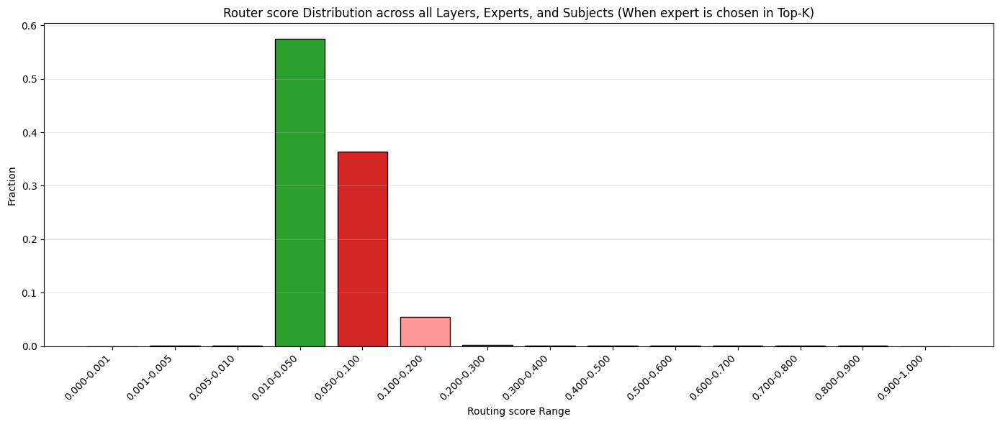

In [73]:
print(f"Global probs shape: {olmoe_global_probs.shape}")
plot_router_distribution(olmoe_global_probs)

### Per layer router distribution

In [74]:
olmoe_per_layer_probs = get_per_layer_router_distribution(olmoe_subject_list)

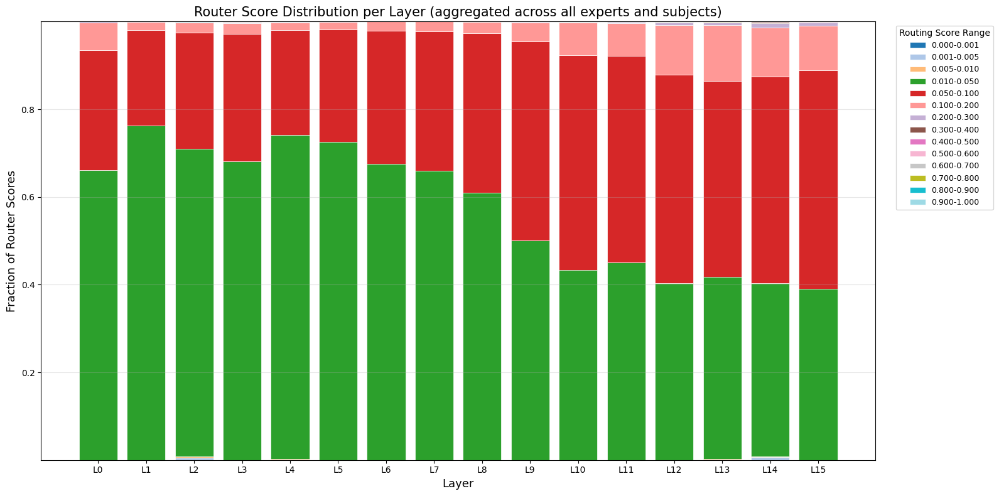

In [75]:
plot_per_layer_router_distribution(olmoe_per_layer_probs)

**Why is olmoe has the perfect uniform distribution among the chosen top-k experts for a token (in olmoe they also don't do a renormalization, by default the option is deactivated for the model in the hf config), like from all the models we have here, it is the only one that shows this type of score distribution, where this is basically almost the perfect uniform distribution as $1/64 \approx 0.02$ and we don't visualize here the exact value, just if its inside the bucket**

The only thing I can say about this also, is that they use a weight for the balancing loss of $0.01$ and I feel maybe this is a very big one, but they say that the value is from prior work

Let's try do a different bucket setting

Global probs shape: torch.Size([161927680])


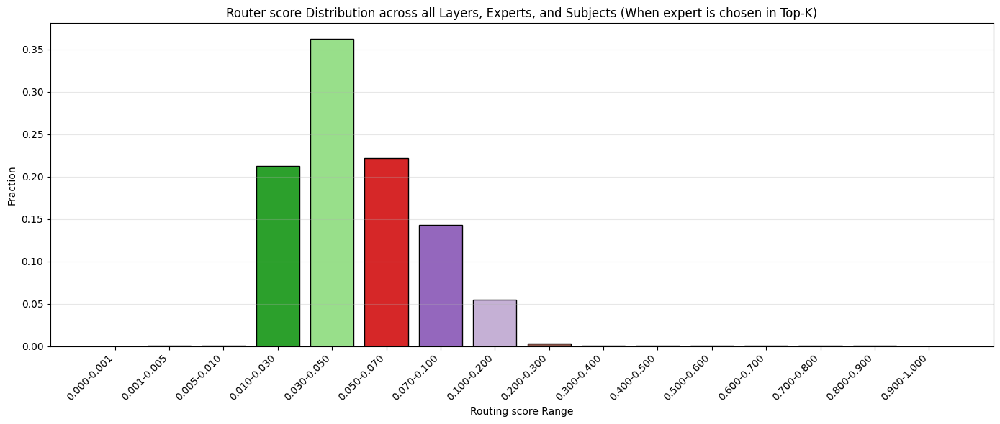

In [76]:
print(f"Global probs shape: {olmoe_global_probs.shape}")
plot_router_distribution(olmoe_global_probs,  bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

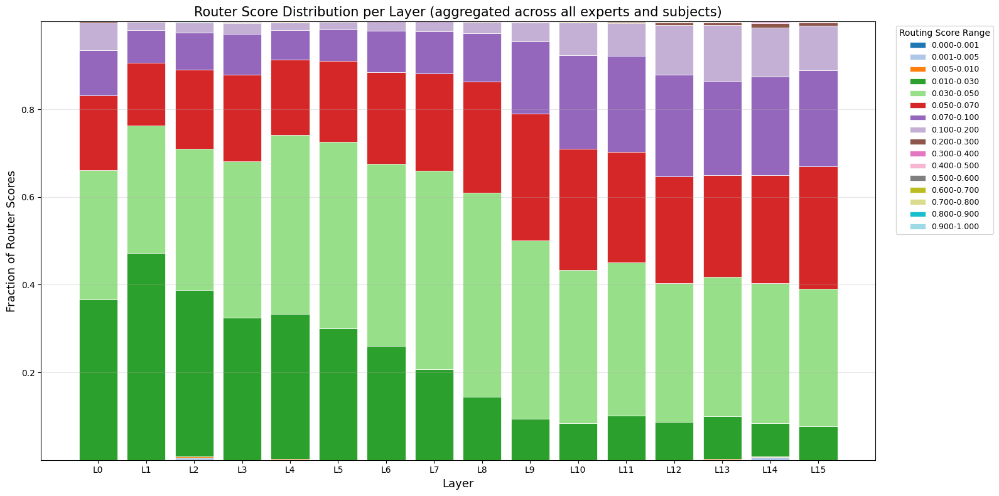

In [77]:
plot_per_layer_router_distribution(olmoe_per_layer_probs, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Per expert router distribution

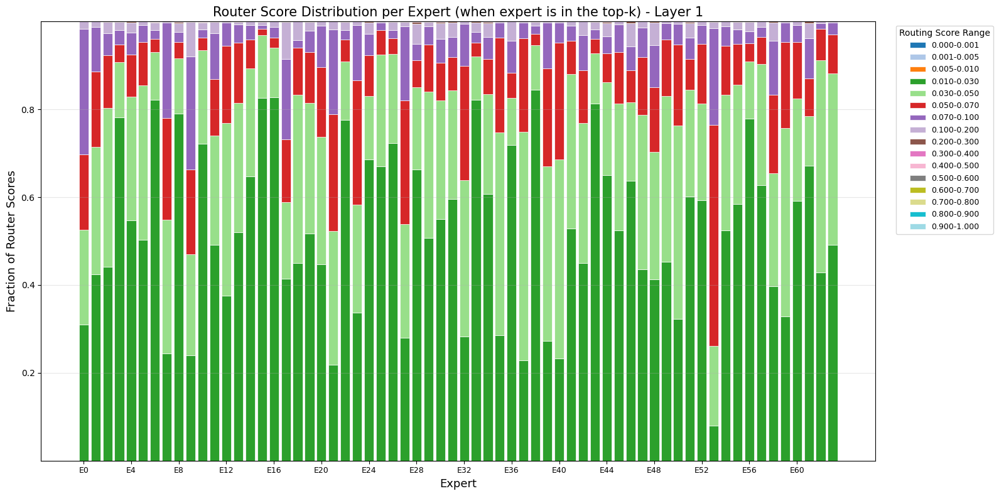

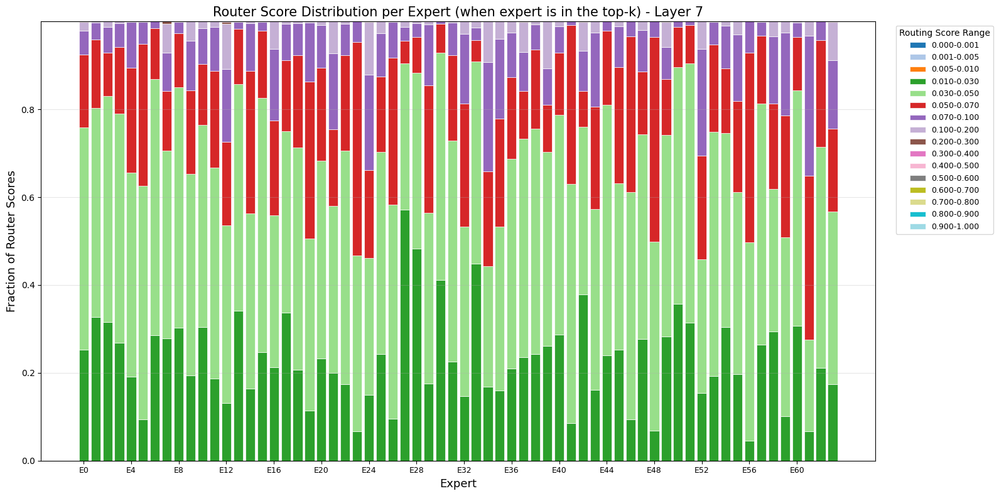

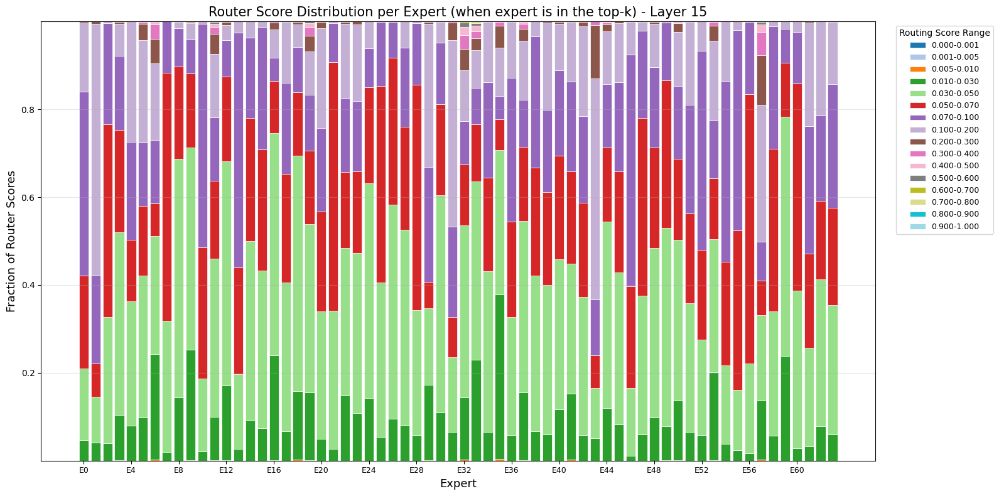

In [80]:
olmoe_per_expert_probs = get_per_expert_router_distribution(olmoe_subject_list)
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=1, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=7, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=15, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Mean deactivated TopK experts by threshold per layer

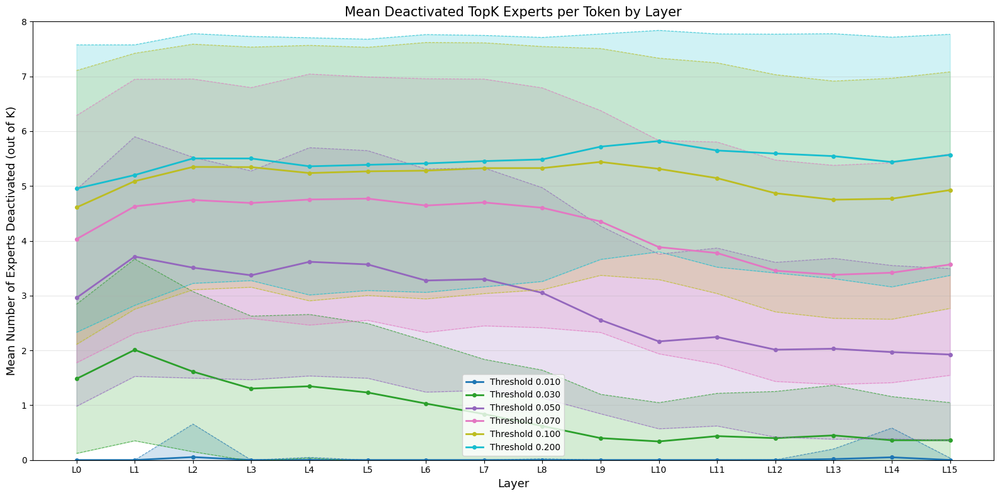

In [81]:
_= plot_deactivated_experts_by_threshold(olmoe_subject_list, [0.01, 0.03, 0.05, 0.07, 0.1, 0.2])

## MMLU PRO

In [82]:
olmoe_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/TIGER-Lab-MMLU-Pro"
olmoe_root_path = os.path.expandvars(olmoe_root_path)

olmoe_subject_list = create_dataset_routing_statistics(olmoe_root_path)

Found: biology/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/TIGER-Lab-MMLU-Pro/biology/EN/router_distributions.pt
Found: chemistry/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/TIGER-Lab-MMLU-Pro/chemistry/EN/router_distributions.pt
Found: physics/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/TIGER-Lab-MMLU-Pro/physics/EN/router_distributions.pt
Found: engineering/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/TIGER-Lab-MMLU-Pro/engineering/EN/router_distributions.pt
Found: economics/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/TIGER-Lab-MMLU-Pro/e

### Global router distribution

In [83]:
olmoe_global_probs = get_global_router_distribution(olmoe_subject_list)
print(f"Global probs shape: {olmoe_global_probs.shape}")

Global probs shape: torch.Size([250913536])


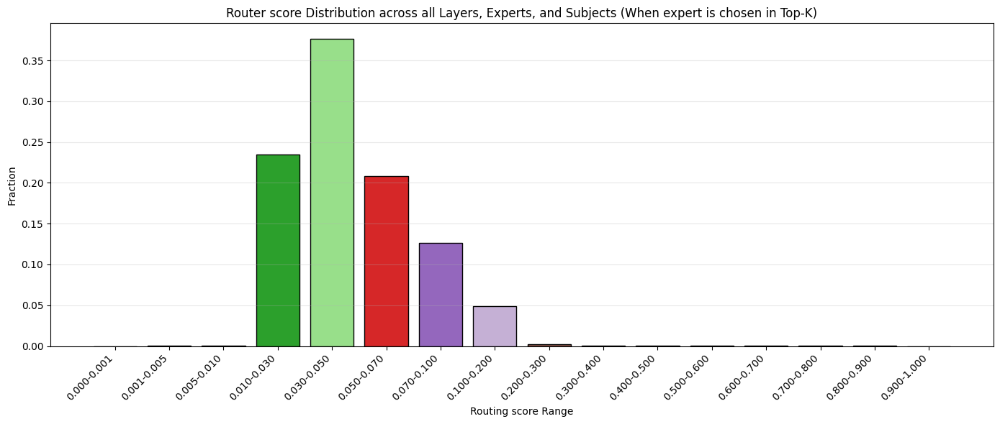

In [84]:
plot_router_distribution(olmoe_global_probs, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Per layer router distribution

In [85]:
olmoe_per_layer_probs = get_per_layer_router_distribution(olmoe_subject_list)

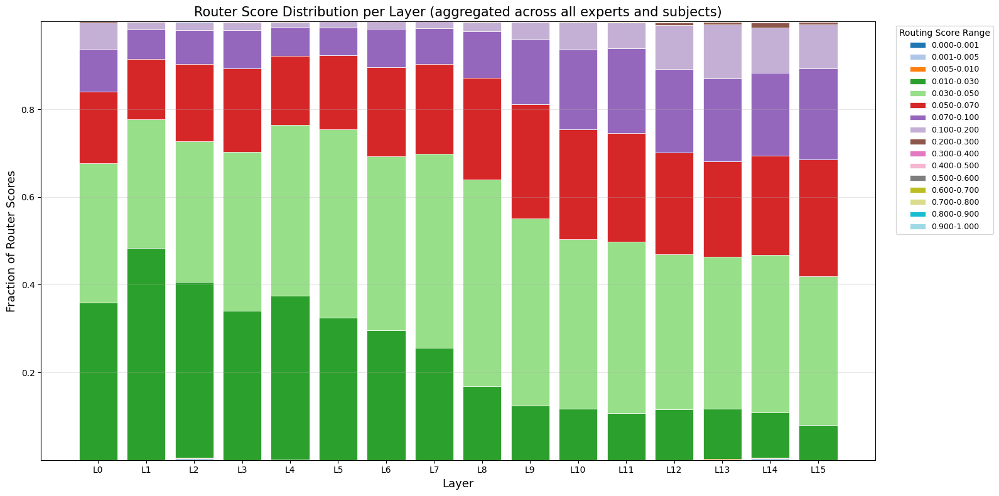

In [86]:
plot_per_layer_router_distribution(olmoe_per_layer_probs, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Per expert router distribution

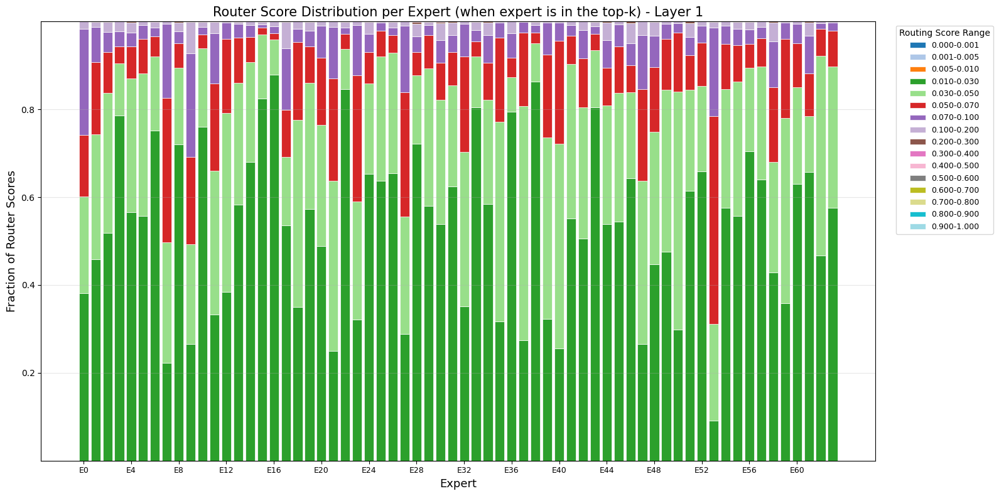

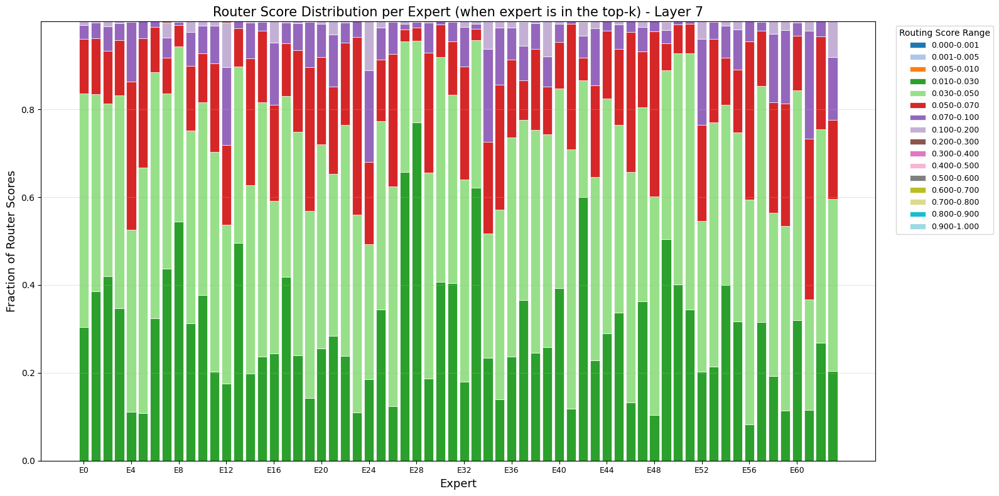

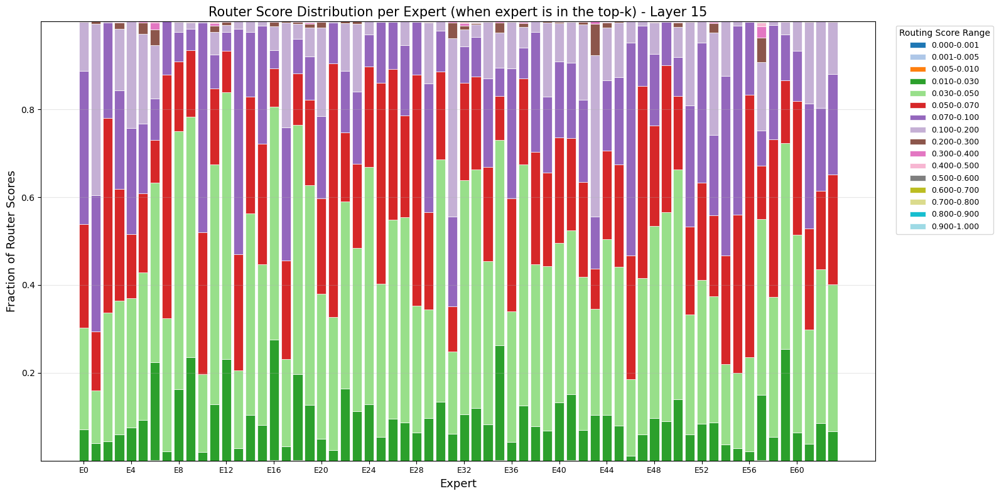

In [87]:
olmoe_per_expert_probs = get_per_expert_router_distribution(olmoe_subject_list)
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=1, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=7, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=15, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Mean deactivated TopK experts by threshold per layer

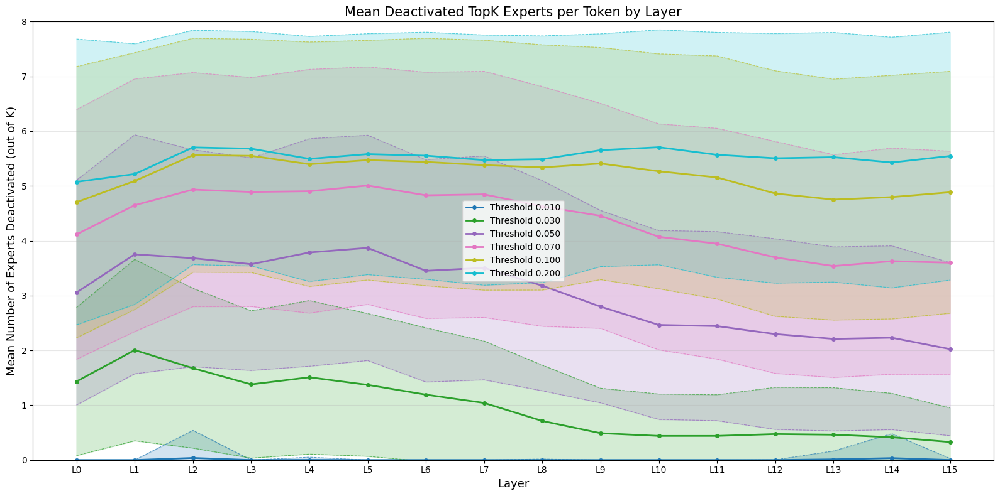

In [88]:
_ = plot_deactivated_experts_by_threshold(olmoe_subject_list, [0.01, 0.03, 0.05, 0.07, 0.1, 0.2])

## Hellaswag

In [89]:
olmoe_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/Rowan-hellaswag"
olmoe_root_path = os.path.expandvars(olmoe_root_path)

olmoe_subject_list = create_dataset_routing_statistics(olmoe_root_path)

Found: general/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/Rowan-hellaswag/general/EN/router_distributions.pt


### Global router distribution

Global probs shape: torch.Size([66539520])


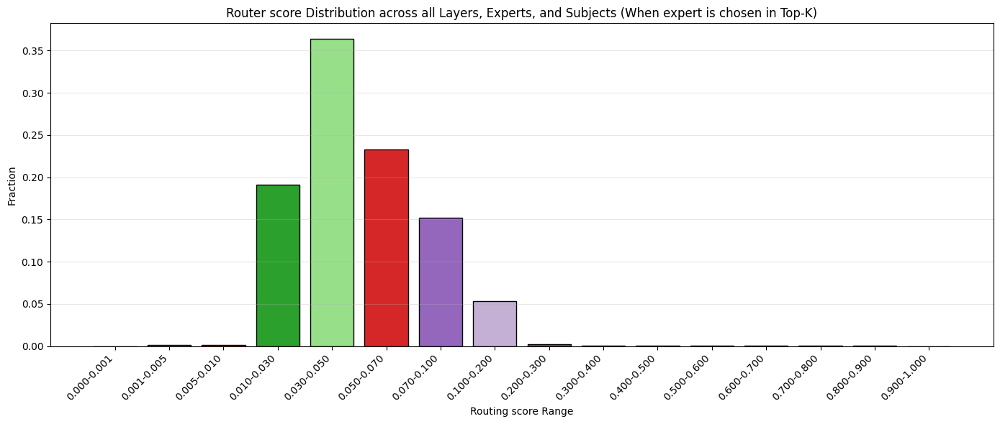

In [90]:
olmoe_global_probs = get_global_router_distribution(olmoe_subject_list)
print(f"Global probs shape: {olmoe_global_probs.shape}")
plot_router_distribution(olmoe_global_probs, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Per layer distribution

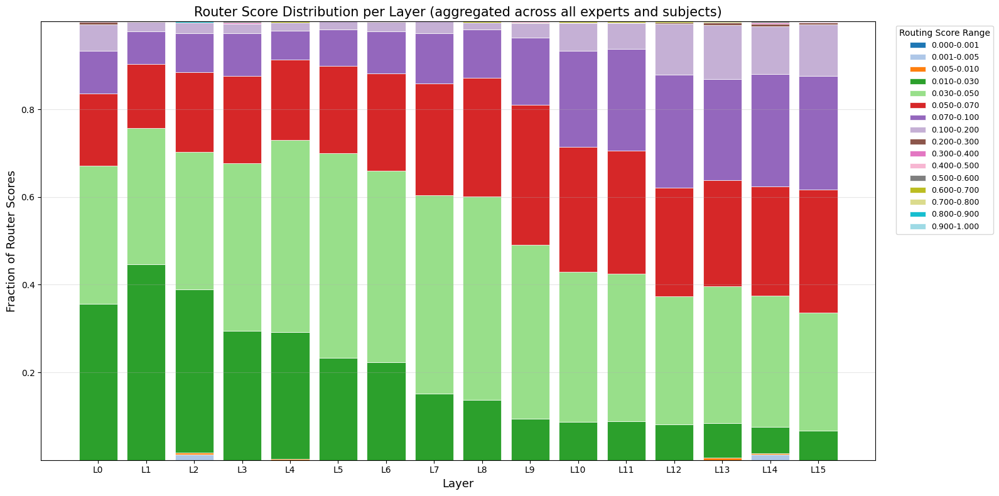

In [91]:
olmoe_per_layer_probs = get_per_layer_router_distribution(olmoe_subject_list)
plot_per_layer_router_distribution(olmoe_per_layer_probs, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Per Expert router distribution

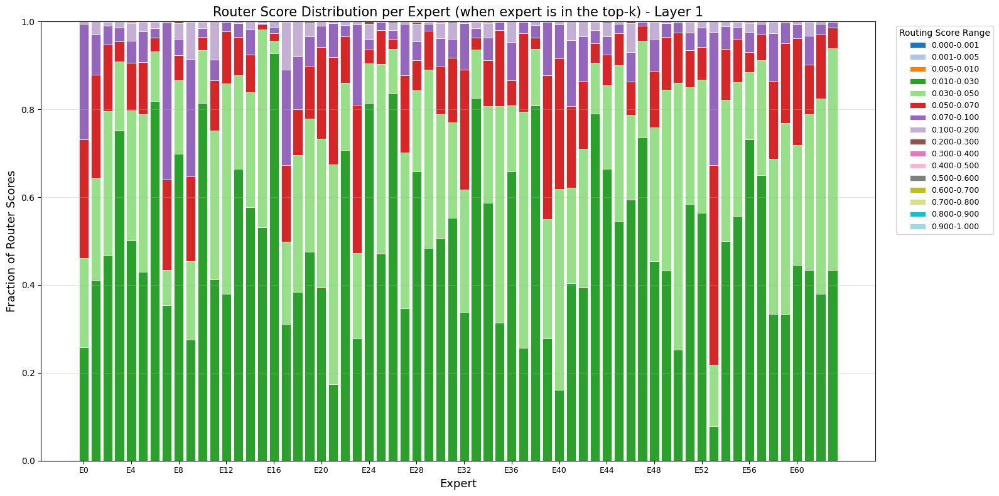

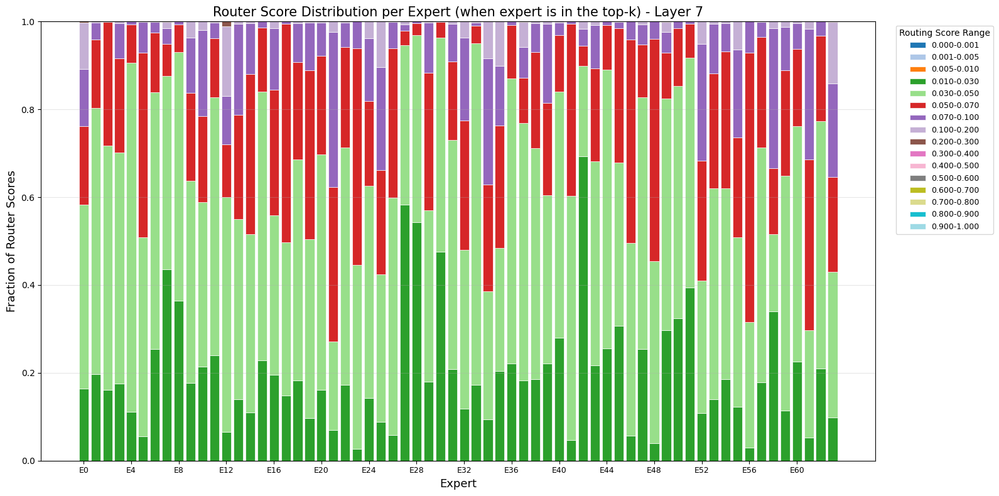

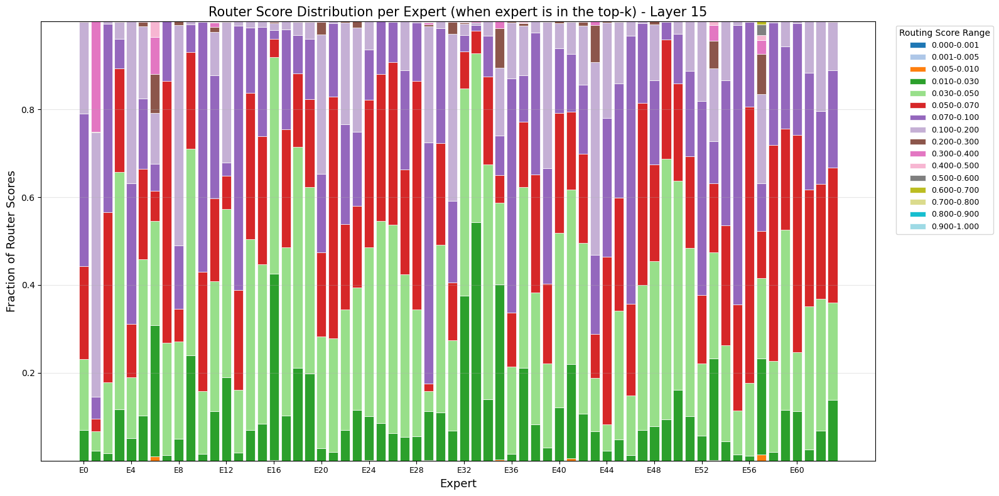

In [92]:
olmoe_per_expert_probs = get_per_expert_router_distribution(olmoe_subject_list)
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=1, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=7, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=15, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Mean deactivated TopK experts by threshold per layer

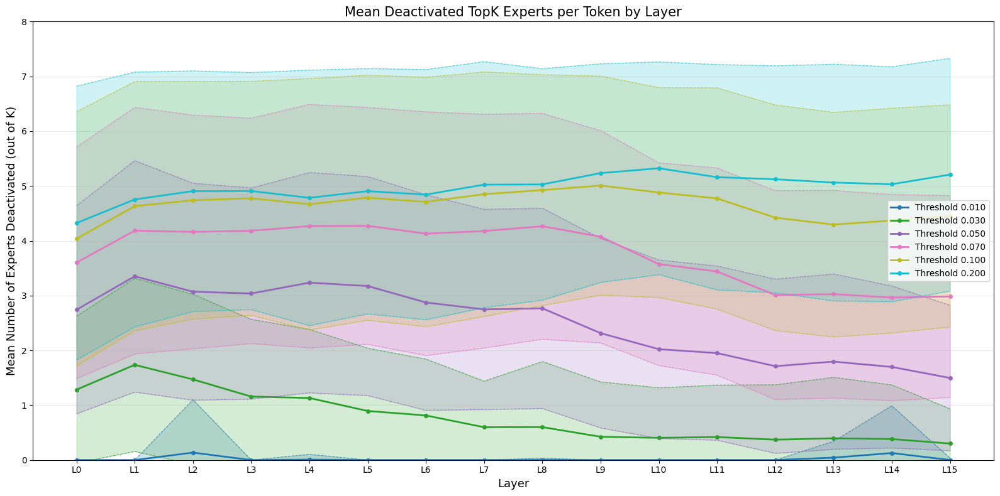

In [93]:
_ = plot_deactivated_experts_by_threshold(olmoe_subject_list, [0.01, 0.03, 0.05, 0.07, 0.1, 0.2])

## ARC

In [94]:
olmoe_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/allenai-ai2_arc"
olmoe_root_path = os.path.expandvars(olmoe_root_path)

olmoe_subject_list = create_dataset_routing_statistics(olmoe_root_path)

Found: ARC-Challenge/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/allenai-ai2_arc/ARC-Challenge/EN/router_distributions.pt
Found: ARC-Easy/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/allenai-ai2_arc/ARC-Easy/EN/router_distributions.pt


### Global router distribution

Global probs shape: torch.Size([10841600])


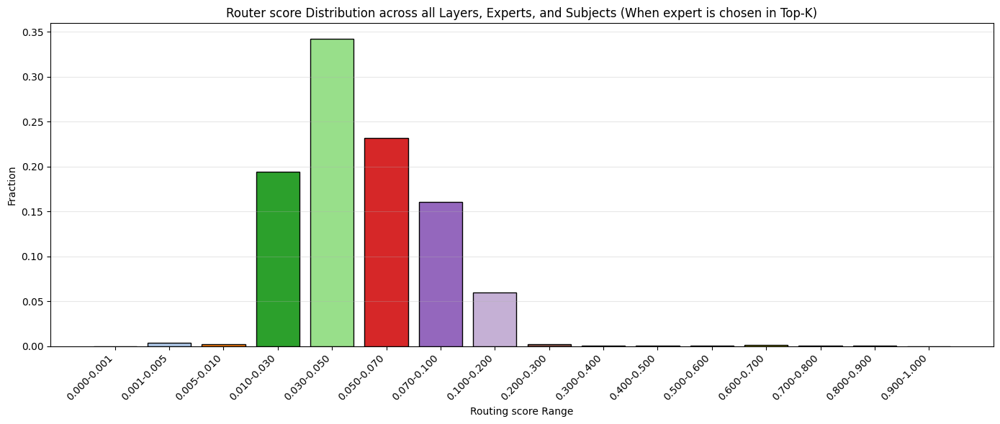

In [95]:
olmoe_global_probs = get_global_router_distribution(olmoe_subject_list)
print(f"Global probs shape: {olmoe_global_probs.shape}")
plot_router_distribution(olmoe_global_probs, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Per layer distribution

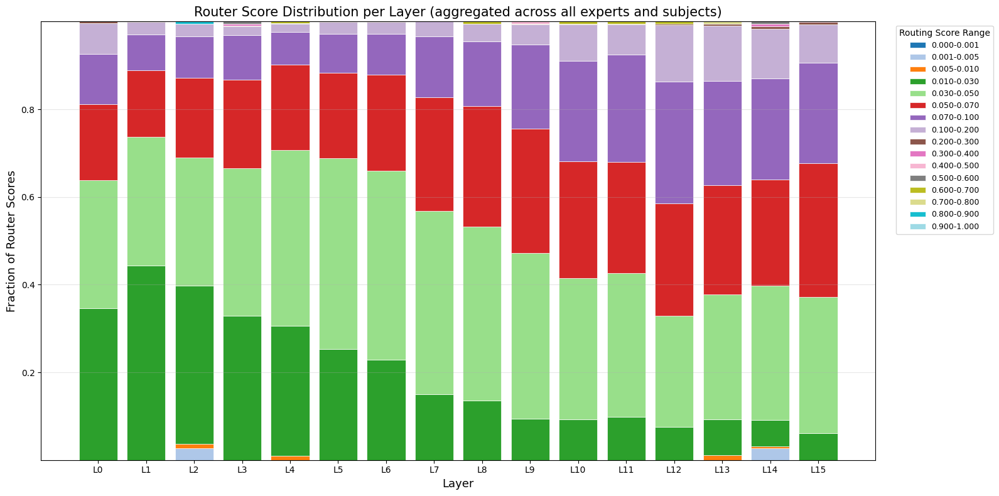

In [96]:
olmoe_per_layer_probs = get_per_layer_router_distribution(olmoe_subject_list)
plot_per_layer_router_distribution(olmoe_per_layer_probs, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Per Expert router distribution

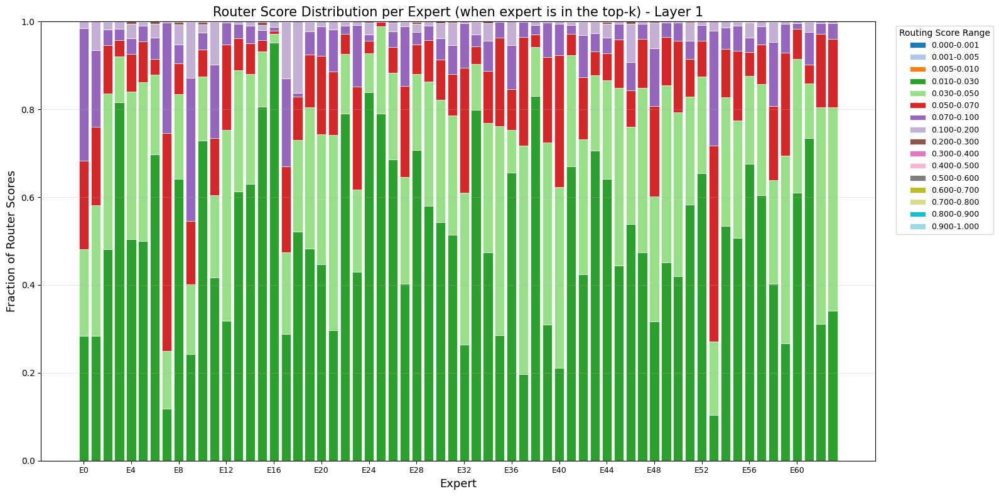

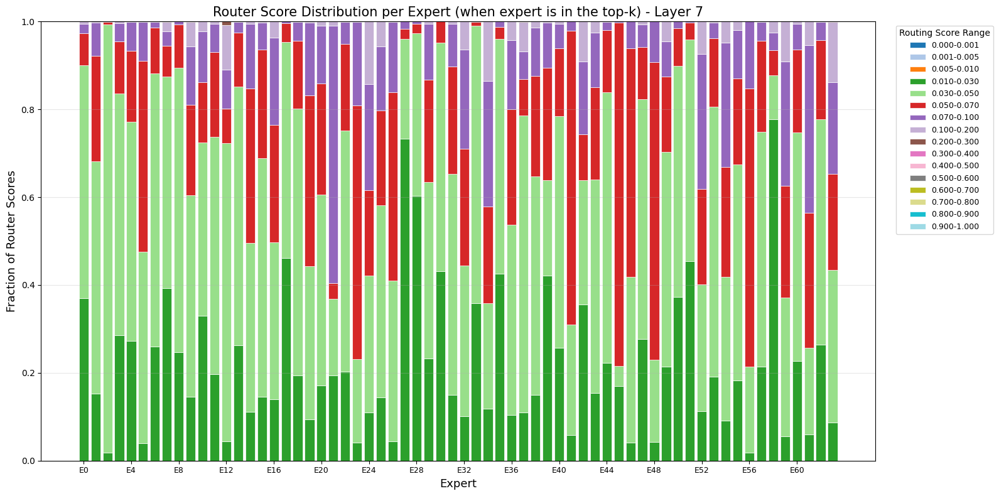

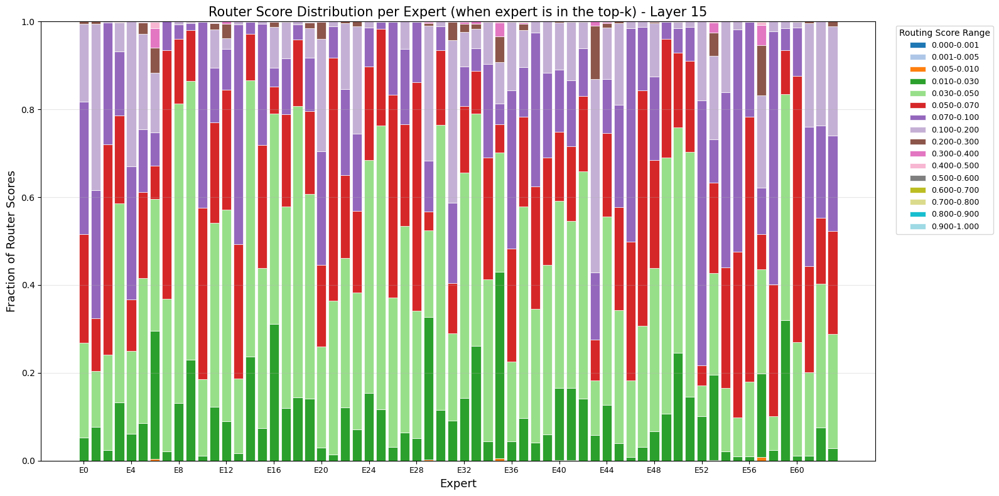

In [97]:
olmoe_per_expert_probs = get_per_expert_router_distribution(olmoe_subject_list)
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=1, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=7, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=15, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Mean deactivated TopK experts by threshold per layer

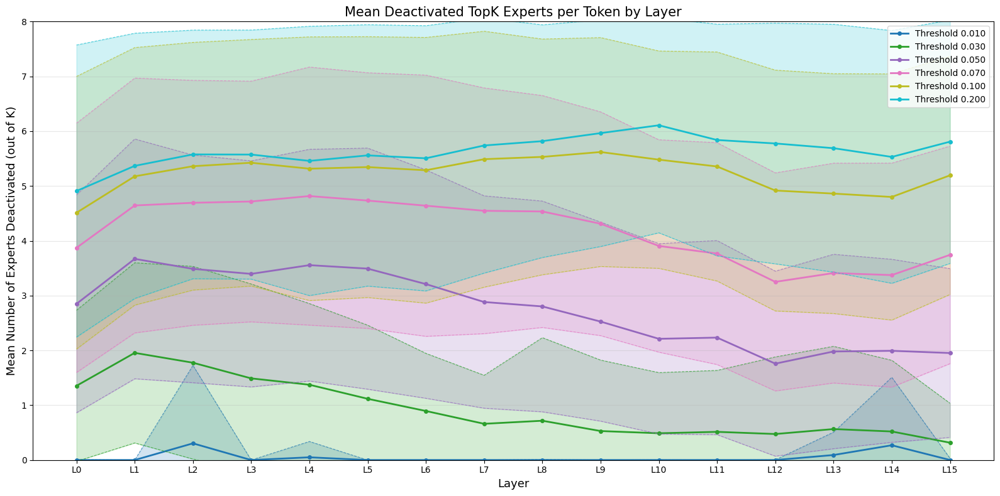

In [98]:
_ = plot_deactivated_experts_by_threshold(olmoe_subject_list, [0.01, 0.03, 0.05, 0.07, 0.1, 0.2])

## Winogrande

In [99]:
olmoe_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/allenai-winogrande"
olmoe_root_path = os.path.expandvars(olmoe_root_path)

olmoe_subject_list = create_dataset_routing_statistics(olmoe_root_path)

Found: winogrande_xl/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/allenai-OLMoE-1B-7B-0125/allenai-winogrande/winogrande_xl/EN/router_distributions.pt


### Global router distribution

Global probs shape: torch.Size([5724928])


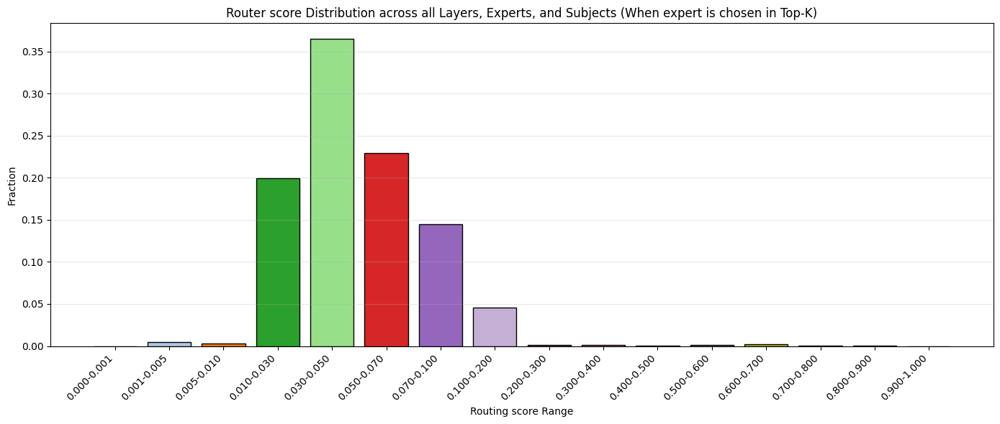

In [100]:
olmoe_global_probs = get_global_router_distribution(olmoe_subject_list)
print(f"Global probs shape: {olmoe_global_probs.shape}")
plot_router_distribution(olmoe_global_probs, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Per layer distribution

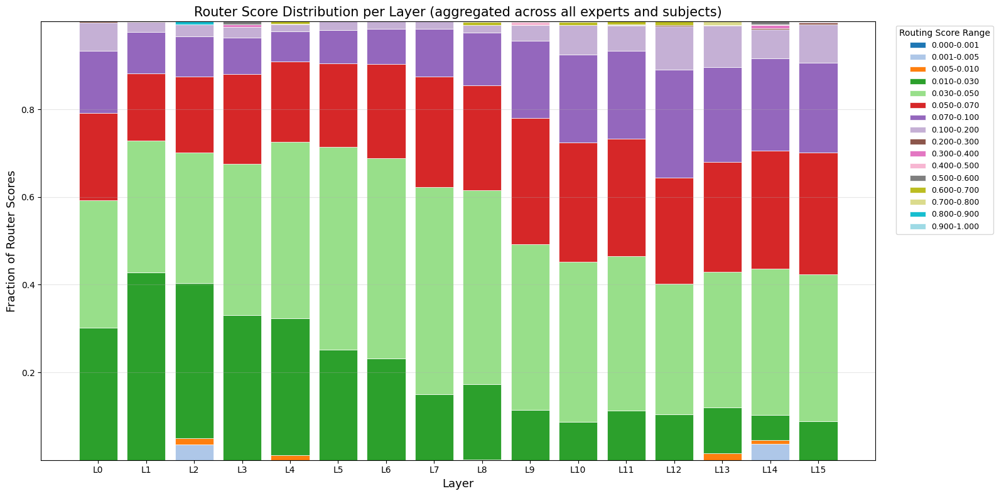

In [101]:
olmoe_per_layer_probs = get_per_layer_router_distribution(olmoe_subject_list)
plot_per_layer_router_distribution(olmoe_per_layer_probs, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Per Expert router distribution

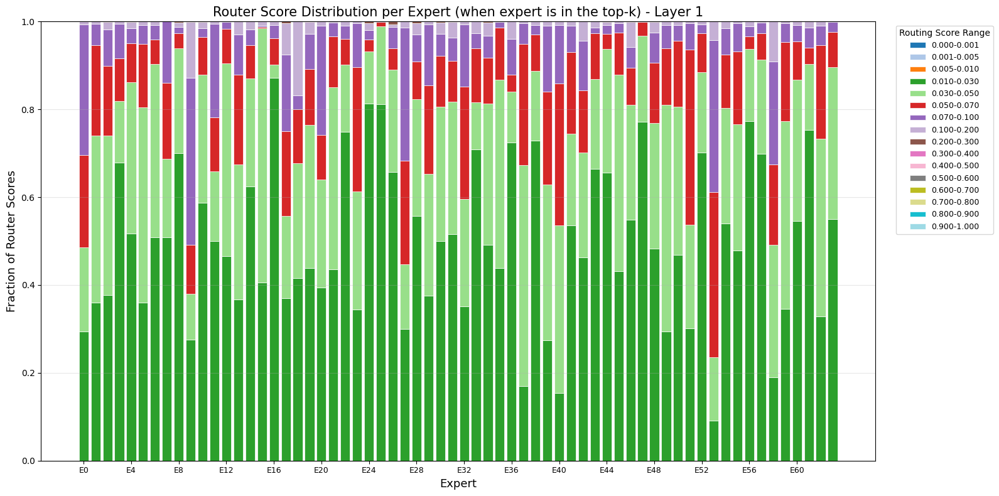

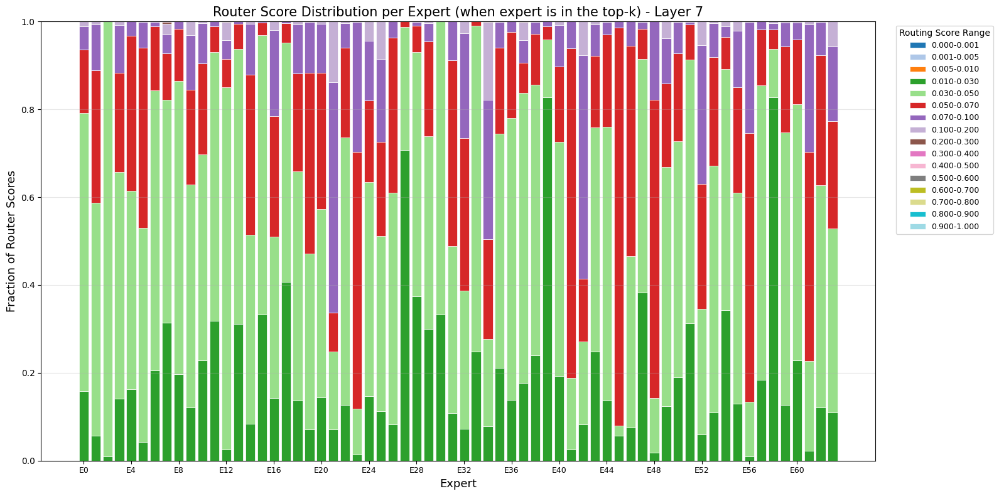

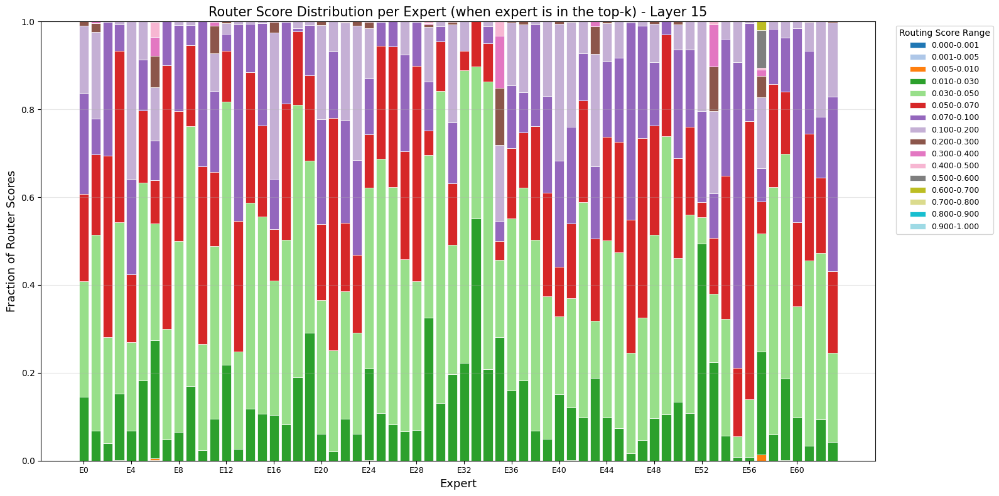

In [102]:
olmoe_per_expert_probs = get_per_expert_router_distribution(olmoe_subject_list)
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=1, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=7, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plot_per_expert_router_distribution(olmoe_per_expert_probs, layer=15, bin_edges = [0, 0.001, 0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

### Mean deactivated TopK experts by threshold per layer

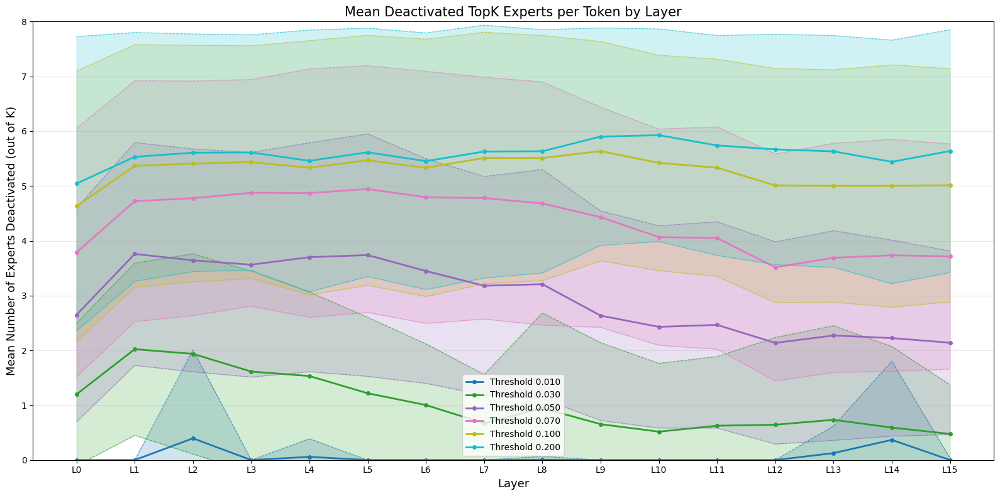

In [104]:
_ = plot_deactivated_experts_by_threshold(olmoe_subject_list, [0.01, 0.03, 0.05, 0.07, 0.1, 0.2])

In [105]:
# memory cleanup

del olmoe_subject_list
del olmoe_global_probs
del olmoe_per_layer_probs
del olmoe_per_expert_probs

# Arcee Trinity

Trinity models use sigmoid router instead of softmax (with renormalization after top-k and a router-scale value), and here we are visualizing the values after the router scaling (so if we are seeing the values before the scaling then a value 0.5 multiplied by their router scale (here is bigger than 2.0) it would give us a value bigger than 0.1).

It seems the idea of the router scale is to increase how much the experts are contributing to the weighted sum

This model has a top-k of 8 and it has 128 routable experts and 1 shared expert, it uses sigmoid router instead of softmax and a router_scaling scalar, and the first two layers are dense

## MMLU

In [3]:
trinity_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/cais-mmlu"
trinity_root_path = os.path.expandvars(trinity_root_path)

trinity_subject_list = create_dataset_routing_statistics(trinity_root_path)

Found: virology/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/cais-mmlu/virology/EN/router_distributions.pt
Found: computer_security/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/cais-mmlu/computer_security/EN/router_distributions.pt
Found: high_school_us_history/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/cais-mmlu/high_school_us_history/EN/router_distributions.pt
Found: professional_accounting/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/cais-mmlu/professional_accounting/EN/router_distributions.pt
Found: college_medicine/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distrib

### Global router distribution

In [4]:
trinity_global_probs = get_global_router_distribution(trinity_subject_list)

Global probs shape: torch.Size([522856080])


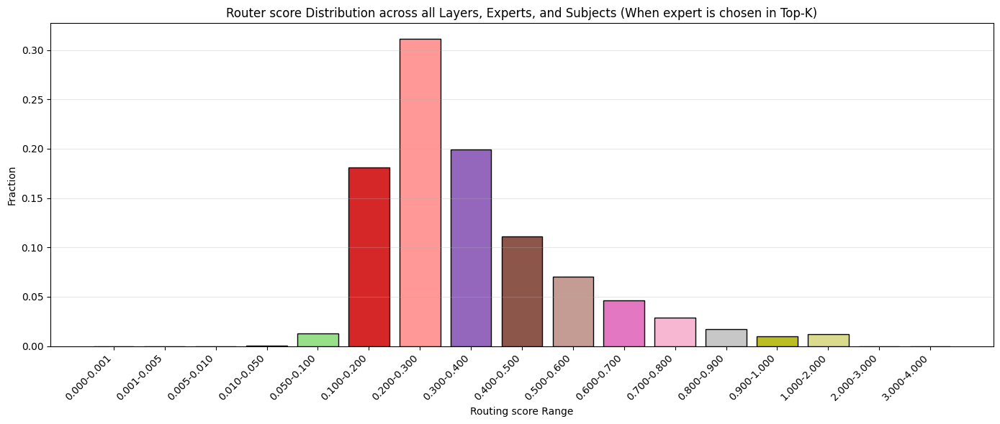

In [5]:
print(f"Global probs shape: {trinity_global_probs.shape}")

plot_router_distribution(trinity_global_probs, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Per layer router distribution

In [6]:
trinity_per_layer_probs = get_per_layer_router_distribution(trinity_subject_list)

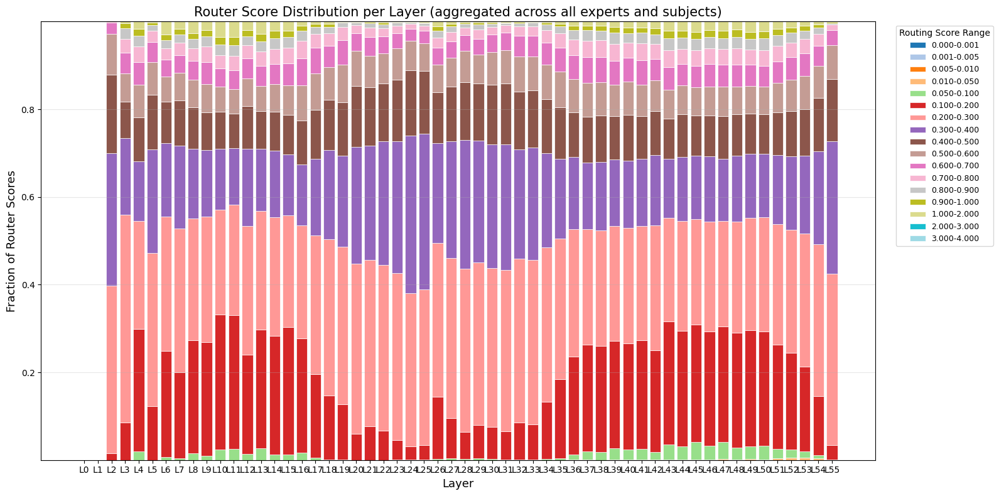

In [7]:
plot_per_layer_router_distribution(trinity_per_layer_probs, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Per Expert router distribution

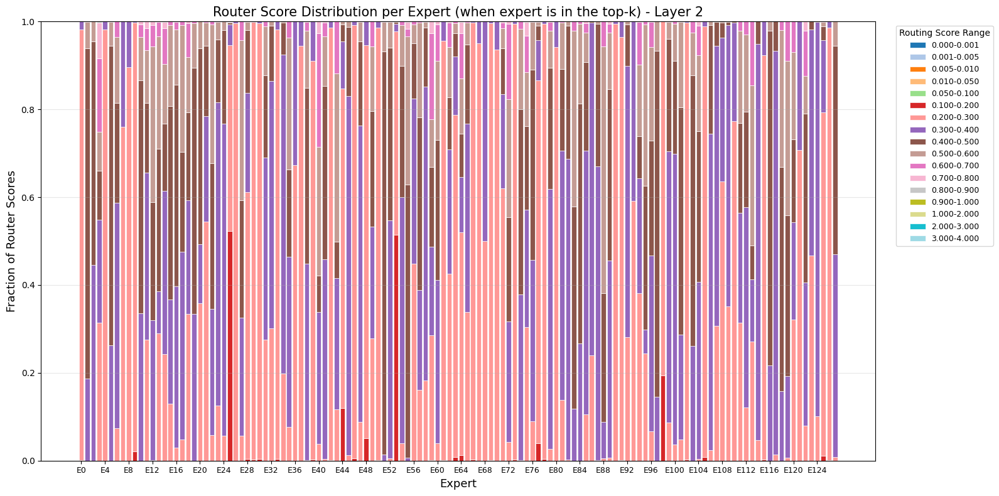

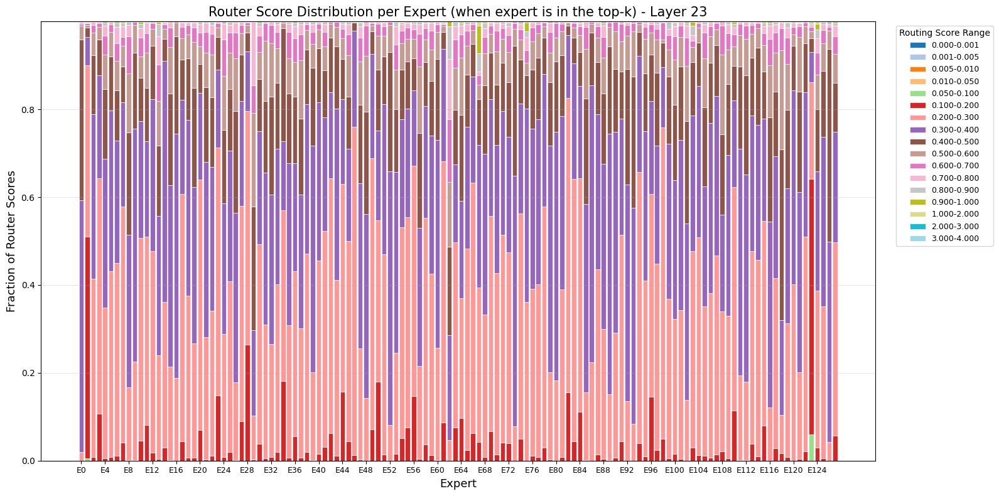

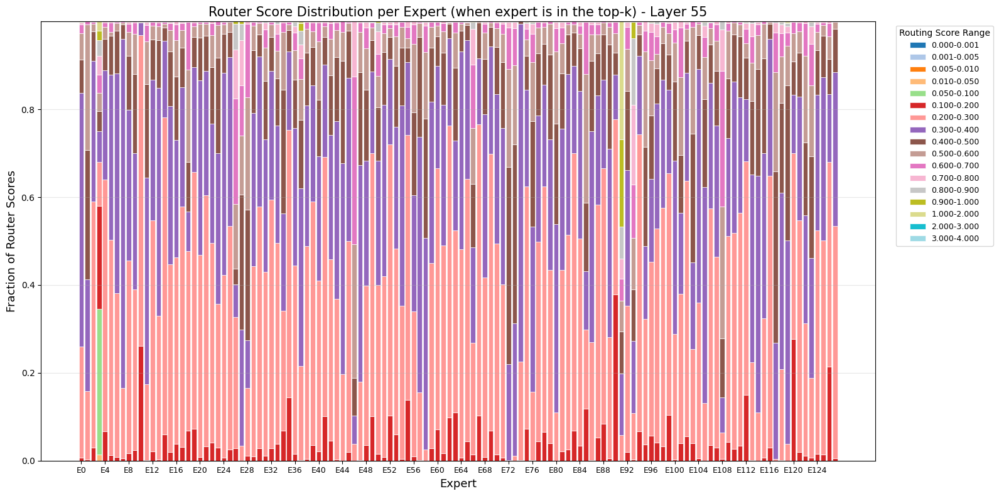

In [8]:
trinity_per_expert_probs = get_per_expert_router_distribution(trinity_subject_list)
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=2, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=23, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=55, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Mean deactivated TopK experts by threshold per layer

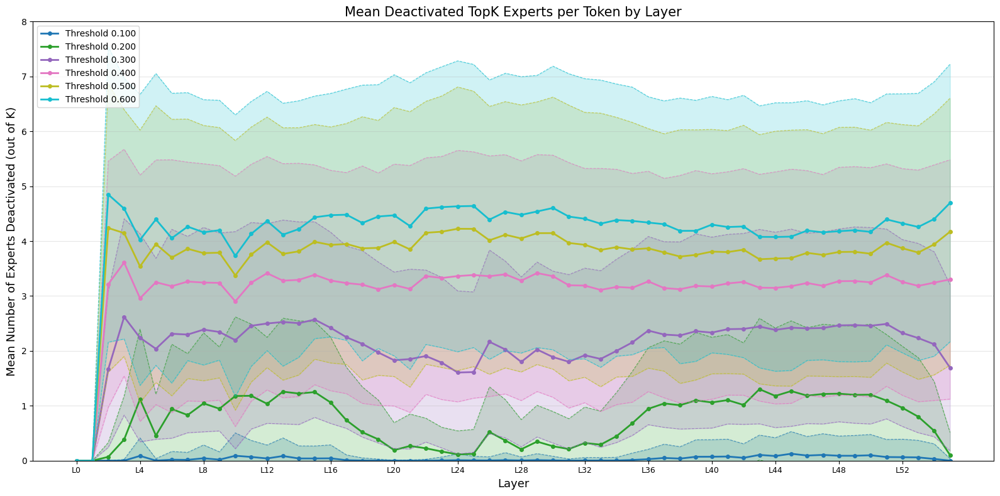

In [9]:
_ = plot_deactivated_experts_by_threshold(trinity_subject_list, [0.1, 0.2, 0.3, 0.4, 0.5, 0.6])

## MMLU PRO

In [10]:
trinity_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/TIGER-Lab-MMLU-Pro"
trinity_root_path = os.path.expandvars(trinity_root_path)

trinity_subject_list = create_dataset_routing_statistics(trinity_root_path)

Found: biology/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/TIGER-Lab-MMLU-Pro/biology/EN/router_distributions.pt
Found: chemistry/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/TIGER-Lab-MMLU-Pro/chemistry/EN/router_distributions.pt
Found: physics/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/TIGER-Lab-MMLU-Pro/physics/EN/router_distributions.pt
Found: engineering/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/TIGER-Lab-MMLU-Pro/engineering/EN/router_distributions.pt
Found: economics/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/TIGER-Lab-

### Global router distribution

Global probs shape: torch.Size([832659264])


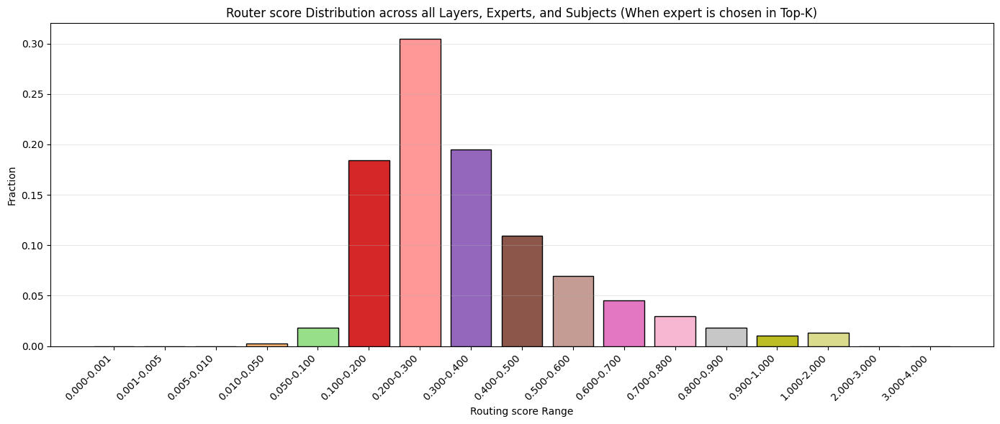

In [11]:
trinity_global_probs = get_global_router_distribution(trinity_subject_list)
print(f"Global probs shape: {trinity_global_probs.shape}")

plot_router_distribution(trinity_global_probs, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Per layer distribution

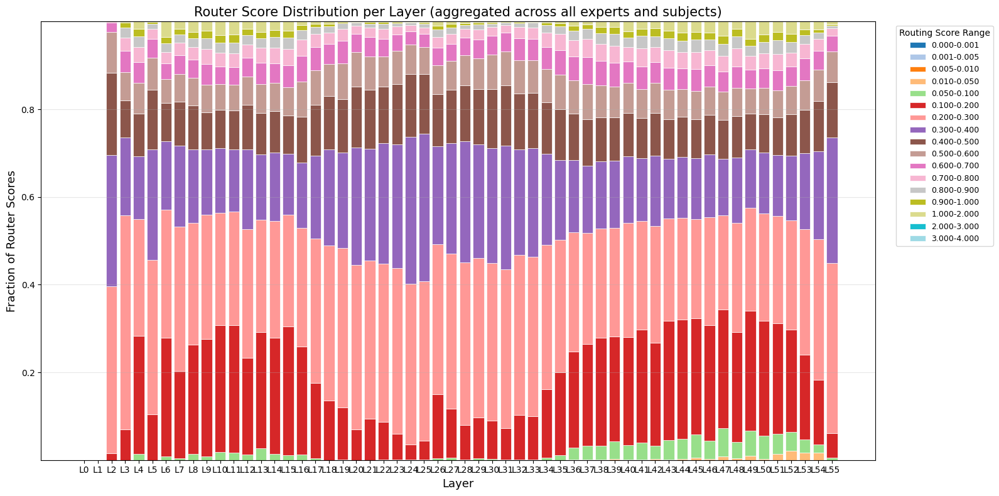

In [12]:
trinity_per_layer_probs = get_per_layer_router_distribution(trinity_subject_list)
plot_per_layer_router_distribution(trinity_per_layer_probs, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Per Expert router distribution

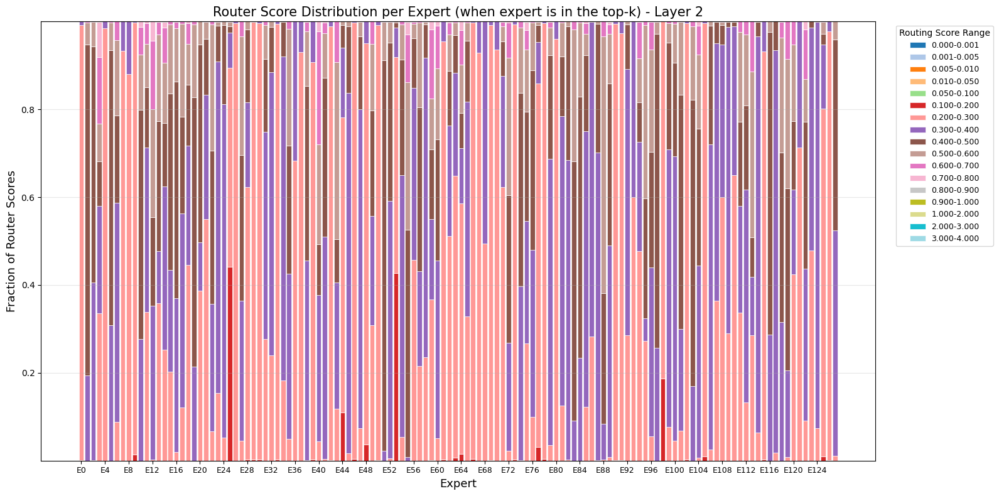

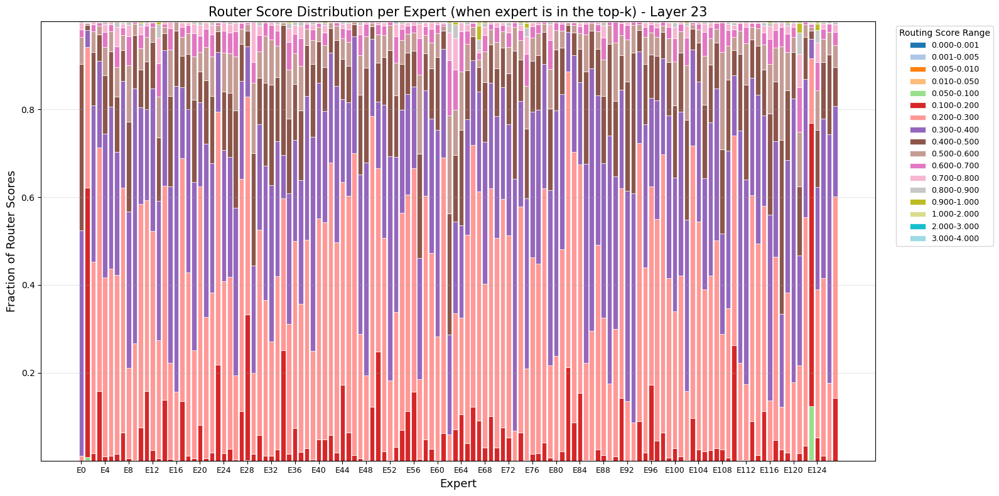

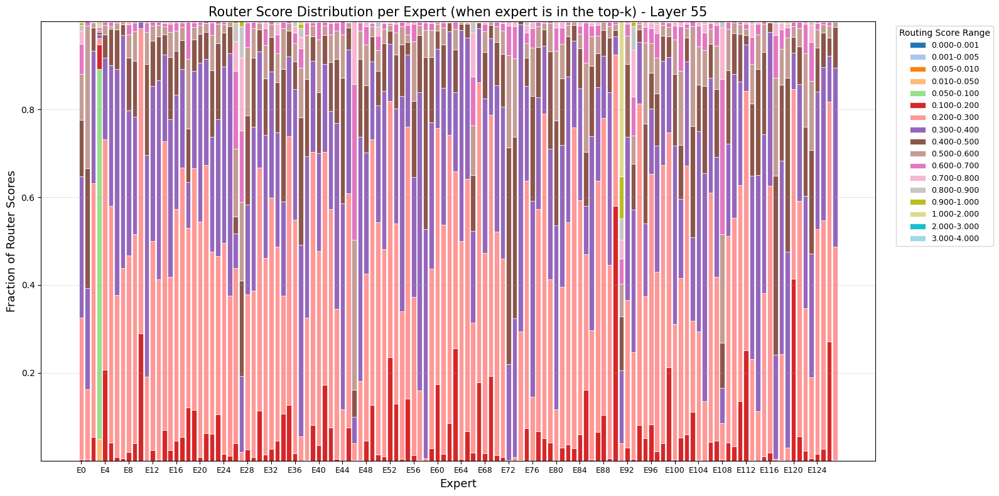

In [13]:
trinity_per_expert_probs = get_per_expert_router_distribution(trinity_subject_list)
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=2, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=23, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=55, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Mean deactivated TopK experts by threshold per layer

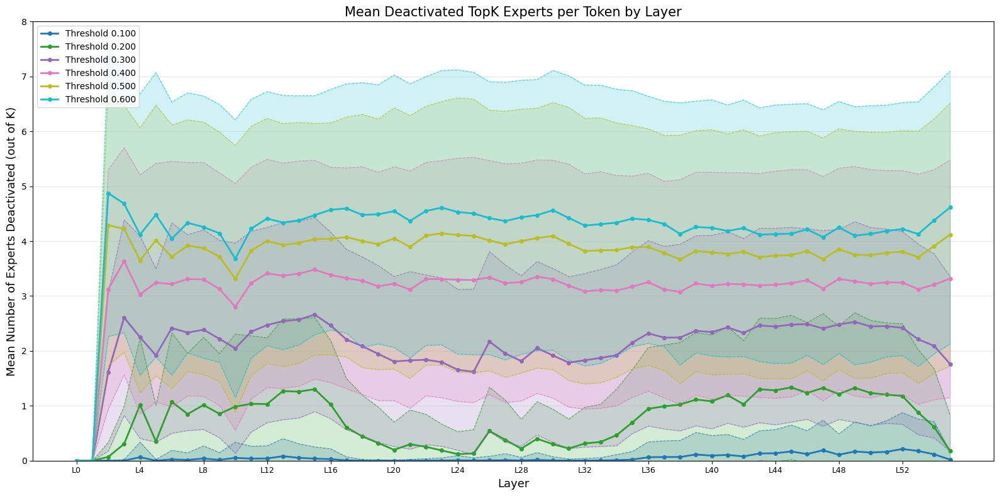

In [14]:
_ = plot_deactivated_experts_by_threshold(trinity_subject_list, [0.1, 0.2, 0.3, 0.4, 0.5, 0.6])

## Hellaswag

In [15]:
trinity_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/Rowan-hellaswag"
trinity_root_path = os.path.expandvars(trinity_root_path)

trinity_subject_list = create_dataset_routing_statistics(trinity_root_path)

Found: general/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/Rowan-hellaswag/general/EN/router_distributions.pt


### Global router distribution

Global probs shape: torch.Size([219392064])


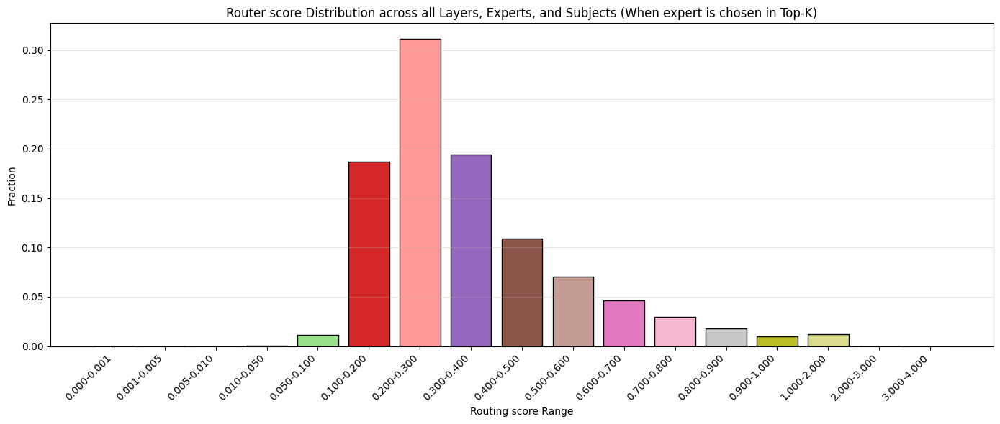

In [16]:
trinity_global_probs = get_global_router_distribution(trinity_subject_list)
print(f"Global probs shape: {trinity_global_probs.shape}")

plot_router_distribution(trinity_global_probs, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Per layer distribution

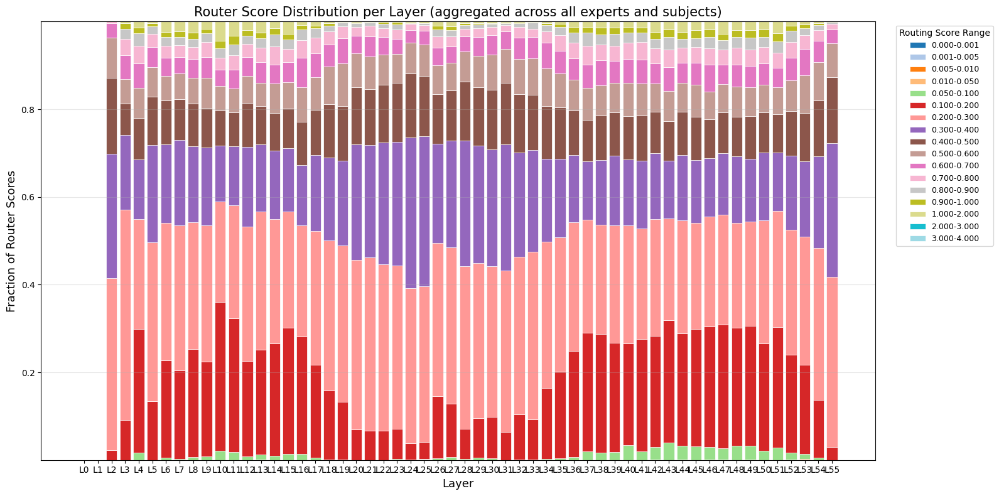

In [17]:
trinity_per_layer_probs = get_per_layer_router_distribution(trinity_subject_list)
plot_per_layer_router_distribution(trinity_per_layer_probs, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Per Expert router distribution

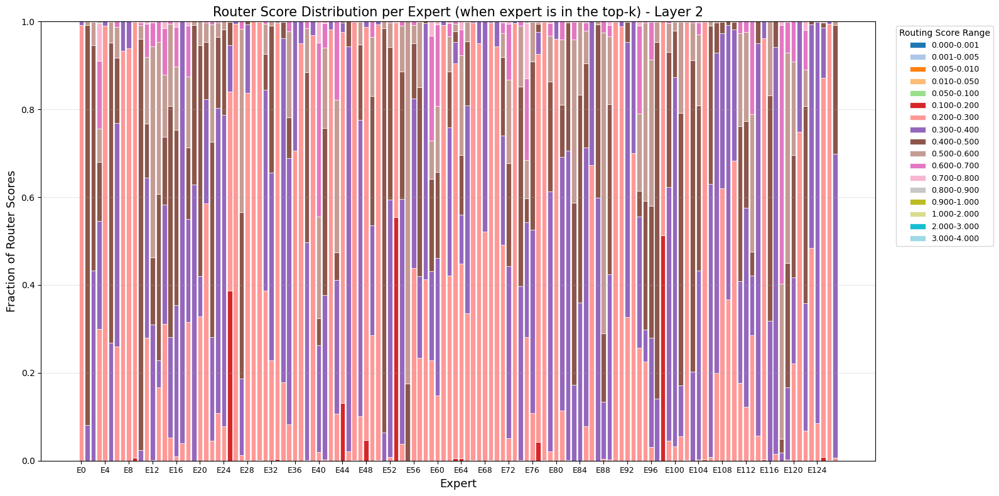

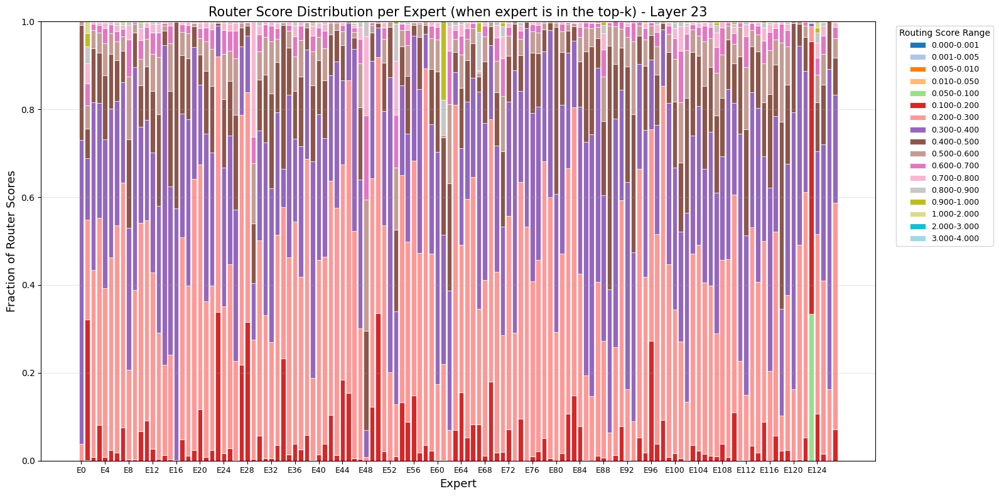

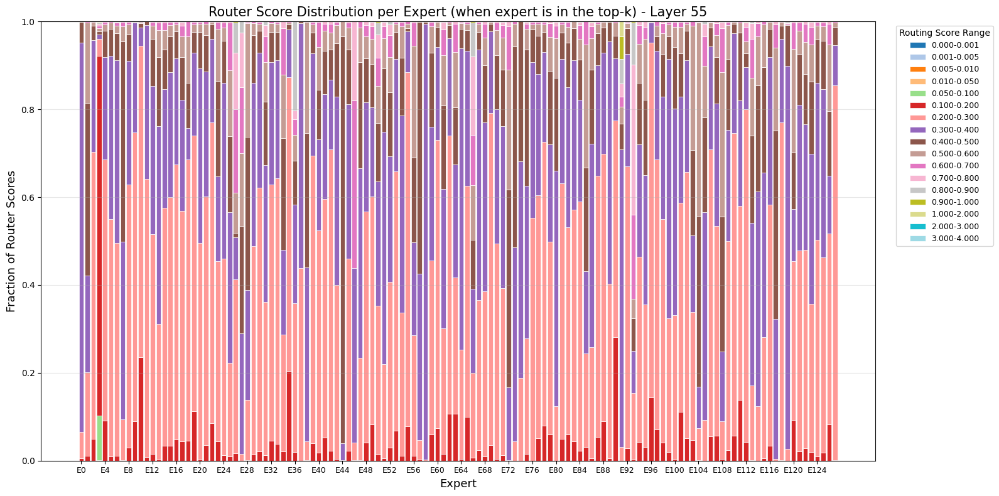

In [18]:
trinity_per_expert_probs = get_per_expert_router_distribution(trinity_subject_list)
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=2, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=23, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=55, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Mean deactivated TopK experts by threshold per layer

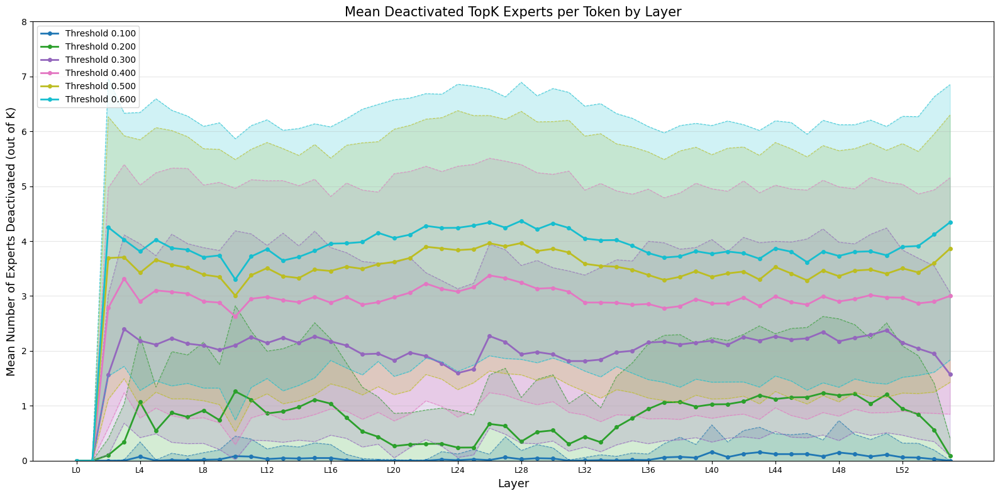

In [19]:
_ = plot_deactivated_experts_by_threshold(trinity_subject_list, [0.1, 0.2, 0.3, 0.4, 0.5, 0.6])

## ARC

In [20]:
trinity_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/allenai-ai2_arc"
trinity_root_path = os.path.expandvars(trinity_root_path)

trinity_subject_list = create_dataset_routing_statistics(trinity_root_path)

Found: ARC-Challenge/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/allenai-ai2_arc/ARC-Challenge/EN/router_distributions.pt
Found: ARC-Easy/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/allenai-ai2_arc/ARC-Easy/EN/router_distributions.pt


### Global router distribution

Global probs shape: torch.Size([36817200])


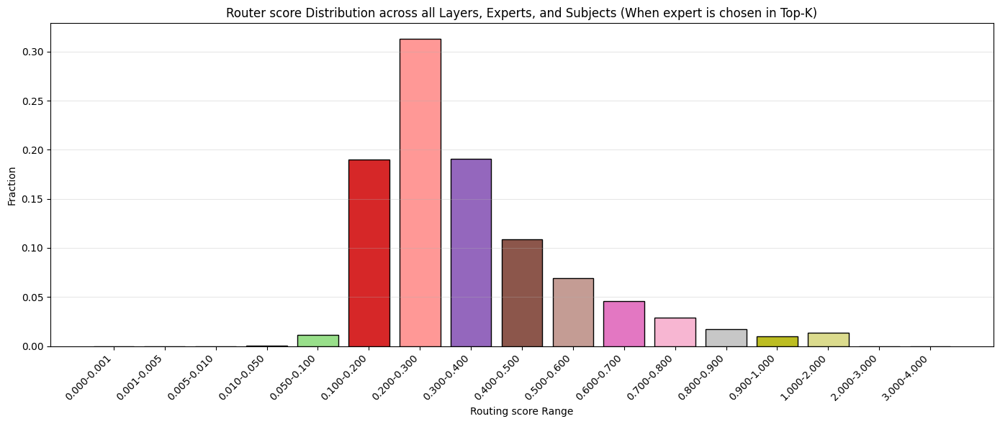

In [21]:
trinity_global_probs = get_global_router_distribution(trinity_subject_list)
print(f"Global probs shape: {trinity_global_probs.shape}")

plot_router_distribution(trinity_global_probs, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Per layer distribution

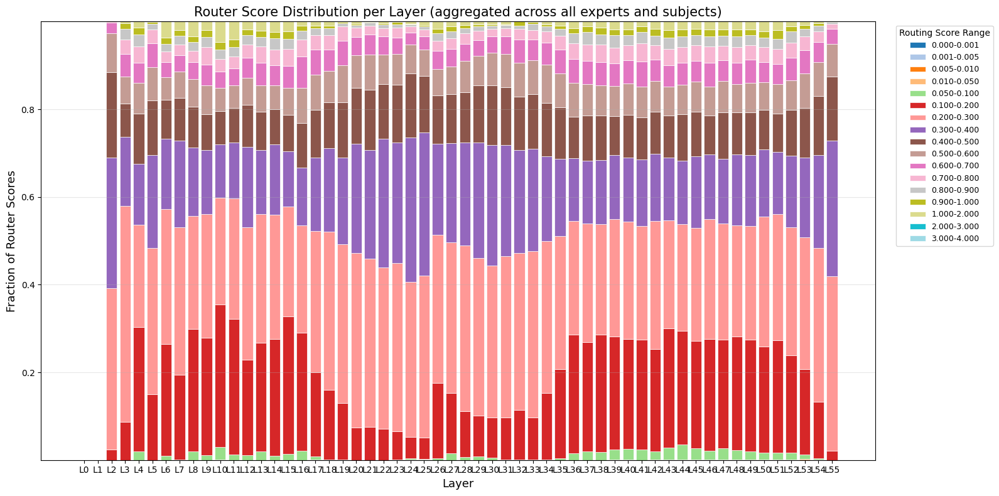

In [22]:
trinity_per_layer_probs = get_per_layer_router_distribution(trinity_subject_list)
plot_per_layer_router_distribution(trinity_per_layer_probs, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Per Expert router distribution

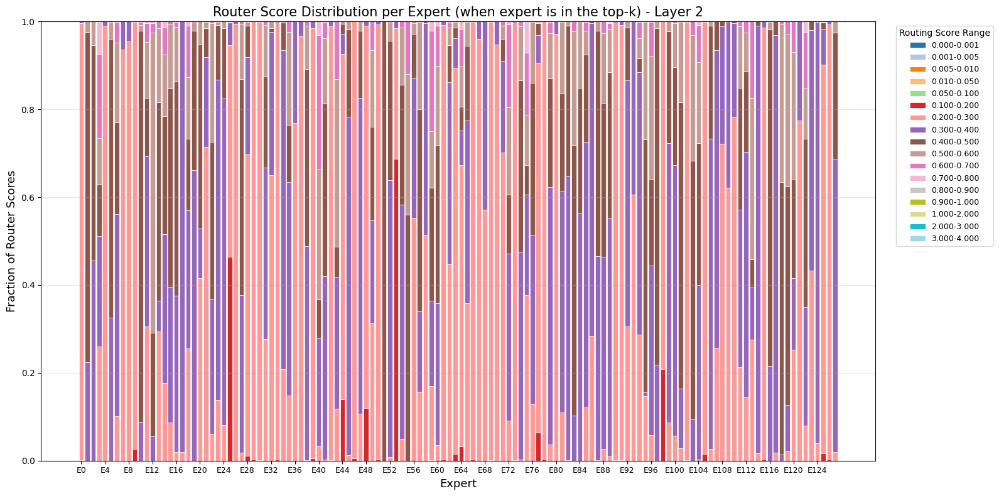

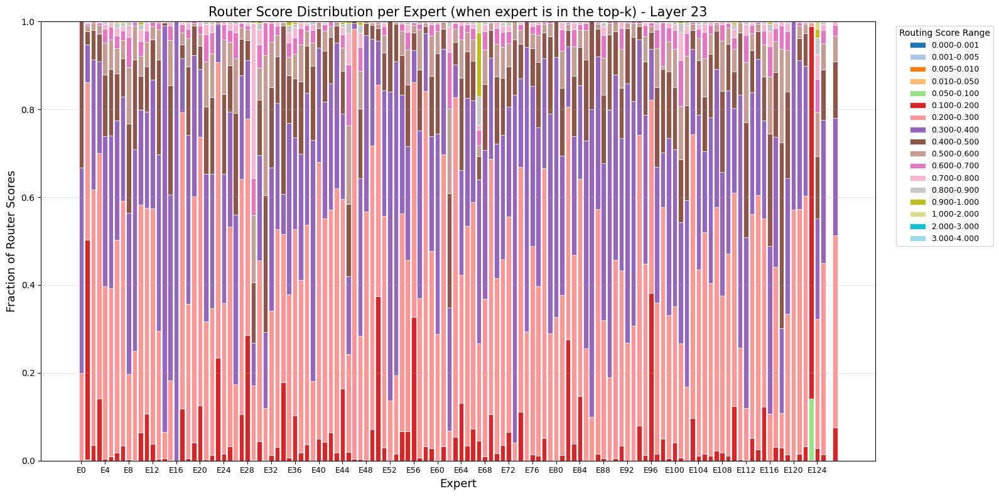

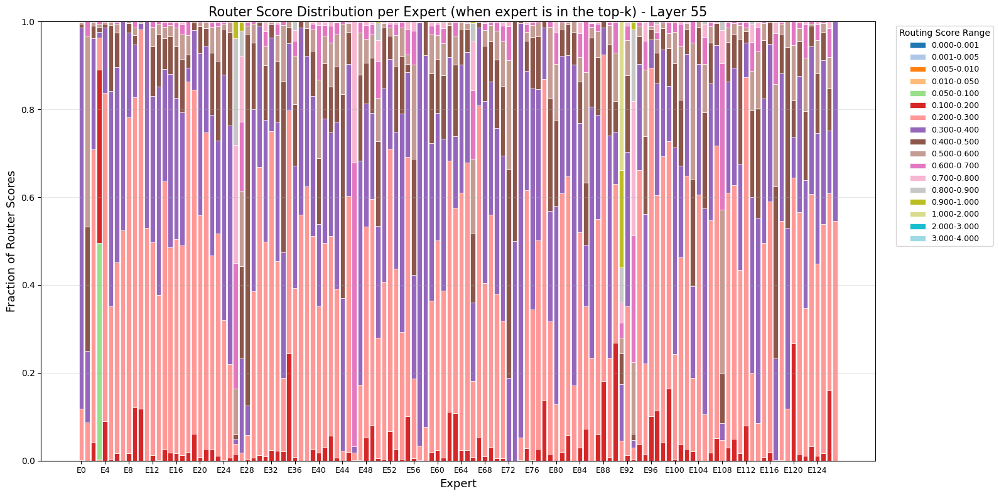

In [23]:
trinity_per_expert_probs = get_per_expert_router_distribution(trinity_subject_list)
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=2, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=23, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=55, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Mean deactivated TopK experts by threshold per layer

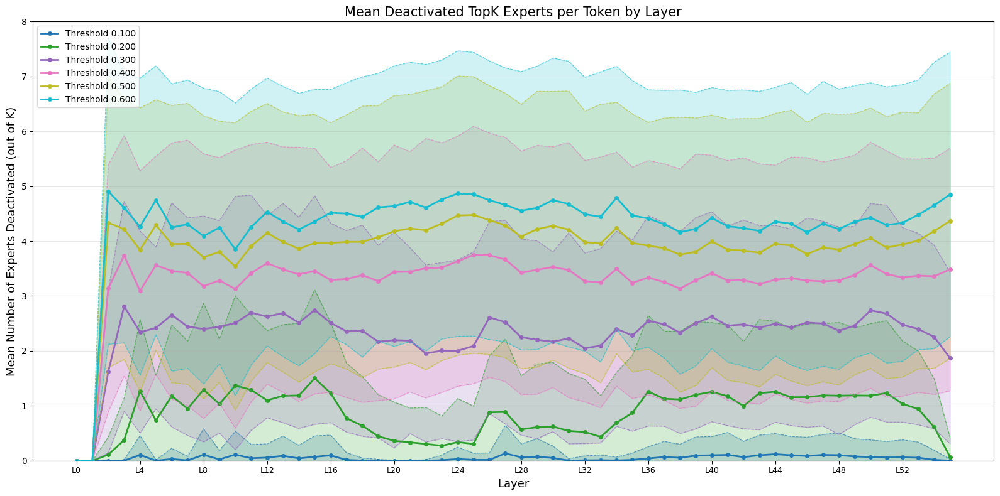

In [24]:
_ = plot_deactivated_experts_by_threshold(trinity_subject_list, [0.1, 0.2, 0.3, 0.4, 0.5, 0.6])

## Winogrande

In [25]:
trinity_root_path = "$SCRATCH/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/allenai-winogrande"
trinity_root_path = os.path.expandvars(trinity_root_path)

trinity_subject_list = create_dataset_routing_statistics(trinity_root_path)

Found: winogrande_xl/EN/router_distributions.pt
/iopsstor/scratch/cscs/anowak/moe-router-exploration-data/router_prob_distribution/arcee-ai-Trinity-Nano-Base/allenai-winogrande/winogrande_xl/EN/router_distributions.pt


### Global router distribution

Global probs shape: torch.Size([19386432])


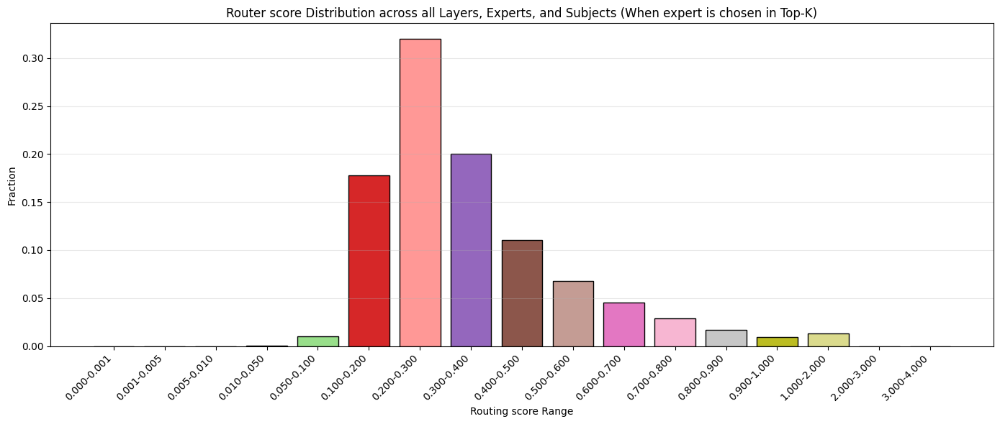

In [26]:
trinity_global_probs = get_global_router_distribution(trinity_subject_list)
print(f"Global probs shape: {trinity_global_probs.shape}")

plot_router_distribution(trinity_global_probs, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Per layer distribution

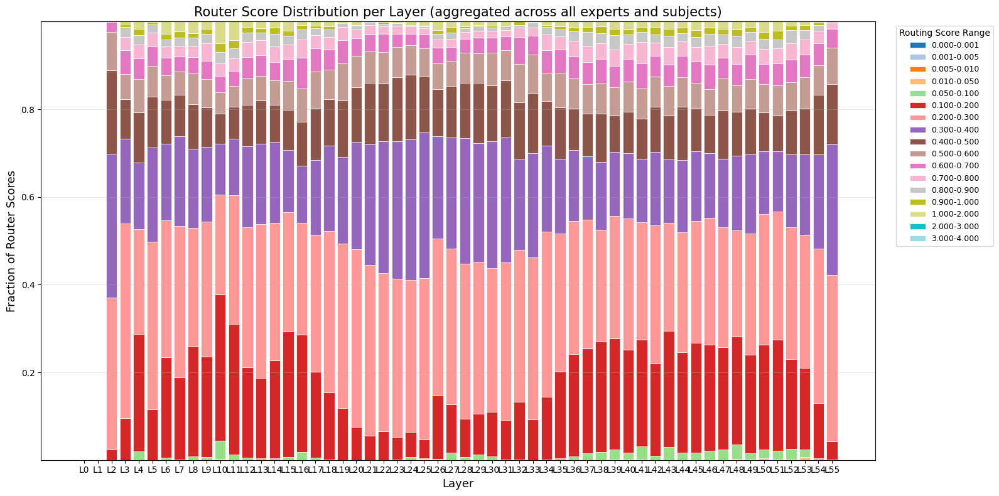

In [27]:
trinity_per_layer_probs = get_per_layer_router_distribution(trinity_subject_list)
plot_per_layer_router_distribution(trinity_per_layer_probs, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Per expert router distribution

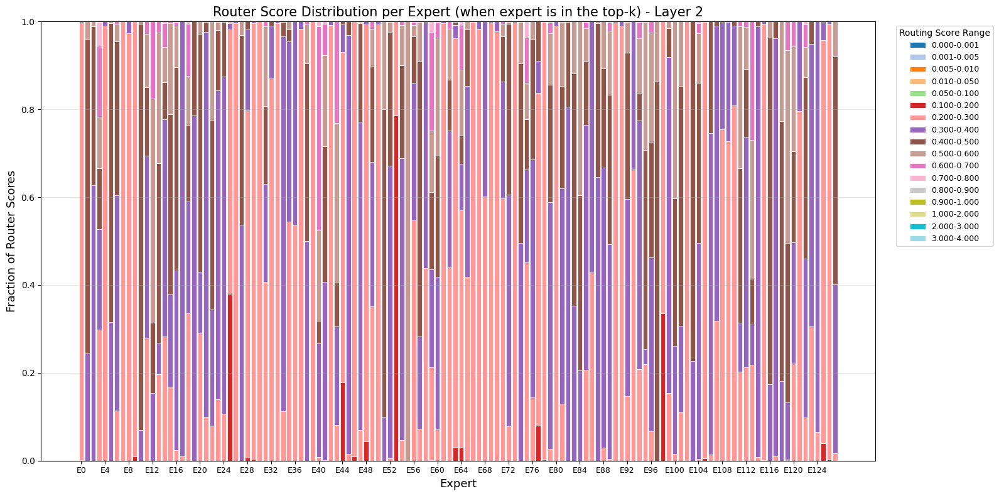

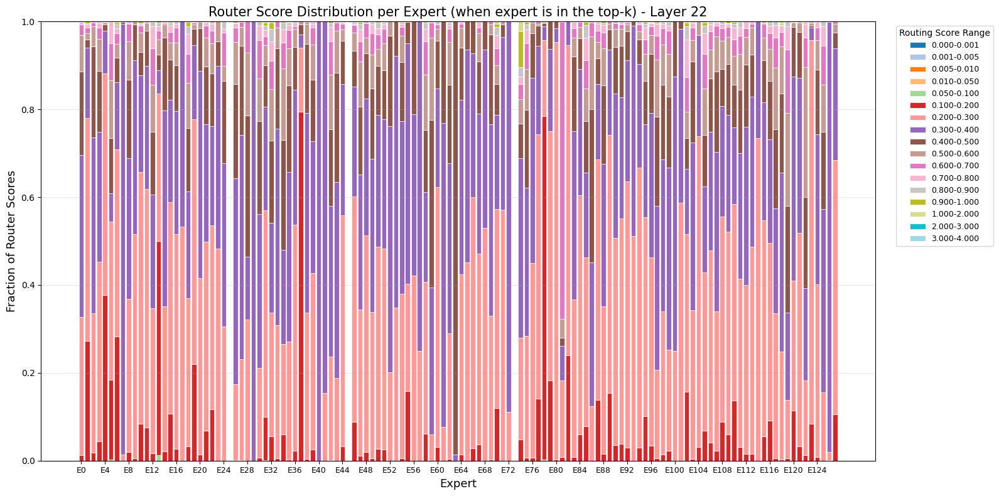

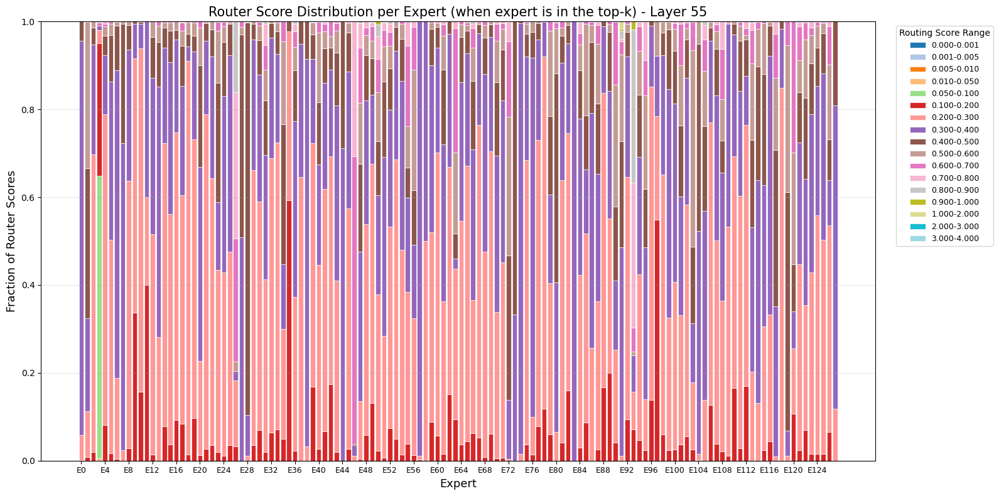

In [28]:
trinity_per_expert_probs = get_per_expert_router_distribution(trinity_subject_list)
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=2, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=22, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])
plot_per_expert_router_distribution(trinity_per_expert_probs, layer=55, bin_edges=[0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 4.0])

### Mean deactivated TopK experts by threshold per layer

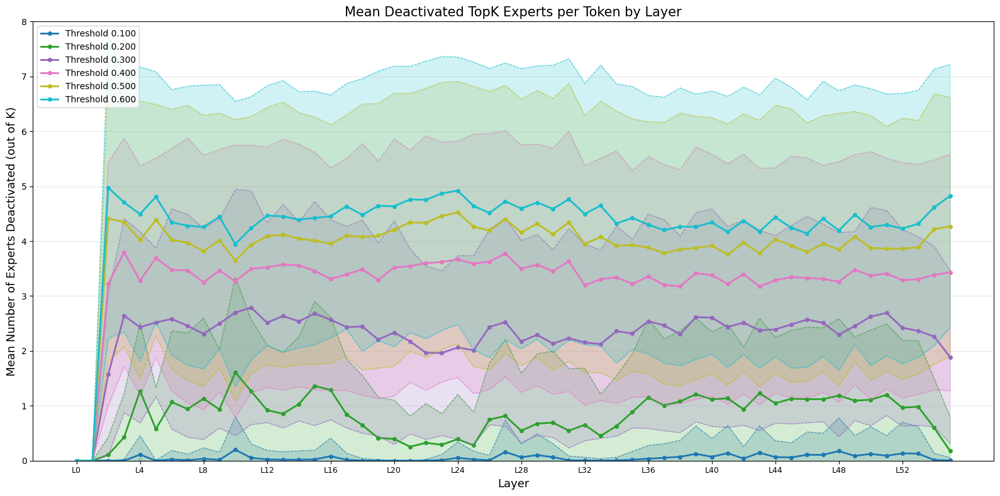

In [29]:
_ = plot_deactivated_experts_by_threshold(trinity_subject_list, [0.1, 0.2, 0.3, 0.4, 0.5, 0.6])

In [30]:
# memory cleanup

del trinity_subject_list
del trinity_global_probs
del trinity_per_layer_probs
del trinity_per_expert_probs

# Evaluations

**Evaluation results removing expert outputs that have a router prob below a threshold $T$**

For the weighted sum $\sum^N_{j=1} g_j(x_i)E_j(x_i)$, we do $g(x_i)=0$ if $g(x_i)<T$ for the probability (or score) values of the top-k experts selected for token $i$.

The idea is that maybe the router learns to even in the top-k values give a low score to many of the experts sometimes for some tokens (so as to also help specialize the models so they don't get signal they don't care about), so based on this idea that maybe it is possible to not do computation for some experts without doing this idea of zero-experts by training the model from scratch

*For Arcee trinity we do the threshold after the scaling of the router scores with the router scale `top_scores = top_scores * module.route_scale`, if we would do it before the scaling we would have e.g. a score of 0.4 is $0.4 \cdot 2.826=1.1304$ (from https://huggingface.co/arcee-ai/Trinity-Nano-Base/blob/main/config.json), so doing the threshold for the values below 0.1 means the values below $\approx0.3$ (more exact below $2.826$). We mention this because in the exploration above in the datasets is based on the values after the router scaling*

In [31]:
import json
import pandas as pd
import os
import matplotlib.pyplot as plt

In [32]:
eval_results_path = "eval_results/moe_router_distribution_eval"
all_models = os.listdir(eval_results_path)
benchmarks_list = ["hellaswag", "arc_easy", "winogrande", "mmlu", "arc_challenge", "lambada_openai_mt_stablelm_es", "lambada_openai_mt_stablelm_en","lambada_openai_mt_stablelm_de","lambada_openai_mt_stablelm_fr"]

def get_model_results_dataframe(eval_results_path, all_models):
    all_results = []
    
    for model_name in all_models:
        path = os.path.join(eval_results_path, model_name)
        
        if not os.path.isdir(path):
            continue
        
        result = os.listdir(path)
        
        for file_name in result:
            if file_name.endswith(".json"):
                file_path = os.path.join(path, file_name)
        
                with open(file_path, "r") as f:
                    data = json.load(f)
                    
                    row = {
                        "model_name": model_name,
                        "prob_threshold": data["model_info"]["prob_threshold"],
                    }
                    
                    for benchmark, metrics in data["results"].items():
                        if benchmark not in benchmarks_list:
                            continue
                        for metric, value in metrics.items():
                            if metric != "alias" and "stderr" not in metric:
                                row[f"{benchmark}_{metric}"] = value
                    
                    all_results.append(row)
    
    return pd.DataFrame(all_results)

model_results_df = get_model_results_dataframe(eval_results_path, all_models)
model_results_df

,model_name,prob_threshold,"hellaswag_acc,none","hellaswag_acc_norm,none","arc_easy_acc,none","arc_easy_acc_norm,none","winogrande_acc,none","mmlu_acc,none","arc_challenge_acc,none","arc_challenge_acc_norm,none","lambada_openai_mt_stablelm_es_perplexity,none","lambada_openai_mt_stablelm_es_acc,none","lambada_openai_mt_stablelm_en_perplexity,none","lambada_openai_mt_stablelm_en_acc,none","lambada_openai_mt_stablelm_de_perplexity,none","lambada_openai_mt_stablelm_de_acc,none","lambada_openai_mt_stablelm_fr_perplexity,none","lambada_openai_mt_stablelm_fr_acc,none"
0,deepseek-moe,0.00,0.580362,0.773153,0.760943,0.728535,0.699290,0.377724,0.433447,0.455631,5.874810e+01,0.488453,3.306001e+00,0.728314,9.497602e+00,0.551912,9.743261e+00,0.570541
1,deepseek-moe,0.01,0.580562,0.772954,0.760943,0.728956,0.696133,0.377297,0.430887,0.455631,5.879355e+01,0.487871,3.309790e+00,0.730060,9.516604e+00,0.552106,9.753018e+00,0.571318
2,deepseek-moe,0.05,0.576678,0.767078,0.756734,0.725168,0.700079,0.378507,0.422355,0.449659,6.019791e+01,0.485542,3.340643e+00,0.723462,9.932394e+00,0.545702,1.014818e+01,0.565690
3,deepseek-moe,0.10,0.508962,0.683928,0.696128,0.663721,0.631413,0.275744,0.360922,0.379693,1.483118e+02,0.369105,4.598690e+00,0.667766,7.958198e+01,0.303318,3.899086e+01,0.415486
4,gptoss,0.00,0.416053,0.577475,0.773990,0.752104,0.656669,0.563239,0.455631,0.481229,8.083968e+02,0.178925,1.870426e+02,0.202600,1.177315e+02,0.271686,1.974203e+02,0.230351
5,gptoss,0.01,0.415156,0.579267,0.775673,0.753788,0.659037,0.563880,0.455631,0.480375,8.096932e+02,0.177761,1.874204e+02,0.202989,1.179866e+02,0.272657,1.978554e+02,0.228799
6,gptoss,0.05,0.415156,0.579964,0.775253,0.754630,0.662194,0.564165,0.450512,0.488908,8.067605e+02,0.177178,1.869112e+02,0.203377,1.166846e+02,0.273433,1.965463e+02,0.231904
7,gptoss,0.10,0.416650,0.580960,0.776936,0.752946,0.660616,0.567227,0.452218,0.486348,7.616169e+02,0.181642,1.822688e+02,0.206482,1.124249e+02,0.276732,1.876551e+02,0.234427
8,gptoss,0.20,0.408285,0.559351,0.754630,0.726431,0.646409,0.504202,0.426621,0.456485,8.099159e+02,0.179701,1.978033e+02,0.189986,1.132839e+02,0.280225,1.858919e+02,0.234621
9,olmoe,0.00,0.584943,0.782414,0.769781,0.768519,0.687451,0.535038,0.467577,0.496587,1.505098e+02,0.372404,3.773346e+00,0.708713,3.144658e+01,0.403842,4.476344e+01,0.397827


In [33]:
def plot_model_performance(model_results_df, model_name, benchmarks: list[str]):
    """
    Plot all benchmark metrics (both acc and acc_norm) on the same graph for a specific model.

    Args:
        model_results_df: DataFrame with columns [model_name, prob_threshold, benchmark metrics]
        model_name: Name of the model to visualize
    """
    model_data = model_results_df[model_results_df["model_name"] == model_name].sort_values("prob_threshold")

    if model_data.empty:
        print(f"No data found for model: {model_name}")
        return

    plt.figure(figsize=(12, 6))

    colors = plt.cm.tab10(range(len(benchmarks)))

    for idx, benchmark in enumerate(benchmarks):
        acc_col = f"{benchmark}_acc,none"
        acc_norm_col = f"{benchmark}_acc_norm,none"
        perplexity_col = f"{benchmark}_perplexity,none"

        if acc_col in model_data.columns:
            line = plt.plot(model_data["prob_threshold"], model_data[acc_col],
                    marker='o', label=f"{benchmark} (acc)", linewidth=2,
                    markersize=8, color=colors[idx], linestyle='-')
            for x, y in zip(model_data["prob_threshold"], model_data[acc_col]):
                plt.annotate(f'{y:.3f}', xy=(x, y), xytext=(0, 8),
                           textcoords='offset points', fontsize=7, ha='center',
                           bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='none', alpha=0.7))

        if acc_norm_col in model_data.columns:
            line = plt.plot(model_data["prob_threshold"], model_data[acc_norm_col],
                    marker='s', label=f"{benchmark} (acc_norm)", linewidth=2,
                    markersize=7, color=colors[idx], linestyle='--', alpha=0.8)
            for x, y in zip(model_data["prob_threshold"], model_data[acc_norm_col]):
                plt.annotate(f'{y:.3f}', xy=(x, y), xytext=(0, -12),
                           textcoords='offset points', fontsize=7, ha='center',
                           bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='none', alpha=0.7))

    plt.xlabel("Probability Threshold", fontsize=13)
    plt.ylabel("Accuracy", fontsize=13)
    plt.title(f"{model_name}: Performance vs Probability Threshold", fontsize=15, fontweight='bold')
    plt.legend(fontsize=8, bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(12, 6))

    for idx, benchmark in enumerate(benchmarks):
        perplexity_col = f"{benchmark}_perplexity,none"

        if perplexity_col in model_data.columns:
            line = plt.plot(model_data["prob_threshold"], model_data[perplexity_col],
                    marker='^', label=f"{benchmark} (perplexity)", linewidth=2,
                    markersize=7, color=colors[idx], linestyle='-.', alpha=0.8)
            for x, y in zip(model_data["prob_threshold"], model_data[perplexity_col]):
                plt.annotate(f'{y:.2f}', xy=(x, y), xytext=(0, 8),
                           textcoords='offset points', fontsize=7, ha='center',
                           bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='none', alpha=0.7))

    plt.xlabel("Probability Threshold", fontsize=13)
    plt.ylabel("Perplexity", fontsize=13)
    plt.title(f"{model_name}: Perplexity vs Probability Threshold", fontsize=15, fontweight='bold')
    plt.legend(fontsize=8, bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

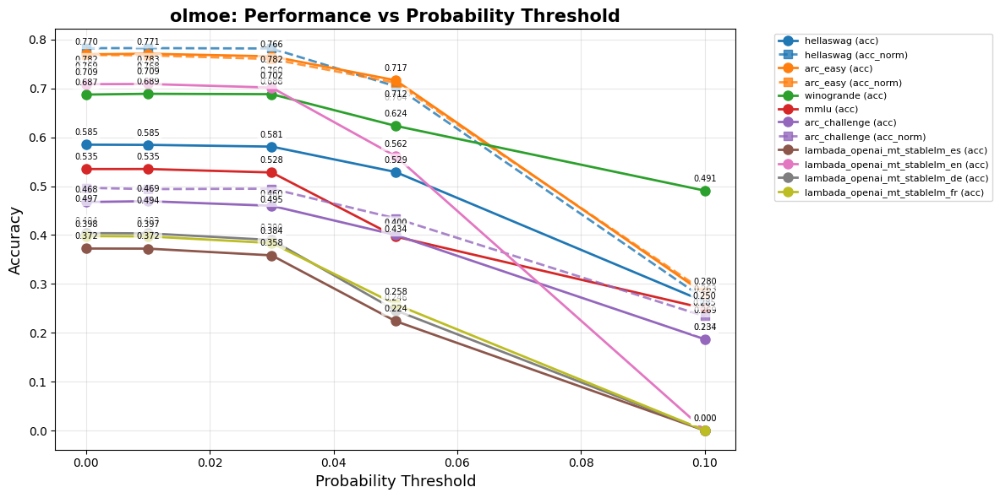

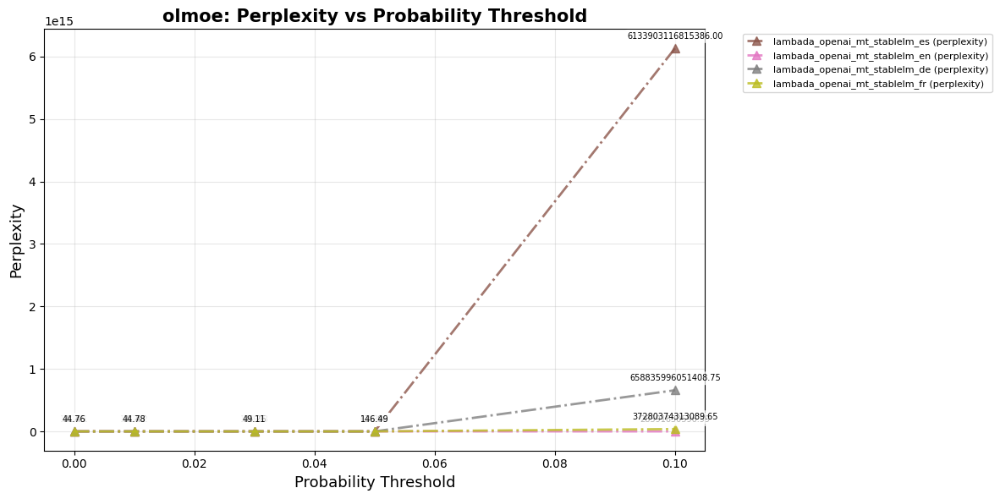

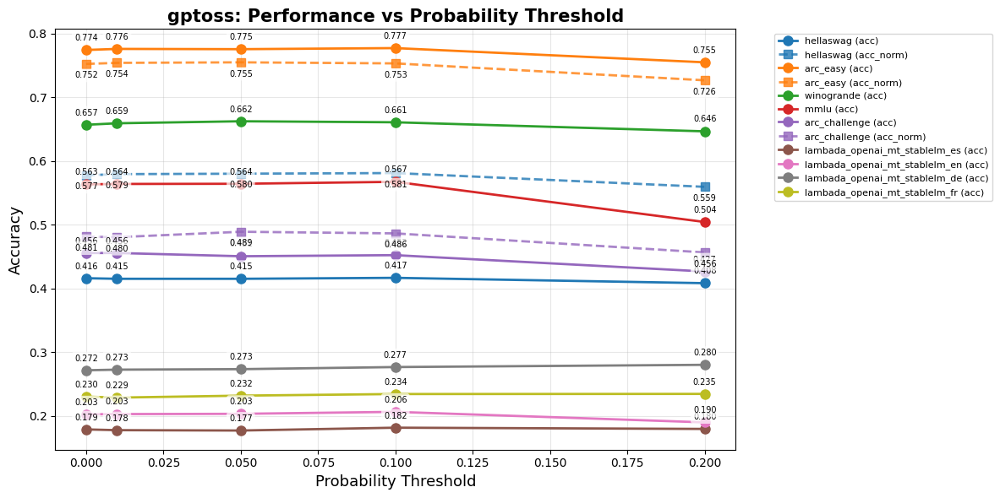

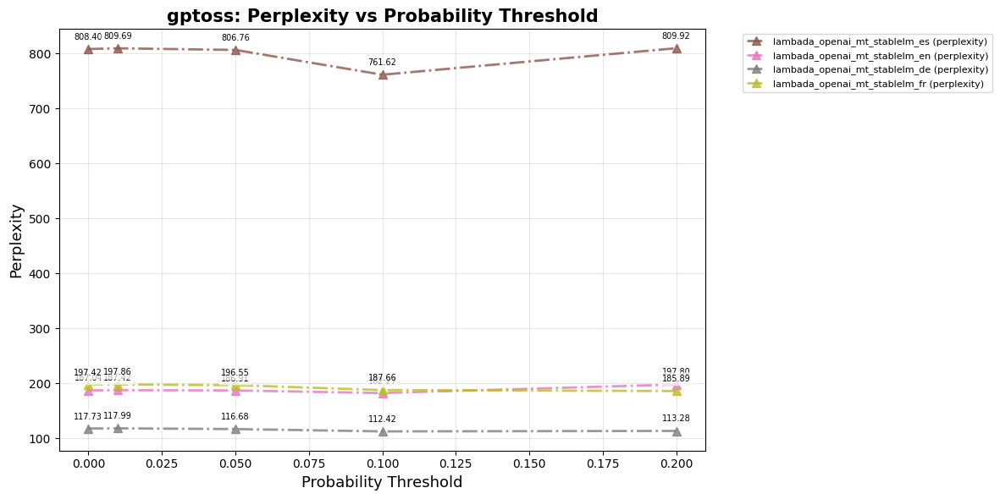

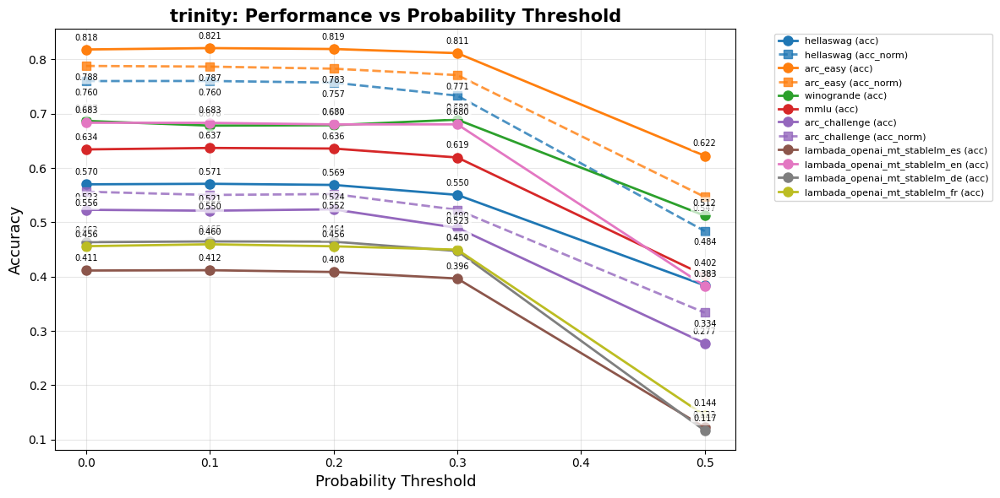

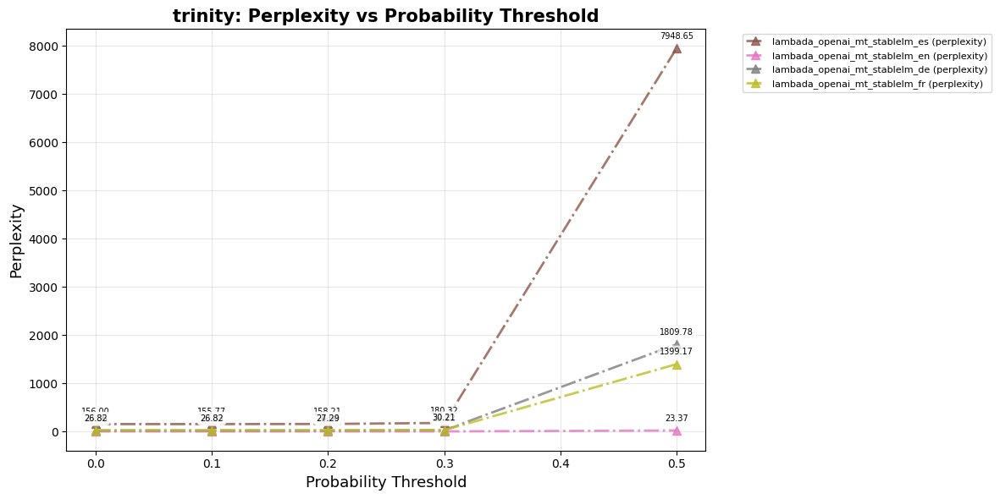

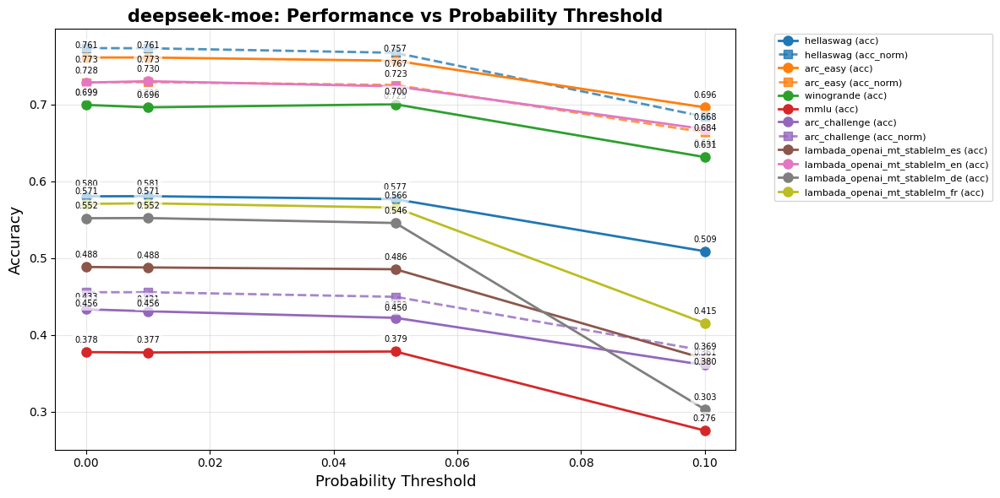

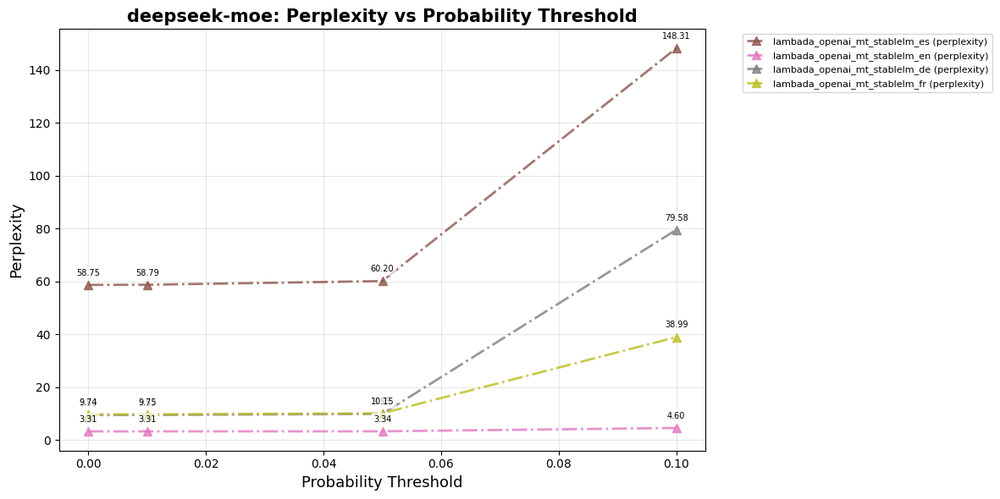

In [34]:
plot_model_performance(model_results_df, "olmoe", benchmarks_list)
plot_model_performance(model_results_df, "gptoss", benchmarks_list)
plot_model_performance(model_results_df, "trinity", benchmarks_list)
plot_model_performance(model_results_df, "deepseek-moe", benchmarks_list)

# Conclusion

Just a small conclusion for now:
It seems interesting to me that even if we have a very high router score, like in the trinity because of the router scaling, even if we deactivate some of the experts the performance doesn't drop.

Based on this I thought what if maybe we are putting to much emphasis to the router to study the idea of the expert "specialization" and what if maybe the experts are the ones that are also learning to what tokens they want to work with, because based on this results, wouldn't this mean that the experts are the ones that are giving a very low value to the tokens in their FFN operation and they are basically learning $f: x \rightarrow 0$ for that token so as to let other experts in the topk work on the token or even just use the identity of the residual (I understand that part of the idea of the residual apart of the vanishing gradient is that it is easier to learn $f: x \rightarrow 0$ than $f: x \rightarrow x$). 

So here, even though the router is deciding to grab these experts with a prob (or score as in the case of only auxiliary-loss free balancing without the help of an auxiliary balancing loss) thats not so small compared to what it seems the expert cares about that token, and I think maybe this is probably because of the auxiliary balancing loss, as compared to the auxiliary-loss free method with the bias, this one does affect the router scores directly as it is modifying the logits so the values in the end represent a uniform distribution. Compare this to using only and only the auxiliary-loss free balancing method, this one doesn't modify the scores of the router directly, it just adds a value the output of the gate of the router before doing the top-k (and this value is not used in the weighted sum of the experts). So in the case of auxiliary-loss free balancing, maybe the router can learn more about how it wants to affect the value of expert in the weighted sum, the thing is none of the MoE models here are auxiliary-loss free only (there is a possibility that trinity is, but I think they do the same thing as deepseek-v3 and Nemotron-3, where they use the auxiliary-loss free method in conjuction with an auxiliary balancing loss).

So maybe when we study MoE specialization we should maybe also peek at the expert’s raw router score for that token, because maybe the expert doesn't want to work with that token, but because we need to have K experts for a given token it is still chosen by the router and the router maybe is just learning more about how to distribute the work based on the balancing loss we are applying to it and thats why it still outputs a somewhat big score for that expert in the weighted sum.